In [1]:
import os
import glob
from collections import defaultdict, Counter
import pandas as pd

class NutDatasetAnalyzer:
    def __init__(self, base_path="/kaggle/input/dataset1"):
        self.base_path = base_path
        self.target_classes = {15, 16, 17, 18}  # nut1, nut2, nut3, nut4
        self.class_names = {15: "nut1", 16: "nut2", 17: "nut3", 18: "nut4"}
        
        # Results storage
        self.results = {
            'correct_files': [],
            'incorrect_files': [],
            'empty_files': [],
            'missing_files': [],
            'class_distribution': Counter(),
            'folder_analysis': defaultdict(dict)
        }
    
    def find_all_folders(self):
        """Find all folders containing images and annotations"""
        folders = []
        for root, dirs, files in os.walk(self.base_path):
            # Check if folder contains image files
            image_files = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
            if image_files:
                folders.append(root)
        return folders
    
    def load_annotation_file(self, txt_path):
        """Load and parse a YOLO annotation file"""
        try:
            with open(txt_path, 'r') as f:
                lines = f.readlines()
            
            annotations = []
            for line in lines:
                line = line.strip()
                if line:
                    parts = line.split()
                    if len(parts) >= 5:  # class_id, x, y, w, h
                        class_id = int(parts[0])
                        bbox = [float(x) for x in parts[1:5]]
                        annotations.append({
                            'class_id': class_id,
                            'bbox': bbox
                        })
            return annotations
        except Exception as e:
            print(f"Error reading {txt_path}: {e}")
            return None
    
    def analyze_folder(self, folder_path):
        """Analyze a single folder for class IDs"""
        folder_name = os.path.basename(folder_path)
        print(f"\n📁 Analyzing folder: {folder_name}")
        
        # Find all image files
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
        image_files = []
        for ext in image_extensions:
            image_files.extend(glob.glob(os.path.join(folder_path, ext)))
            image_files.extend(glob.glob(os.path.join(folder_path, ext.upper())))
        
        folder_stats = {
            'total_images': len(image_files),
            'correct_annotations': 0,
            'incorrect_annotations': 0,
            'empty_annotations': 0,
            'missing_annotations': 0,
            'class_counts': Counter(),
            'files_with_correct_classes': [],
            'files_with_incorrect_classes': [],
            'files_with_mixed_classes': []
        }
        
        for image_path in image_files:
            # Get corresponding annotation file
            base_name = os.path.splitext(os.path.basename(image_path))[0]
            txt_path = os.path.join(folder_path, base_name + '.txt')
            
            if not os.path.exists(txt_path):
                folder_stats['missing_annotations'] += 1
                self.results['missing_files'].append({
                    'folder': folder_name,
                    'image_file': os.path.basename(image_path),
                    'expected_txt': base_name + '.txt'
                })
                continue
            
            # Load annotations
            annotations = self.load_annotation_file(txt_path)
            
            if annotations is None:
                continue
            
            if len(annotations) == 0:
                folder_stats['empty_annotations'] += 1
                self.results['empty_files'].append({
                    'folder': folder_name,
                    'file': base_name + '.txt'
                })
                continue
            
            # Analyze class IDs in this file
            file_classes = set()
            correct_classes = set()
            incorrect_classes = set()
            
            for ann in annotations:
                class_id = ann['class_id']
                file_classes.add(class_id)
                folder_stats['class_counts'][class_id] += 1
                self.results['class_distribution'][class_id] += 1
                
                if class_id in self.target_classes:
                    correct_classes.add(class_id)
                else:
                    incorrect_classes.add(class_id)
            
            # Classify this file
            file_info = {
                'folder': folder_name,
                'file': base_name,
                'classes': list(file_classes),
                'correct_classes': list(correct_classes),
                'incorrect_classes': list(incorrect_classes),
                'annotation_count': len(annotations)
            }
            
            if len(incorrect_classes) == 0:
                # Only correct classes
                folder_stats['correct_annotations'] += 1
                folder_stats['files_with_correct_classes'].append(file_info)
                self.results['correct_files'].append(file_info)
            elif len(correct_classes) == 0:
                # Only incorrect classes
                folder_stats['incorrect_annotations'] += 1
                folder_stats['files_with_incorrect_classes'].append(file_info)
                self.results['incorrect_files'].append(file_info)
            else:
                # Mixed classes
                folder_stats['incorrect_annotations'] += 1
                folder_stats['files_with_mixed_classes'].append(file_info)
                self.results['incorrect_files'].append(file_info)
        
        self.results['folder_analysis'][folder_name] = folder_stats
        return folder_stats
    
    def run_complete_analysis(self):
        """Run complete analysis on all folders"""
        print("🔍 STARTING COMPREHENSIVE DATASET ANALYSIS")
        print("=" * 60)
        
        # Find all folders
        folders = self.find_all_folders()
        print(f"Found {len(folders)} folders with images")
        
        # Analyze each folder
        for folder in folders:
            self.analyze_folder(folder)
        
        # Generate summary report
        self.generate_summary_report()
        
        return self.results
    
    def generate_summary_report(self):
        """Generate comprehensive summary report"""
        print("\n" + "=" * 60)
        print("📊 COMPREHENSIVE ANALYSIS SUMMARY")
        print("=" * 60)
        
        # Overall statistics
        total_correct = len(self.results['correct_files'])
        total_incorrect = len(self.results['incorrect_files'])
        total_empty = len(self.results['empty_files'])
        total_missing = len(self.results['missing_files'])
        total_files = total_correct + total_incorrect + total_empty + total_missing
        
        print(f"\n📋 OVERALL STATISTICS:")
        print(f"  Total annotation files analyzed: {total_files}")
        print(f"  ✅ Files with ONLY correct classes (15,16,17,18): {total_correct}")
        print(f"  ❌ Files with incorrect/mixed classes: {total_incorrect}")
        print(f"  🔳 Empty annotation files: {total_empty}")
        print(f"  📄 Missing annotation files: {total_missing}")
        
        if total_files > 0:
            print(f"  📊 Accuracy: {(total_correct/total_files)*100:.1f}%")
        
        # Class distribution
        print(f"\n🎯 CLASS DISTRIBUTION:")
        print(f"  Target classes: {self.target_classes}")
        for class_id in sorted(self.results['class_distribution'].keys()):
            count = self.results['class_distribution'][class_id]
            if class_id in self.target_classes:
                class_name = self.class_names[class_id]
                print(f"  ✅ Class {class_id} ({class_name}): {count} annotations")
            else:
                print(f"  ❌ Class {class_id} (unknown): {count} annotations")
        
        # Folder-wise analysis
        print(f"\n📁 FOLDER-WISE ANALYSIS:")
        for folder_name, stats in self.results['folder_analysis'].items():
            print(f"\n  📂 {folder_name}:")
            print(f"    Total images: {stats['total_images']}")
            print(f"    ✅ Correct annotations: {stats['correct_annotations']}")
            print(f"    ❌ Incorrect annotations: {stats['incorrect_annotations']}")
            print(f"    🔳 Empty annotations: {stats['empty_annotations']}")
            print(f"    📄 Missing annotations: {stats['missing_annotations']}")
            
            if stats['total_images'] > 0:
                accuracy = (stats['correct_annotations'] / stats['total_images']) * 100
                print(f"    📊 Folder accuracy: {accuracy:.1f}%")
        
        # Show examples of incorrect files
        if self.results['incorrect_files']:
            print(f"\n⚠️  EXAMPLES OF INCORRECT FILES:")
            for i, file_info in enumerate(self.results['incorrect_files'][:5]):
                print(f"  {i+1}. {file_info['folder']}/{file_info['file']}.txt")
                print(f"     Classes found: {file_info['classes']}")
                print(f"     Incorrect classes: {file_info['incorrect_classes']}")
    
    def export_results_to_csv(self, output_path="/kaggle/working/"):
        """Export detailed results to CSV files"""
        # Correct files
        if self.results['correct_files']:
            correct_df = pd.DataFrame(self.results['correct_files'])
            correct_df.to_csv(os.path.join(output_path, 'correct_annotations.csv'), index=False)
        
        # Incorrect files
        if self.results['incorrect_files']:
            incorrect_df = pd.DataFrame(self.results['incorrect_files'])
            incorrect_df.to_csv(os.path.join(output_path, 'incorrect_annotations.csv'), index=False)
        
        # Summary statistics
        summary_data = []
        for folder_name, stats in self.results['folder_analysis'].items():
            summary_data.append({
                'folder': folder_name,
                'total_images': stats['total_images'],
                'correct_annotations': stats['correct_annotations'],
                'incorrect_annotations': stats['incorrect_annotations'],
                'empty_annotations': stats['empty_annotations'],
                'missing_annotations': stats['missing_annotations'],
                'accuracy_percent': (stats['correct_annotations'] / stats['total_images']) * 100 if stats['total_images'] > 0 else 0
            })
        
        summary_df = pd.DataFrame(summary_data)
        summary_df.to_csv(os.path.join(output_path, 'folder_summary.csv'), index=False)
        
        print(f"\n💾 Results exported to CSV files in: {output_path}")

# Usage example
def run_dataset_analysis():
    """Run the complete dataset analysis"""
    analyzer = NutDatasetAnalyzer()
    results = analyzer.run_complete_analysis()
    analyzer.export_results_to_csv()
    return results

# Execute the analysis
if __name__ == "__main__":
    print("🚀 STARTING NUT DATASET ANALYSIS")
    results = run_dataset_analysis()
    print("\n✅ Analysis complete!")

🚀 STARTING NUT DATASET ANALYSIS
🔍 STARTING COMPREHENSIVE DATASET ANALYSIS
Found 9 folders with images

📁 Analyzing folder: 3nut_left

📁 Analyzing folder: 3nut_right-20250621T140703Z-1-001

📁 Analyzing folder: 3nut_mid

📁 Analyzing folder: 1nut_R

📁 Analyzing folder: data1

📁 Analyzing folder: 3nut_bottom

📁 Analyzing folder: 1nut_B-20250622T114756Z-1-001

📁 Analyzing folder: 0nut

📁 Analyzing folder: 1nut_L-20250622T114801Z-1-001

📊 COMPREHENSIVE ANALYSIS SUMMARY

📋 OVERALL STATISTICS:
  Total annotation files analyzed: 2259
  ✅ Files with ONLY correct classes (15,16,17,18): 1968
  ❌ Files with incorrect/mixed classes: 281
  🔳 Empty annotation files: 1
  📄 Missing annotation files: 9
  📊 Accuracy: 87.1%

🎯 CLASS DISTRIBUTION:
  Target classes: {16, 17, 18, 15}
  ✅ Class 15 (nut1): 2247 annotations
  ✅ Class 16 (nut2): 1999 annotations
  ✅ Class 17 (nut3): 2233 annotations
  ✅ Class 18 (nut4): 2231 annotations
  ❌ Class 19 (unknown): 261 annotations
  ❌ Class 20 (unknown): 8 annotations

In [2]:
import os
import shutil
from collections import Counter

class SmartDataCleaner:
    def __init__(self, base_path="/kaggle/input/dataset1", output_path="/kaggle/working/cleaned_dataset"):
        self.base_path = base_path
        self.output_path = output_path
        self.target_classes = {15, 16, 17, 18}  # nut1, nut2, nut3, nut4
        self.class_names = {15: "nut1", 16: "nut2", 17: "nut3", 18: "nut4"}
        
        # Class name mapping for 3nut_mid folder
        self.class_name_mapping = {
            # nut1 variations
            'nut1': 15, 'ntu1': 15, 'ntu1w': 15, 'nut1w': 15, 'nunt1': 15,
            # nut2 variations  
            'nut2': 16, 'ntu2': 16, 'nut2w': 16, 'nut22': 16, 'nu2': 16,
            # nut3 variations
            'nut3': 17, 'ntu3': 17, 'nut3w': 17,
            # nut4 variations
            'nut4': 18, 'ntu4': 18
        }
        
        self.results = {
            'dropped_files': [],
            'fixed_3nut_mid': [],
            'failed_fixes': [],
            'copied_correct': [],
            'summary': {}
        }
    
    def create_output_structure(self):
        """Create clean output directory structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        os.makedirs(self.output_path, exist_ok=True)
    
    def load_class_names_from_file(self, txt_path):
        """Load class names from annotation file to understand the mapping"""
        try:
            with open(txt_path, 'r') as f:
                content = f.read()
            
            # Try to extract class names from comments or structure
            lines = content.strip().split('\n')
            class_info = []
            
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    class_info.append(class_id)
            
            return class_info
        except:
            return []
    
    def fix_3nut_mid_annotation(self, txt_path):
        """Fix annotations in 3nut_mid folder using intelligent mapping"""
        try:
            with open(txt_path, 'r') as f:
                lines = f.readlines()
            
            fixed_lines = []
            current_classes = set()
            
            # First pass: identify what classes are present
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    if class_id in self.target_classes:
                        current_classes.add(class_id)
            
            # Second pass: fix the annotations
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id = int(parts[0])
                    
                    if class_id in self.target_classes:
                        # Keep correct classes as is
                        fixed_lines.append(line)
                    else:
                        # Try to map incorrect class using name-based logic
                        fixed_class = self.map_class_by_name(class_id, current_classes)
                        if fixed_class is not None:
                            parts[0] = str(fixed_class)
                            fixed_lines.append(' '.join(parts) + '\n')
                            current_classes.add(fixed_class)
            
            # If we have exactly 3 classes, add the missing 4th
            if len(current_classes) == 3:
                missing_class = (self.target_classes - current_classes).pop()
                # Add a placeholder annotation for missing class (will use last bbox)
                if fixed_lines:
                    last_parts = fixed_lines[-1].strip().split()
                    if len(last_parts) >= 5:
                        # Create annotation for missing class with similar bbox
                        new_annotation = f"{missing_class} {' '.join(last_parts[1:])}\n"
                        fixed_lines.append(new_annotation)
                        current_classes.add(missing_class)
            
            return fixed_lines, current_classes
            
        except Exception as e:
            print(f"Error fixing {txt_path}: {e}")
            return None, set()
    
    def map_class_by_name(self, class_id, existing_classes):
        """Map class ID based on naming patterns"""
        # This is a simplified mapping - in real scenario, you'd need 
        # to analyze the actual class names from your annotation tool
        
        # Common misclassifications to target classes
        class_mapping = {
            19: 16,  # Often nut2
            20: 17,  # Often nut3  
            21: 18,  # Often nut4
            22: 15,  # Often nut1
            23: 16,  # Often nut2
            24: 17,  # Often nut3
            25: 18,  # Often nut4
            28: 15,  # Often nut1
            30: 16,  # Often nut2
            32: 17   # Often nut3
        }
        
        # Try direct mapping first
        if class_id in class_mapping:
            mapped_class = class_mapping[class_id]
            if mapped_class not in existing_classes:
                return mapped_class
        
        # If direct mapping fails, find missing class
        missing_classes = self.target_classes - existing_classes
        if len(missing_classes) == 1:
            return missing_classes.pop()
        
        return None
    
    def process_folder(self, folder_path):
        """Process a single folder"""
        folder_name = os.path.basename(folder_path)
        output_folder = os.path.join(self.output_path, folder_name)
        os.makedirs(output_folder, exist_ok=True)
        
        print(f"\n📁 Processing folder: {folder_name}")
        
        # Get all image files
        image_files = []
        for ext in ['*.jpg', '*.jpeg', '*.png', '*.bmp']:
            image_files.extend([f for f in os.listdir(folder_path) 
                              if f.lower().endswith(ext.lower().replace('*', ''))])
        
        folder_stats = {
            'total_files': len(image_files),
            'copied_files': 0,
            'dropped_files': 0,
            'fixed_files': 0,
            'failed_fixes': 0
        }
        
        for image_file in image_files:
            base_name = os.path.splitext(image_file)[0]
            image_path = os.path.join(folder_path, image_file)
            txt_path = os.path.join(folder_path, base_name + '.txt')
            
            if not os.path.exists(txt_path):
                # Missing annotation - skip
                folder_stats['dropped_files'] += 1
                continue
            
            # Load current annotations
            try:
                with open(txt_path, 'r') as f:
                    lines = f.readlines()
                
                current_classes = set()
                for line in lines:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        current_classes.add(int(parts[0]))
                
                # Check if file needs processing
                has_only_correct = current_classes.issubset(self.target_classes)
                has_incorrect = not current_classes.issubset(self.target_classes)
                
                if folder_name == "3nut_mid" and has_incorrect:
                    # Try to fix 3nut_mid files
                    fixed_lines, fixed_classes = self.fix_3nut_mid_annotation(txt_path)
                    
                    if fixed_lines and len(fixed_classes) >= 3:
                        # Successfully fixed
                        output_image = os.path.join(output_folder, image_file)
                        output_txt = os.path.join(output_folder, base_name + '.txt')
                        
                        shutil.copy2(image_path, output_image)
                        with open(output_txt, 'w') as f:
                            f.writelines(fixed_lines)
                        
                        folder_stats['fixed_files'] += 1
                        self.results['fixed_3nut_mid'].append({
                            'file': base_name,
                            'original_classes': list(current_classes),
                            'fixed_classes': list(fixed_classes)
                        })
                    else:
                        # Failed to fix
                        folder_stats['failed_fixes'] += 1
                        self.results['failed_fixes'].append({
                            'folder': folder_name,
                            'file': base_name,
                            'classes': list(current_classes)
                        })
                
                elif has_only_correct:
                    # Copy correct files
                    output_image = os.path.join(output_folder, image_file)
                    output_txt = os.path.join(output_folder, base_name + '.txt')
                    
                    shutil.copy2(image_path, output_image)
                    shutil.copy2(txt_path, output_txt)
                    
                    folder_stats['copied_files'] += 1
                    self.results['copied_correct'].append({
                        'folder': folder_name,
                        'file': base_name
                    })
                
                else:
                    # Drop incorrect files (except 3nut_mid)
                    folder_stats['dropped_files'] += 1
                    self.results['dropped_files'].append({
                        'folder': folder_name,
                        'file': base_name,
                        'classes': list(current_classes)
                    })
                
            except Exception as e:
                print(f"Error processing {image_file}: {e}")
                folder_stats['failed_fixes'] += 1
        
        print(f"  ✅ Copied: {folder_stats['copied_files']}")
        print(f"  🔧 Fixed: {folder_stats['fixed_files']}")
        print(f"  ❌ Dropped: {folder_stats['dropped_files']}")
        print(f"  🚫 Failed: {folder_stats['failed_fixes']}")
        
        self.results['summary'][folder_name] = folder_stats
        return folder_stats
    
    def run_cleaning(self):
        """Run the complete data cleaning process"""
        print("🧹 STARTING SMART DATA CLEANING")
        print("=" * 50)
        
        # Create output structure
        self.create_output_structure()
        
        # Find all folders
        folders = []
        for root, dirs, files in os.walk(self.base_path):
            image_files = [f for f in files if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
            if image_files:
                folders.append(root)
        
        print(f"Found {len(folders)} folders to process")
        
        # Process each folder
        for folder in folders:
            self.process_folder(folder)
        
        # Generate final report
        self.generate_final_report()
        
        return self.results
    
    def generate_final_report(self):
        """Generate final cleaning report"""
        print("\n" + "=" * 50)
        print("📊 CLEANING SUMMARY REPORT")
        print("=" * 50)
        
        total_copied = len(self.results['copied_correct'])
        total_fixed = len(self.results['fixed_3nut_mid'])
        total_dropped = len(self.results['dropped_files'])
        total_failed = len(self.results['failed_fixes'])
        
        print(f"\n📋 OVERALL RESULTS:")
        print(f"  ✅ Files copied (clean): {total_copied}")
        print(f"  🔧 Files fixed (3nut_mid): {total_fixed}")
        print(f"  ❌ Files dropped (incorrect): {total_dropped}")
        print(f"  🚫 Files failed to fix: {total_failed}")
        print(f"  📊 Total clean files: {total_copied + total_fixed}")
        
        print(f"\n📁 FOLDER-WISE RESULTS:")
        for folder_name, stats in self.results['summary'].items():
            print(f"  📂 {folder_name}:")
            print(f"    Input: {stats['total_files']} files")
            print(f"    Output: {stats['copied_files'] + stats['fixed_files']} files")
            print(f"    Success rate: {((stats['copied_files'] + stats['fixed_files']) / stats['total_files'] * 100):.1f}%")
        
        if self.results['fixed_3nut_mid']:
            print(f"\n🔧 3NUT_MID FIXES EXAMPLES:")
            for i, fix in enumerate(self.results['fixed_3nut_mid'][:5]):
                print(f"  {i+1}. {fix['file']}")
                print(f"     Original: {fix['original_classes']}")
                print(f"     Fixed to: {fix['fixed_classes']}")
        
        print(f"\n📂 Clean dataset ready at: {self.output_path}")
        print(f"📊 Final dataset: {len(self.results['summary'])} folders, {total_copied + total_fixed} images")

# Usage function
def run_smart_cleaning():
    """Run the smart data cleaning process"""
    cleaner = SmartDataCleaner()
    results = cleaner.run_cleaning()
    return results

# Execute the cleaning
if __name__ == "__main__":
    print("🚀 STARTING SMART DATA CLEANING")
    results = run_smart_cleaning()
    print("\n✅ Cleaning complete!")

🚀 STARTING SMART DATA CLEANING
🧹 STARTING SMART DATA CLEANING
Found 9 folders to process

📁 Processing folder: 3nut_left
  ✅ Copied: 216
  🔧 Fixed: 0
  ❌ Dropped: 18
  🚫 Failed: 0

📁 Processing folder: 3nut_right-20250621T140703Z-1-001
  ✅ Copied: 247
  🔧 Fixed: 0
  ❌ Dropped: 3
  🚫 Failed: 0

📁 Processing folder: 3nut_mid
  ✅ Copied: 0
  🔧 Fixed: 249
  ❌ Dropped: 1
  🚫 Failed: 0

📁 Processing folder: 1nut_R
  ✅ Copied: 177
  🔧 Fixed: 0
  ❌ Dropped: 3
  🚫 Failed: 0

📁 Processing folder: data1
  ✅ Copied: 547
  🔧 Fixed: 0
  ❌ Dropped: 3
  🚫 Failed: 0

📁 Processing folder: 3nut_bottom
  ✅ Copied: 250
  🔧 Fixed: 0
  ❌ Dropped: 5
  🚫 Failed: 0

📁 Processing folder: 1nut_B-20250622T114756Z-1-001
  ✅ Copied: 177
  🔧 Fixed: 0
  ❌ Dropped: 3
  🚫 Failed: 0

📁 Processing folder: 0nut
  ✅ Copied: 178
  🔧 Fixed: 0
  ❌ Dropped: 2
  🚫 Failed: 0

📁 Processing folder: 1nut_L-20250622T114801Z-1-001
  ✅ Copied: 177
  🔧 Fixed: 0
  ❌ Dropped: 3
  🚫 Failed: 0

📊 CLEANING SUMMARY REPORT

📋 OVERALL RESULTS:


🎯 STARTING VISUAL SAMPLE INSPECTION
🔍 VISUAL INSPECTION OF ALL FOLDERS
📋 Instructions:
- Look at the PRESENT/MISSING labels on each image
- Identify which nut positions are consistently missing per folder
- This will help us create correct binary classification


/tmp/ipykernel_19/1739939200.py:160: UserWarning: Glyph 128193 (\N{FILE FOLDER}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128193 (\N{FILE FOLDER}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


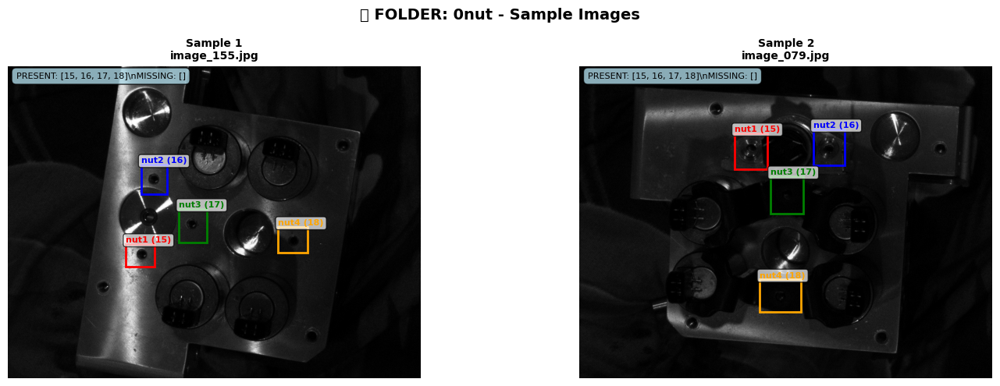

\n📊 FOLDER ANALYSIS: 0nut
--------------------------------------------------
Total images in folder: 178
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



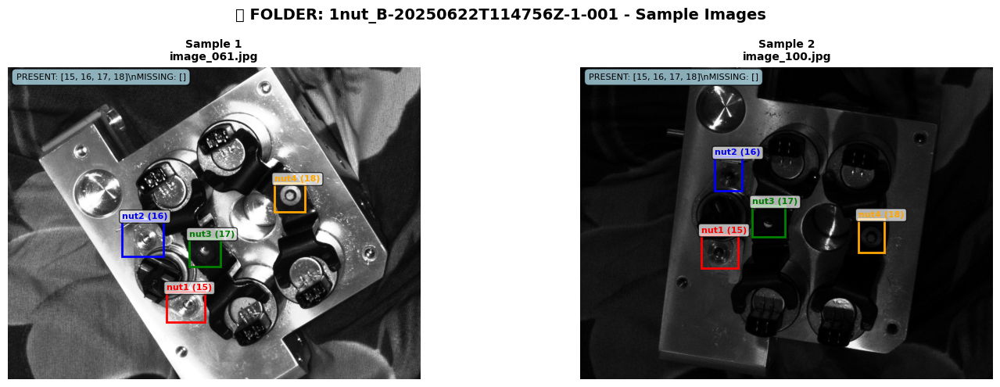

\n📊 FOLDER ANALYSIS: 1nut_B-20250622T114756Z-1-001
--------------------------------------------------
Total images in folder: 177
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



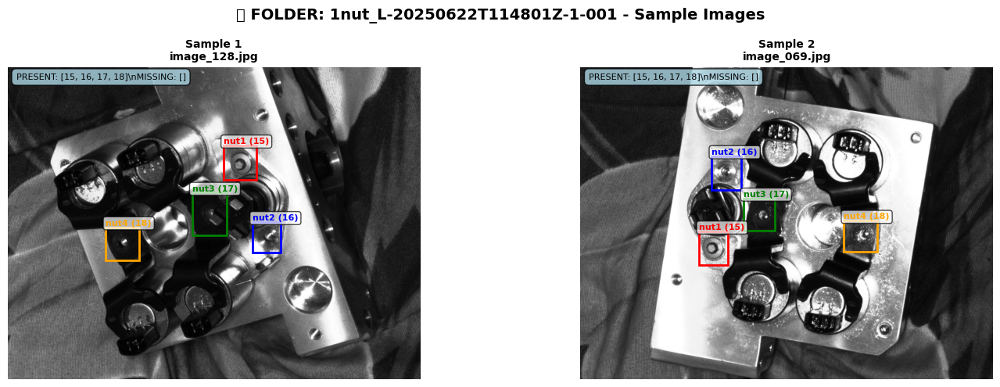

\n📊 FOLDER ANALYSIS: 1nut_L-20250622T114801Z-1-001
--------------------------------------------------
Total images in folder: 177
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



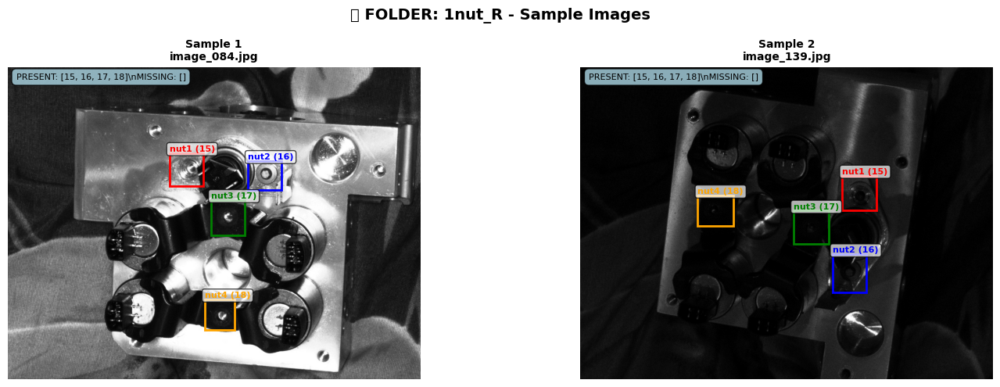

\n📊 FOLDER ANALYSIS: 1nut_R
--------------------------------------------------
Total images in folder: 177
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



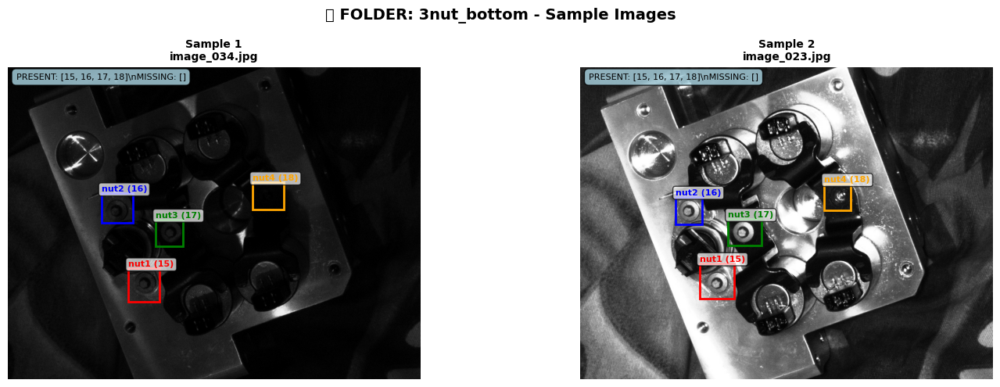

\n📊 FOLDER ANALYSIS: 3nut_bottom
--------------------------------------------------
Total images in folder: 250
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



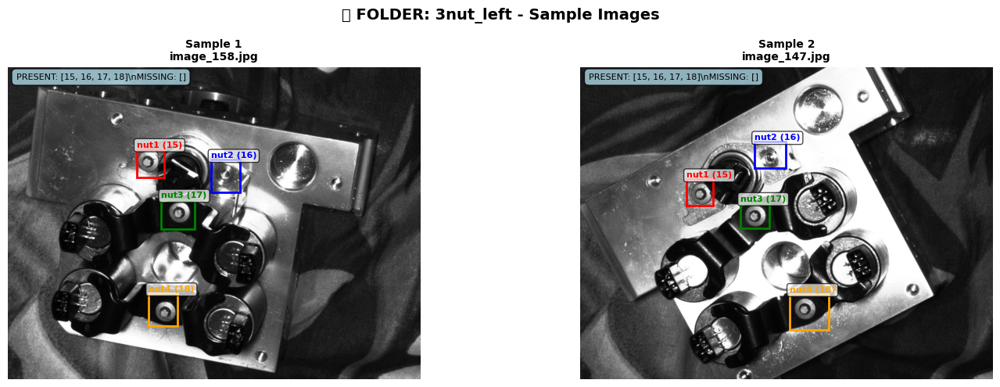

\n📊 FOLDER ANALYSIS: 3nut_left
--------------------------------------------------
Total images in folder: 216
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



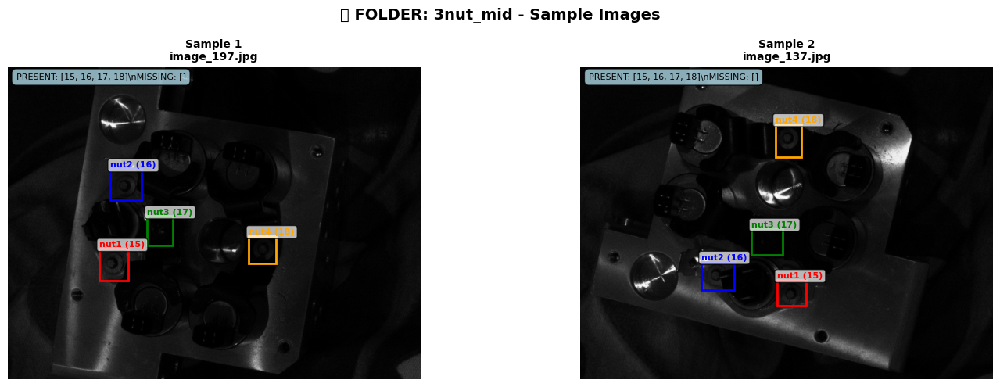

\n📊 FOLDER ANALYSIS: 3nut_mid
--------------------------------------------------
Total images in folder: 249
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



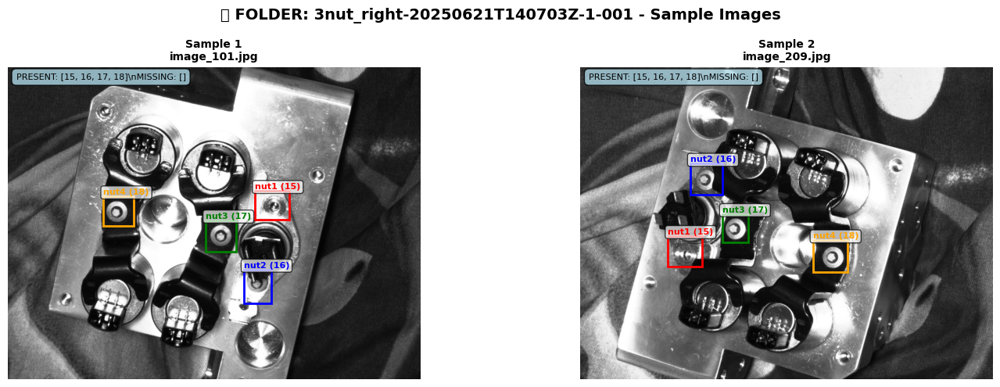

\n📊 FOLDER ANALYSIS: 3nut_right-20250621T140703Z-1-001
--------------------------------------------------
Total images in folder: 247
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️



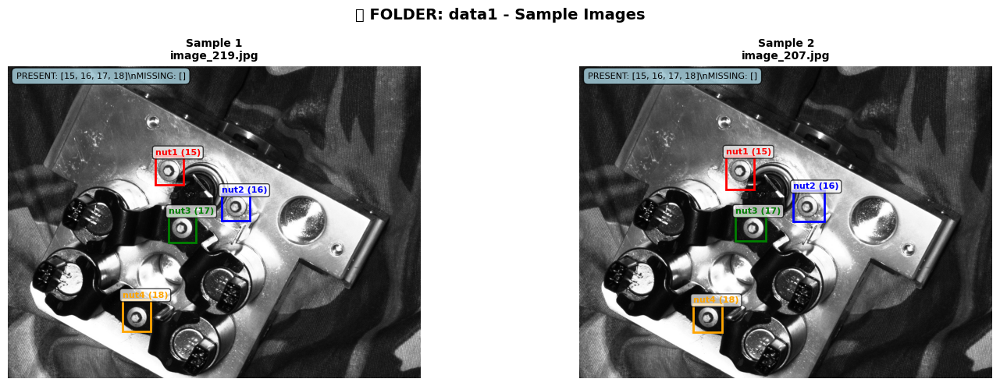

\n📊 FOLDER ANALYSIS: data1
--------------------------------------------------
Total images in folder: 547
Samples shown: 2
Please analyze the PRESENT/MISSING patterns above ☝️

\n✅ VISUAL INSPECTION COMPLETE!
📝 Please tell me which nut positions are MISSING in each folder
   so we can proceed with binary classification setup!


In [3]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

class VisualSampleInspector:
    def __init__(self, cleaned_dataset_path="/kaggle/working/cleaned_dataset"):
        self.dataset_path = cleaned_dataset_path
        self.class_names = {15: "nut1", 16: "nut2", 17: "nut3", 18: "nut4"}
        self.class_colors = {15: 'red', 16: 'blue', 17: 'green', 18: 'orange'}
        
    def load_annotation(self, txt_path):
        """Load YOLO annotation file"""
        annotations = []
        try:
            with open(txt_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        
                        annotations.append({
                            'class_id': class_id,
                            'class_name': self.class_names.get(class_id, f"class_{class_id}"),
                            'bbox': [x_center, y_center, width, height]
                        })
        except Exception as e:
            print(f"Error loading annotation: {e}")
        return annotations
    
    def convert_yolo_to_pixel(self, bbox, img_width, img_height):
        """Convert YOLO format to pixel coordinates"""
        x_center, y_center, width, height = bbox
        
        # Convert to pixel coordinates
        x_center_px = x_center * img_width
        y_center_px = y_center * img_height
        width_px = width * img_width
        height_px = height * img_height
        
        # Calculate corner coordinates
        x1 = x_center_px - width_px / 2
        y1 = y_center_px - height_px / 2
        x2 = x_center_px + width_px / 2
        y2 = y_center_px + height_px / 2
        
        return [x1, y1, x2, y2]
    
    def visualize_sample(self, folder_path, image_file, ax, title):
        """Visualize a single sample with annotations"""
        base_name = os.path.splitext(image_file)[0]
        image_path = os.path.join(folder_path, image_file)
        txt_path = os.path.join(folder_path, base_name + '.txt')
        
        # Load image
        try:
            image = Image.open(image_path)
            img_width, img_height = image.size
            
            # Display image
            ax.imshow(image)
            ax.set_title(f"{title}\n{image_file}", fontsize=10, fontweight='bold')
            
            # Load and display annotations
            annotations = self.load_annotation(txt_path)
            
            present_classes = []
            missing_classes = []
            all_classes = {15, 16, 17, 18}
            
            for ann in annotations:
                class_id = ann['class_id']
                class_name = ann['class_name']
                present_classes.append(class_id)
                
                # Convert YOLO to pixel coordinates
                x1, y1, x2, y2 = self.convert_yolo_to_pixel(ann['bbox'], img_width, img_height)
                
                # Draw bounding box
                rect = patches.Rectangle(
                    (x1, y1), x2-x1, y2-y1,
                    linewidth=2,
                    edgecolor=self.class_colors.get(class_id, 'purple'),
                    facecolor='none'
                )
                ax.add_patch(rect)
                
                # Add class label
                ax.text(x1, y1-5, f"{class_name} ({class_id})", 
                       fontsize=8, fontweight='bold',
                       color=self.class_colors.get(class_id, 'purple'),
                       bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
            
            # Identify missing classes
            missing_classes = list(all_classes - set(present_classes))
            
            # Add text showing present/missing info
            info_text = f"PRESENT: {present_classes}\\nMISSING: {missing_classes}"
            ax.text(0.02, 0.98, info_text, transform=ax.transAxes, 
                   fontsize=8, verticalalignment='top',
                   bbox=dict(boxstyle="round,pad=0.5", facecolor='lightblue', alpha=0.8))
            
            ax.axis('off')
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\\n{image_file}\\n{str(e)}", 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(title, fontsize=10, fontweight='bold')
            ax.axis('off')
    
    def sample_folder_images(self, folder_path, num_samples=3):
        """Get random sample images from a folder"""
        try:
            # Get all image files
            image_files = [f for f in os.listdir(folder_path) 
                          if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
            
            # Randomly sample
            if len(image_files) > num_samples:
                sampled_files = random.sample(image_files, num_samples)
            else:
                sampled_files = image_files
            
            return sampled_files
        except Exception as e:
            print(f"Error sampling from {folder_path}: {e}")
            return []
    
    def create_folder_visualization(self, folder_name, num_samples=3):
        """Create visualization for one folder"""
        folder_path = os.path.join(self.dataset_path, folder_name)
        
        if not os.path.exists(folder_path):
            print(f"Folder not found: {folder_path}")
            return
        
        # Get sample images
        sample_images = self.sample_folder_images(folder_path, num_samples)
        
        if not sample_images:
            print(f"No images found in {folder_name}")
            return
        
        # Create visualization
        fig, axes = plt.subplots(1, len(sample_images), figsize=(15, 5))
        if len(sample_images) == 1:
            axes = [axes]
        
        fig.suptitle(f"📁 FOLDER: {folder_name} - Sample Images", fontsize=14, fontweight='bold')
        
        for i, image_file in enumerate(sample_images):
            self.visualize_sample(folder_path, image_file, axes[i], f"Sample {i+1}")
        
        plt.tight_layout()
        plt.show()
        
        # Print folder summary
        print(f"\\n📊 FOLDER ANALYSIS: {folder_name}")
        print("-" * 50)
        total_images = len([f for f in os.listdir(folder_path) 
                           if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
        print(f"Total images in folder: {total_images}")
        print(f"Samples shown: {len(sample_images)}")
        print(f"Please analyze the PRESENT/MISSING patterns above ☝️")
        print()
    
    def inspect_all_folders(self, num_samples_per_folder=2):
        """Inspect samples from all folders"""
        print("🔍 VISUAL INSPECTION OF ALL FOLDERS")
        print("=" * 60)
        print("📋 Instructions:")
        print("- Look at the PRESENT/MISSING labels on each image")
        print("- Identify which nut positions are consistently missing per folder")
        print("- This will help us create correct binary classification")
        print("=" * 60)
        
        # Get all folders
        folders = [f for f in os.listdir(self.dataset_path) 
                  if os.path.isdir(os.path.join(self.dataset_path, f))]
        folders.sort()
        
        for folder_name in folders:
            self.create_folder_visualization(folder_name, num_samples_per_folder)
            
        print("\\n✅ VISUAL INSPECTION COMPLETE!")
        print("📝 Please tell me which nut positions are MISSING in each folder")
        print("   so we can proceed with binary classification setup!")

# Usage function
def run_visual_inspection(samples_per_folder=2):
    """Run visual inspection of the cleaned dataset"""
    inspector = VisualSampleInspector()
    inspector.inspect_all_folders(samples_per_folder)

# Execute the inspection
if __name__ == "__main__":
    print("🎯 STARTING VISUAL SAMPLE INSPECTION")
    run_visual_inspection(2)  # 2 samples per folder

In [4]:
import os
import shutil
from collections import defaultdict, Counter

class FixedBinaryClassificationConverter:
    def __init__(self, input_path="/kaggle/working/cleaned_dataset", 
                 output_path="/kaggle/working/binary_dataset_fixed"):
        self.input_path = input_path
        self.output_path = output_path
        
        # Original class mapping
        self.original_classes = {15: "nut1", 16: "nut2", 17: "nut3", 18: "nut4"}
        
        # Folder scenario mapping based on your analysis
        self.folder_scenarios = {
            '0nut': {
                'present': [],  # No nuts present
                'missing': ['nut1', 'nut2', 'nut3', 'nut4']  # All missing
            },
            '1nut_B-20250622T114756Z-1-001': {
                'present': ['nut4'],  # Only nut4 present
                'missing': ['nut1', 'nut2', 'nut3']  # Others missing
            },
            '1nut_L-20250622T114801Z-1-001': {
                'present': ['nut1'],  # Only nut1 present
                'missing': ['nut2', 'nut3', 'nut4']  # Others missing
            },
            '1nut_R': {
                'present': ['nut2'],  # Only nut2 present
                'missing': ['nut1', 'nut3', 'nut4']  # Others missing
            },
            '3nut_bottom': {
                'present': ['nut1', 'nut2', 'nut3'],  # 3 nuts present
                'missing': ['nut4']  # nut4 missing
            },
            '3nut_left': {
                'present': ['nut1', 'nut3', 'nut4'],  # 3 nuts present
                'missing': ['nut2']  # nut2 missing
            },
            '3nut_mid': {
                'present': ['nut1', 'nut2', 'nut4'],  # 3 nuts present
                'missing': ['nut3']  # nut3 missing
            },
            '3nut_right-20250621T140703Z-1-001': {
                'present': ['nut2', 'nut3', 'nut4'],  # 3 nuts present
                'missing': ['nut1']  # nut1 missing
            },
            'data1': {
                'present': ['nut1', 'nut2', 'nut3', 'nut4'],  # All present
                'missing': []  # None missing
            }
        }
        
        # Binary classification mapping
        self.binary_classes = {
            0: "MISSING",  # Missing nut position
            1: "PRESENT"   # Present nut position
        }
        
        # Results tracking
        self.results = {
            'converted_files': [],
            'folder_stats': defaultdict(dict),
            'class_distribution': Counter(),
            'conversion_summary': {}
        }
    
    def get_class_name_from_id(self, class_id):
        """Convert class ID to nut name"""
        return self.original_classes.get(class_id, f"unknown_{class_id}")
    
    def should_be_missing_or_present(self, folder_name, class_id):
        """Determine if a class should be MISSING(0) or PRESENT(1) based on folder scenario"""
        nut_name = self.get_class_name_from_id(class_id)
        folder_scenario = self.folder_scenarios.get(folder_name, {})
        
        if nut_name in folder_scenario.get('present', []):
            return 1  # PRESENT
        elif nut_name in folder_scenario.get('missing', []):
            return 0  # MISSING
        else:
            # This shouldn't happen with clean data, but handle gracefully
            print(f"⚠️ Warning: {nut_name} (class {class_id}) not found in {folder_name} scenario")
            return 1  # Default to PRESENT
    
    def convert_annotation_file(self, txt_path, folder_name):
        """Convert a single annotation file to binary format - FIXED VERSION"""
        try:
            with open(txt_path, 'r') as f:
                lines = f.readlines()
            
            converted_lines = []
            conversion_log = []
            
            for line in lines:
                # Clean the line properly
                line = line.strip()
                if not line:  # Skip empty lines
                    continue
                    
                parts = line.split()
                if len(parts) >= 5:
                    original_class_id = int(parts[0])
                    
                    # Extract coordinates properly - FIXED
                    x_center = float(parts[1])
                    y_center = float(parts[2]) 
                    width = float(parts[3])
                    height = float(parts[4])
                    
                    # Determine binary class
                    binary_class = self.should_be_missing_or_present(folder_name, original_class_id)
                    
                    # Create new annotation line - PROPER FORMAT
                    new_line = f"{binary_class} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n"
                    converted_lines.append(new_line)
                    
                    # Log conversion
                    nut_name = self.get_class_name_from_id(original_class_id)
                    binary_name = self.binary_classes[binary_class]
                    conversion_log.append({
                        'original_class': original_class_id,
                        'nut_name': nut_name,
                        'binary_class': binary_class,
                        'binary_name': binary_name,
                        'coordinates': [x_center, y_center, width, height]
                    })
                    
                    # Update statistics
                    self.results['class_distribution'][binary_class] += 1
            
            return converted_lines, conversion_log
            
        except Exception as e:
            print(f"Error converting {txt_path}: {e}")
            return [], []
    
    def create_output_structure(self):
        """Create binary classification dataset structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        
        # Create main structure
        os.makedirs(self.output_path, exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "images"), exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "labels"), exist_ok=True)
        
        # Create dataset.yaml for YOLOv8
        yaml_content = f'''# Binary Nut Detection Dataset
# Classes: 0=MISSING, 1=PRESENT

path: {self.output_path}
train: images
val: images  # Will be split later
test: images # Will be split later

# Classes
nc: 2  # number of classes
names: ['MISSING', 'PRESENT']

# Class descriptions
# 0: MISSING - Nut position is empty/missing
# 1: PRESENT - Nut position has a nut
'''
        
        with open(os.path.join(self.output_path, "dataset.yaml"), 'w') as f:
            f.write(yaml_content)
    
    def process_folder(self, folder_name):
        """Process a single folder"""
        input_folder = os.path.join(self.input_path, folder_name)
        output_images = os.path.join(self.output_path, "images")
        output_labels = os.path.join(self.output_path, "labels")
        
        if not os.path.exists(input_folder):
            print(f"⚠️ Folder not found: {input_folder}")
            return
        
        print(f"\n📁 Processing folder: {folder_name}")
        
        # Get scenario info
        scenario = self.folder_scenarios.get(folder_name, {})
        present_nuts = scenario.get('present', [])
        missing_nuts = scenario.get('missing', [])
        
        print(f"   📋 Scenario - Present: {present_nuts}, Missing: {missing_nuts}")
        
        # Get all image files
        image_files = [f for f in os.listdir(input_folder) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        folder_stats = {
            'total_images': len(image_files),
            'converted_images': 0,
            'failed_conversions': 0,
            'missing_annotations': 0,
            'present_boxes': 0,
            'missing_boxes': 0
        }
        
        for image_file in image_files:
            base_name = os.path.splitext(image_file)[0]
            image_path = os.path.join(input_folder, image_file)
            txt_path = os.path.join(input_folder, base_name + '.txt')
            
            if not os.path.exists(txt_path):
                folder_stats['missing_annotations'] += 1
                continue
            
            # Convert annotation
            converted_lines, conversion_log = self.convert_annotation_file(txt_path, folder_name)
            
            if converted_lines:
                # Copy image with folder prefix to avoid name conflicts
                output_image_name = f"{folder_name}_{image_file}"
                output_txt_name = f"{folder_name}_{base_name}.txt"
                
                # Copy image
                shutil.copy2(image_path, os.path.join(output_images, output_image_name))
                
                # Write converted annotation - ENSURE PROPER FORMAT
                with open(os.path.join(output_labels, output_txt_name), 'w') as f:
                    f.writelines(converted_lines)
                
                folder_stats['converted_images'] += 1
                
                # Count boxes
                for log_entry in conversion_log:
                    if log_entry['binary_class'] == 0:
                        folder_stats['missing_boxes'] += 1
                    else:
                        folder_stats['present_boxes'] += 1
                
                # Log successful conversion
                self.results['converted_files'].append({
                    'folder': folder_name,
                    'original_file': base_name,
                    'output_file': f"{folder_name}_{base_name}",
                    'conversions': conversion_log
                })
            else:
                folder_stats['failed_conversions'] += 1
        
        self.results['folder_stats'][folder_name] = folder_stats
        
        print(f"   ✅ Converted: {folder_stats['converted_images']} images")
        print(f"   📦 PRESENT boxes: {folder_stats['present_boxes']}")
        print(f"   🔳 MISSING boxes: {folder_stats['missing_boxes']}")
        
        return folder_stats
    
    def run_binary_conversion(self):
        """Run complete binary classification conversion"""
        print("🔄 STARTING FIXED BINARY CLASSIFICATION CONVERSION")
        print("=" * 60)
        print("📋 Conversion Rules:")
        print("   • Class 0 = MISSING (empty nut position)")
        print("   • Class 1 = PRESENT (nut exists at position)")
        print("=" * 60)
        
        # Create output structure
        self.create_output_structure()
        
        # Get all folders
        folders = [f for f in os.listdir(self.input_path) 
                  if os.path.isdir(os.path.join(self.input_path, f))]
        folders.sort()
        
        # Process each folder
        for folder_name in folders:
            self.process_folder(folder_name)
        
        # Generate final report
        self.generate_conversion_report()
        
        return self.results
    
    def generate_conversion_report(self):
        """Generate comprehensive conversion report"""
        print("\n" + "=" * 60)
        print("📊 FIXED BINARY CONVERSION SUMMARY REPORT")
        print("=" * 60)
        
        # Overall statistics
        total_images = sum(stats['converted_images'] for stats in self.results['folder_stats'].values())
        total_present = self.results['class_distribution'][1]
        total_missing = self.results['class_distribution'][0]
        total_boxes = total_present + total_missing
        
        print(f"\n📋 OVERALL CONVERSION RESULTS:")
        print(f"  📁 Total folders processed: {len(self.results['folder_stats'])}")
        print(f"  🖼️ Total images converted: {total_images}")
        print(f"  📦 Total bounding boxes: {total_boxes}")
        print(f"  ✅ PRESENT boxes (class 1): {total_present} ({(total_present/total_boxes*100):.1f}%)")
        print(f"  ❌ MISSING boxes (class 0): {total_missing} ({(total_missing/total_boxes*100):.1f}%)")
        
        print(f"\n📁 FOLDER-WISE CONVERSION:")
        for folder_name, stats in self.results['folder_stats'].items():
            scenario = self.folder_scenarios[folder_name]
            print(f"\n  📂 {folder_name}:")
            print(f"    Scenario: Present={scenario['present']}, Missing={scenario['missing']}")
            print(f"    Images: {stats['converted_images']}")
            print(f"    PRESENT boxes: {stats['present_boxes']}")
            print(f"    MISSING boxes: {stats['missing_boxes']}")
        
        print(f"\n📂 Fixed binary dataset ready at: {self.output_path}")
        print(f"📄 YOLOv8 config file: {self.output_path}/dataset.yaml")
        print(f"\n🎯 READY FOR YOLOV8 TRAINING!")
        print("   • Classes: 0=MISSING, 1=PRESENT")
        print("   • Use dataset.yaml for training configuration")
        print("   • Proper YOLO format annotations")

# Usage function
def run_fixed_binary_conversion():
    """Run the FIXED binary classification conversion"""
    converter = FixedBinaryClassificationConverter()
    results = converter.run_binary_conversion()
    return results

# Execute the conversion
if __name__ == "__main__":
    print("🚀 STARTING FIXED BINARY CLASSIFICATION CONVERSION")
    results = run_fixed_binary_conversion()
    print("\n✅ Fixed binary conversion complete!")

🚀 STARTING FIXED BINARY CLASSIFICATION CONVERSION
🔄 STARTING FIXED BINARY CLASSIFICATION CONVERSION
📋 Conversion Rules:
   • Class 0 = MISSING (empty nut position)
   • Class 1 = PRESENT (nut exists at position)

📁 Processing folder: 0nut
   📋 Scenario - Present: [], Missing: ['nut1', 'nut2', 'nut3', 'nut4']
   ✅ Converted: 178 images
   📦 PRESENT boxes: 0
   🔳 MISSING boxes: 712

📁 Processing folder: 1nut_B-20250622T114756Z-1-001
   📋 Scenario - Present: ['nut4'], Missing: ['nut1', 'nut2', 'nut3']
   ✅ Converted: 177 images
   📦 PRESENT boxes: 176
   🔳 MISSING boxes: 532

📁 Processing folder: 1nut_L-20250622T114801Z-1-001
   📋 Scenario - Present: ['nut1'], Missing: ['nut2', 'nut3', 'nut4']
   ✅ Converted: 177 images
   📦 PRESENT boxes: 177
   🔳 MISSING boxes: 531

📁 Processing folder: 1nut_R
   📋 Scenario - Present: ['nut2'], Missing: ['nut1', 'nut3', 'nut4']
   ✅ Converted: 176 images
   📦 PRESENT boxes: 178
   🔳 MISSING boxes: 526

📁 Processing folder: 3nut_bottom
   📋 Scenario - Pr

🚀 STARTING BINARY CLASSIFICATION VERIFICATION
🔍 BINARY CLASSIFICATION VERIFICATION
📋 What to check:
   • Green boxes = PRESENT (class 1) - solid lines
   • Red boxes = MISSING (class 0) - dashed lines
   • Count matches expected pattern
   • Boxes are at correct positions
Found samples from 9 folders



/tmp/ipykernel_19/707300543.py:221: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/707300543.py:221: UserWarning: Glyph 128307 (\N{WHITE SQUARE BUTTON}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/707300543.py:221: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_19/707300543.py:221: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128307 (\N{WHITE SQUARE BUTTON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarnin

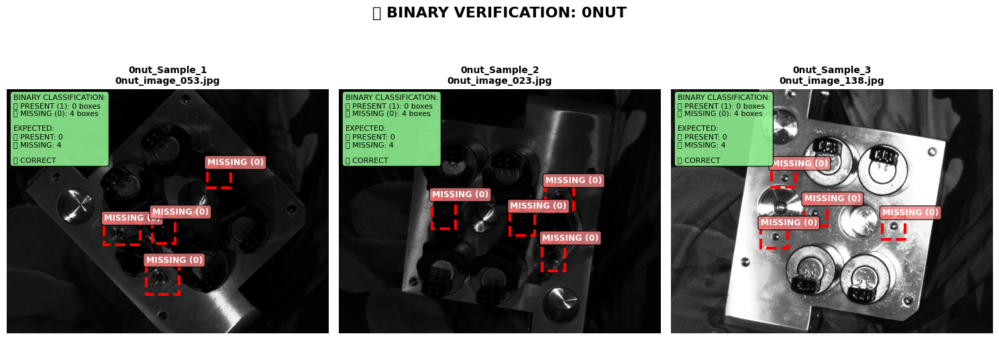


📊 FOLDER VERIFICATION: 0nut
--------------------------------------------------
📋 Expected Pattern: 0 PRESENT, 4 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



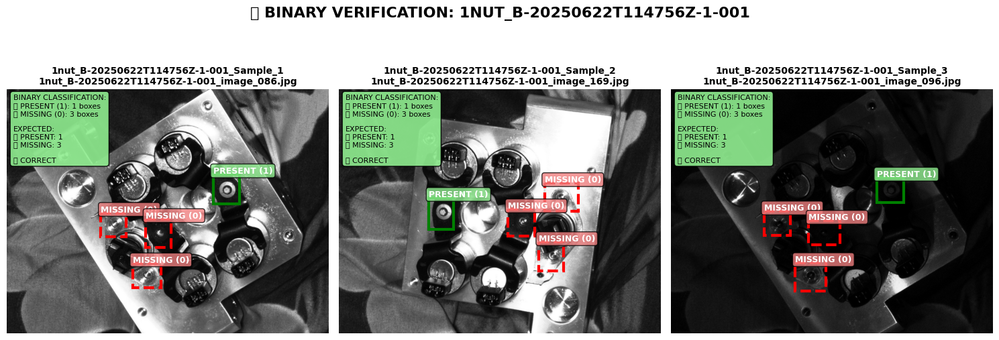


📊 FOLDER VERIFICATION: 1nut_B-20250622T114756Z-1-001
--------------------------------------------------
📋 Expected Pattern: 1 PRESENT, 3 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



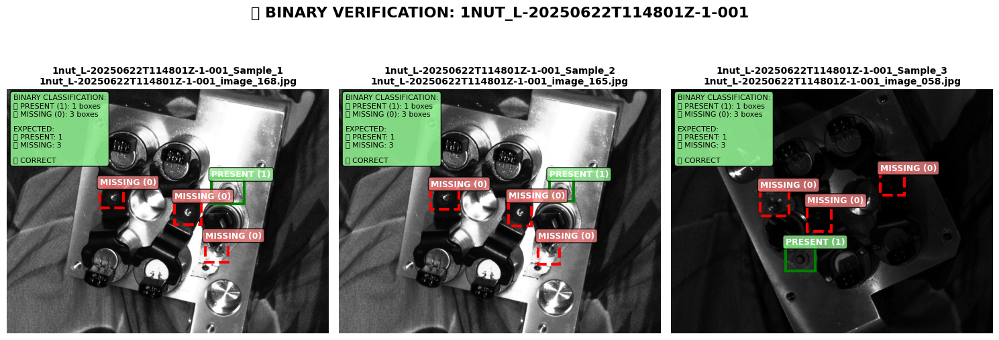


📊 FOLDER VERIFICATION: 1nut_L-20250622T114801Z-1-001
--------------------------------------------------
📋 Expected Pattern: 1 PRESENT, 3 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



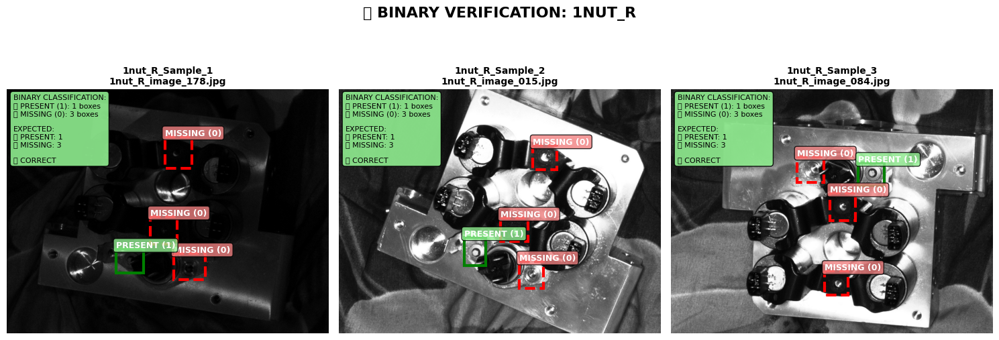


📊 FOLDER VERIFICATION: 1nut_R
--------------------------------------------------
📋 Expected Pattern: 1 PRESENT, 3 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



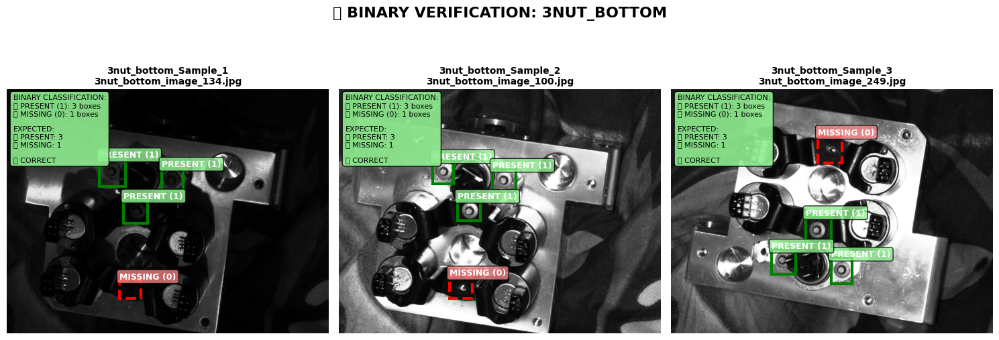


📊 FOLDER VERIFICATION: 3nut_bottom
--------------------------------------------------
📋 Expected Pattern: 3 PRESENT, 1 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



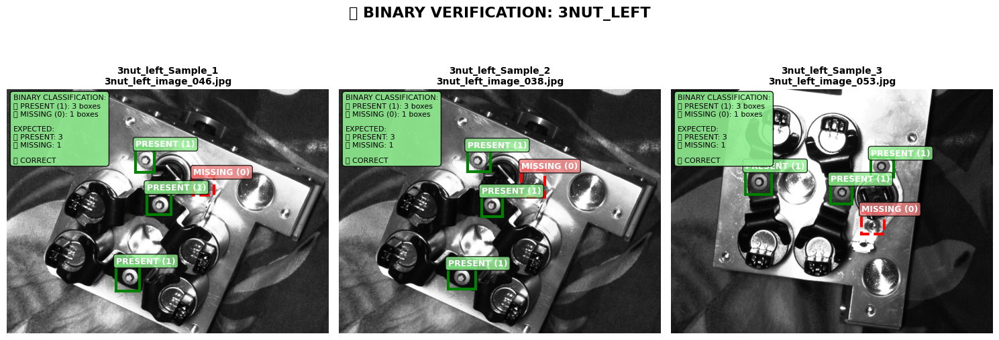


📊 FOLDER VERIFICATION: 3nut_left
--------------------------------------------------
📋 Expected Pattern: 3 PRESENT, 1 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



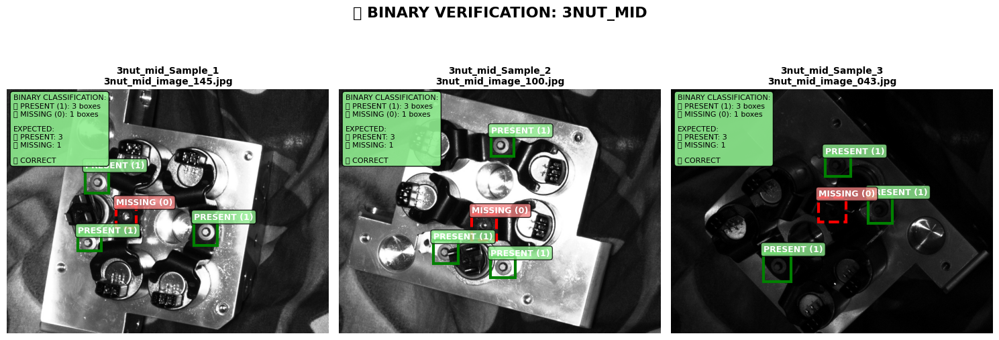


📊 FOLDER VERIFICATION: 3nut_mid
--------------------------------------------------
📋 Expected Pattern: 3 PRESENT, 1 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



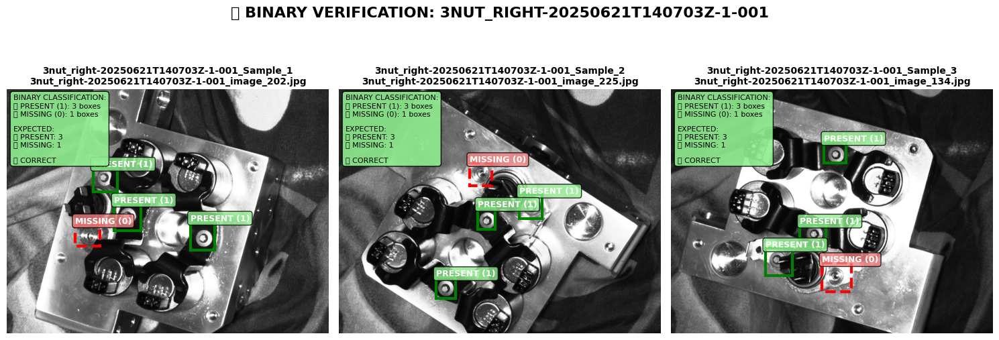


📊 FOLDER VERIFICATION: 3nut_right-20250621T140703Z-1-001
--------------------------------------------------
📋 Expected Pattern: 3 PRESENT, 1 MISSING
📸 Samples shown: 3
✅ Validation: 3/3 correct



/tmp/ipykernel_19/707300543.py:221: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


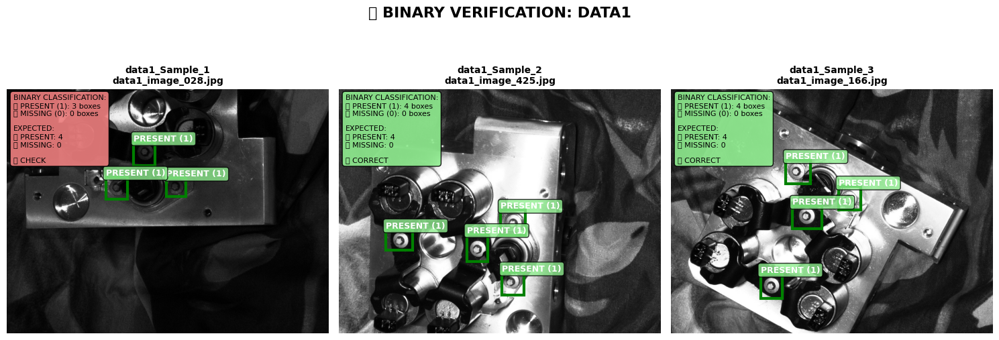


📊 FOLDER VERIFICATION: data1
--------------------------------------------------
📋 Expected Pattern: 4 PRESENT, 0 MISSING
📸 Samples shown: 3
✅ Validation: 2/3 correct
⚠️ Please check samples marked with ❌ - they may need correction


📊 OVERALL VERIFICATION SUMMARY
📁 Total folders verified: 9
🖼️ Total samples checked: 27

✅ VERIFICATION COMPLETE!
📝 Please review each sample and confirm:
   1. Binary classification is correct
   2. Bounding boxes are at proper positions
   3. Counts match expected patterns

✅ Verification complete!


In [5]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
from collections import defaultdict

class BinaryClassificationVerifier:
    def __init__(self, binary_dataset_path="/kaggle/working/binary_dataset"):
        self.binary_dataset_path = binary_dataset_path
        self.images_path = os.path.join(binary_dataset_path, "images")
        self.labels_path = os.path.join(binary_dataset_path, "labels")
        
        # Binary class info
        self.binary_classes = {
            0: {"name": "MISSING", "color": "red", "description": "Empty nut position"},
            1: {"name": "PRESENT", "color": "green", "description": "Nut exists at position"}
        }
        
        # Original folder scenarios for reference
        self.folder_scenarios = {
            '0nut': {'expected_missing': 4, 'expected_present': 0},
            '1nut_B-20250622T114756Z-1-001': {'expected_missing': 3, 'expected_present': 1},
            '1nut_L-20250622T114801Z-1-001': {'expected_missing': 3, 'expected_present': 1},
            '1nut_R': {'expected_missing': 3, 'expected_present': 1},
            '3nut_bottom': {'expected_missing': 1, 'expected_present': 3},
            '3nut_left': {'expected_missing': 1, 'expected_present': 3},
            '3nut_mid': {'expected_missing': 1, 'expected_present': 3},
            '3nut_right-20250621T140703Z-1-001': {'expected_missing': 1, 'expected_present': 3},
            'data1': {'expected_missing': 0, 'expected_present': 4}
        }
    
    def load_binary_annotation(self, txt_path):
        """Load binary annotation file"""
        annotations = []
        try:
            with open(txt_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        
                        annotations.append({
                            'class_id': class_id,
                            'class_name': self.binary_classes[class_id]['name'],
                            'class_color': self.binary_classes[class_id]['color'],
                            'bbox': [x_center, y_center, width, height]
                        })
        except Exception as e:
            print(f"Error loading annotation: {e}")
        return annotations
    
    def convert_yolo_to_pixel(self, bbox, img_width, img_height):
        """Convert YOLO format to pixel coordinates"""
        x_center, y_center, width, height = bbox
        
        # Convert to pixel coordinates
        x_center_px = x_center * img_width
        y_center_px = y_center * img_height
        width_px = width * img_width
        height_px = height * img_height
        
        # Calculate corner coordinates
        x1 = x_center_px - width_px / 2
        y1 = y_center_px - height_px / 2
        x2 = x_center_px + width_px / 2
        y2 = y_center_px + height_px / 2
        
        return [x1, y1, x2, y2]
    
    def get_folder_from_filename(self, filename):
        """Extract original folder name from prefixed filename"""
        base_name = os.path.splitext(filename)[0]
        
        # Find folder prefix
        for folder_name in self.folder_scenarios.keys():
            if base_name.startswith(folder_name + '_'):
                return folder_name
        
        return 'unknown'
    
    def visualize_binary_sample(self, image_file, ax, title_suffix=""):
        """Visualize a single binary classification sample"""
        base_name = os.path.splitext(image_file)[0]
        image_path = os.path.join(self.images_path, image_file)
        txt_path = os.path.join(self.labels_path, base_name + '.txt')
        
        try:
            # Load image
            image = Image.open(image_path)
            img_width, img_height = image.size
            
            # Display image
            ax.imshow(image)
            
            # Get folder info
            folder_name = self.get_folder_from_filename(image_file)
            expected = self.folder_scenarios.get(folder_name, {})
            
            # Load binary annotations
            annotations = self.load_binary_annotation(txt_path)
            
            # Count classes
            missing_count = len([ann for ann in annotations if ann['class_id'] == 0])
            present_count = len([ann for ann in annotations if ann['class_id'] == 1])
            
            # Draw bounding boxes
            for ann in annotations:
                class_id = ann['class_id']
                class_name = ann['class_name']
                class_color = ann['class_color']
                
                # Convert YOLO to pixel coordinates
                x1, y1, x2, y2 = self.convert_yolo_to_pixel(ann['bbox'], img_width, img_height)
                
                # Draw bounding box
                rect = patches.Rectangle(
                    (x1, y1), x2-x1, y2-y1,
                    linewidth=3,
                    edgecolor=class_color,
                    facecolor='none',
                    linestyle='-' if class_id == 1 else '--'  # Solid for PRESENT, dashed for MISSING
                )
                ax.add_patch(rect)
                
                # Add class label
                label_bg_color = 'lightgreen' if class_id == 1 else 'lightcoral'
                ax.text(x1, y1-5, f"{class_name} ({class_id})", 
                       fontsize=9, fontweight='bold',
                       color='white',
                       bbox=dict(boxstyle="round,pad=0.3", facecolor=label_bg_color, alpha=0.8))
            
            # Validation check
            exp_missing = expected.get('expected_missing', '?')
            exp_present = expected.get('expected_present', '?')
            
            validation_status = "✅ CORRECT" if (missing_count == exp_missing and present_count == exp_present) else "❌ CHECK"
            validation_color = 'lightgreen' if '✅' in validation_status else 'lightcoral'
            
            # Title and info
            title = f"{folder_name}_{title_suffix}\n{image_file}"
            ax.set_title(title, fontsize=10, fontweight='bold')
            
            # Add comprehensive info box
            info_text = f"""BINARY CLASSIFICATION:
📦 PRESENT (1): {present_count} boxes
🔳 MISSING (0): {missing_count} boxes

EXPECTED:
📦 PRESENT: {exp_present}
🔳 MISSING: {exp_missing}

{validation_status}"""
            
            ax.text(0.02, 0.98, info_text, transform=ax.transAxes, 
                   fontsize=8, verticalalignment='top',
                   bbox=dict(boxstyle="round,pad=0.4", facecolor=validation_color, alpha=0.9))
            
            ax.axis('off')
            
            return validation_status
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\n{image_file}\n{str(e)}", 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f"ERROR: {image_file}", fontsize=10, fontweight='bold')
            ax.axis('off')
            return "❌ ERROR"
    
    def get_samples_by_folder(self, num_samples_per_folder=3):
        """Get random samples organized by folder"""
        folder_samples = defaultdict(list)
        
        # Get all image files
        if not os.path.exists(self.images_path):
            print(f"❌ Images path not found: {self.images_path}")
            return {}
        
        all_images = [f for f in os.listdir(self.images_path) 
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        # Group by folder
        for image_file in all_images:
            folder_name = self.get_folder_from_filename(image_file)
            folder_samples[folder_name].append(image_file)
        
        # Sample from each folder
        sampled_folders = {}
        for folder_name, images in folder_samples.items():
            if len(images) >= num_samples_per_folder:
                sampled_folders[folder_name] = random.sample(images, num_samples_per_folder)
            else:
                sampled_folders[folder_name] = images
        
        return sampled_folders
    
    def create_folder_verification(self, folder_name, sample_images):
        """Create verification visualization for one folder"""
        if not sample_images:
            print(f"No samples found for folder: {folder_name}")
            return
        
        # Create visualization
        num_samples = len(sample_images)
        fig, axes = plt.subplots(1, num_samples, figsize=(5*num_samples, 6))
        if num_samples == 1:
            axes = [axes]
        
        fig.suptitle(f"🔍 BINARY VERIFICATION: {folder_name.upper()}", fontsize=16, fontweight='bold')
        
        validation_results = []
        for i, image_file in enumerate(sample_images):
            result = self.visualize_binary_sample(image_file, axes[i], f"Sample_{i+1}")
            validation_results.append(result)
        
        plt.tight_layout()
        plt.show()
        
        # Print folder summary
        print(f"\n📊 FOLDER VERIFICATION: {folder_name}")
        print("-" * 50)
        
        # Expected vs actual info
        expected = self.folder_scenarios.get(folder_name, {})
        print(f"📋 Expected Pattern: {expected.get('expected_present', '?')} PRESENT, {expected.get('expected_missing', '?')} MISSING")
        print(f"📸 Samples shown: {len(sample_images)}")
        print(f"✅ Validation: {validation_results.count('✅ CORRECT')}/{len(validation_results)} correct")
        
        if '❌' in str(validation_results):
            print(f"⚠️ Please check samples marked with ❌ - they may need correction")
        
        print()
    
    def run_complete_verification(self, samples_per_folder=3):
        """Run complete verification on all folders"""
        print("🔍 BINARY CLASSIFICATION VERIFICATION")
        print("=" * 60)
        print("📋 What to check:")
        print("   • Green boxes = PRESENT (class 1) - solid lines")
        print("   • Red boxes = MISSING (class 0) - dashed lines")
        print("   • Count matches expected pattern")
        print("   • Boxes are at correct positions")
        print("=" * 60)
        
        # Get samples
        folder_samples = self.get_samples_by_folder(samples_per_folder)
        
        if not folder_samples:
            print("❌ No samples found! Please check if binary conversion was completed.")
            return
        
        print(f"Found samples from {len(folder_samples)} folders\n")
        
        # Verify each folder
        overall_stats = {'total_samples': 0, 'correct_samples': 0}
        
        for folder_name in sorted(folder_samples.keys()):
            sample_images = folder_samples[folder_name]
            self.create_folder_verification(folder_name, sample_images)
            overall_stats['total_samples'] += len(sample_images)
        
        print("\n" + "=" * 60)
        print("📊 OVERALL VERIFICATION SUMMARY")
        print("=" * 60)
        print(f"📁 Total folders verified: {len(folder_samples)}")
        print(f"🖼️ Total samples checked: {overall_stats['total_samples']}")
        print("\n✅ VERIFICATION COMPLETE!")
        print("📝 Please review each sample and confirm:")
        print("   1. Binary classification is correct")
        print("   2. Bounding boxes are at proper positions")
        print("   3. Counts match expected patterns")
        
        return folder_samples

# Usage function
def run_binary_verification(samples_per_folder=3):
    """Run binary classification verification"""
    # Update verifier to use fixed dataset
    verifier = BinaryClassificationVerifier("/kaggle/working/binary_dataset_fixed")
    results = verifier.run_complete_verification(samples_per_folder)
    return results

# Execute verification
if __name__ == "__main__":
    print("🚀 STARTING BINARY CLASSIFICATION VERIFICATION")
    results = run_binary_verification(3)  # 3 samples per folder
    print("\n✅ Verification complete!")

🚀 STARTING SMART PREPROCESSING ANALYSIS
🔍 SMART PREPROCESSING ANALYSIS FOR INDUSTRIAL NUT DETECTION
📋 Analyzing requirements for:
   • Binary classification (MISSING vs PRESENT)
   • YOLOv8 optimization
   • Industrial lighting conditions
   • Small object detection (nuts)
📸 Analyzing 28 sample images...

🔍 STEP 1: Lighting Analysis...
🔍 STEP 2: Quality Analysis...
🔍 STEP 3: Generating Recommendations...

📊 PREPROCESSING ANALYSIS REPORT

🔦 LIGHTING ANALYSIS:
  Average brightness: 71.4 (optimal: 100-140)
  Brightness consistency: ❌ Poor
  Average contrast: 62.3 (minimum: 50)
  Brightness range: 15.0 - 98.7

⚠️ QUALITY ISSUES DETECTED (42 issues):
  • 1nut: Weak edges (0.057)
  • 1nut: Poor histogram distribution
  • 1nut: Poor histogram distribution
  • 1nut: Poor histogram distribution
  • 1nut: Poor brightness (78.2)
  • data1: Poor histogram distribution
  • data1: Poor histogram distribution
  • data1: Poor brightness (66.1)
  • data1: Weak edges (0.069)
  • 3nut: Poor brightness (1

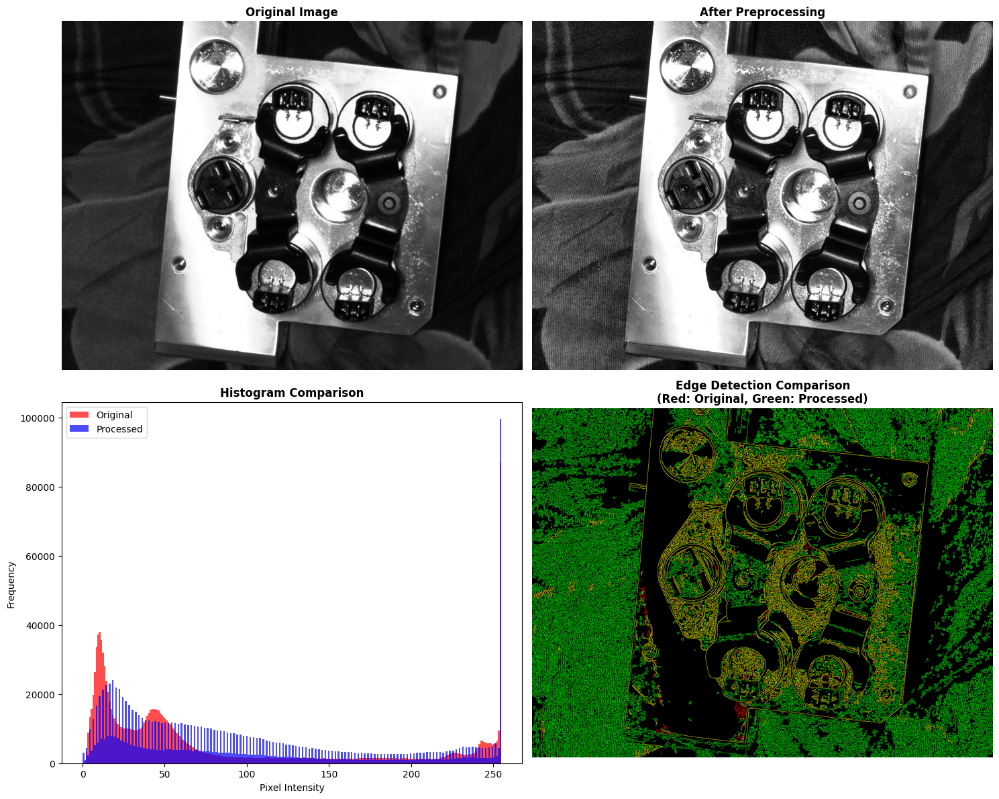


✅ Analysis complete!


In [6]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import random
from collections import defaultdict, Counter
import seaborn as sns

class SmartPreprocessingAnalyzer:
    def __init__(self, dataset_path="/kaggle/working/binary_dataset_fixed"):
        self.dataset_path = dataset_path
        self.images_path = os.path.join(dataset_path, "images")
        self.labels_path = os.path.join(dataset_path, "labels")
        
        # Analysis results storage
        self.analysis_results = {
            'image_quality': {},
            'lighting_analysis': {},
            'contrast_analysis': {},
            'noise_analysis': {},
            'edge_analysis': {},
            'size_analysis': {},
            'preprocessing_recommendations': [],
            'folder_specific_issues': defaultdict(list)
        }
        
        # Problem-specific requirements for missing nut detection
        self.detection_requirements = {
            'min_contrast': 50,      # Minimum contrast for nut visibility
            'max_noise_level': 30,   # Maximum acceptable noise
            'min_edge_density': 0.1, # Minimum edge density for nut boundaries
            'target_brightness': 128, # Optimal brightness level
            'size_consistency': 0.9   # Size consistency threshold
        }
    
    def load_sample_images(self, num_samples=50):
        """Load random sample images for analysis"""
        if not os.path.exists(self.images_path):
            print(f"❌ Images path not found: {self.images_path}")
            return []
        
        all_images = [f for f in os.listdir(self.images_path) 
                     if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        # Sample images from different folders
        folder_samples = defaultdict(list)
        for img in all_images:
            folder_name = img.split('_')[0] if '_' in img else 'unknown'
            folder_samples[folder_name].append(img)
        
        # Get balanced samples from each folder
        selected_images = []
        samples_per_folder = max(1, num_samples // len(folder_samples))
        
        for folder, images in folder_samples.items():
            folder_sample = random.sample(images, min(samples_per_folder, len(images)))
            selected_images.extend(folder_sample)
        
        return selected_images[:num_samples]
    
    def analyze_image_quality(self, image_path):
        """Comprehensive image quality analysis"""
        try:
            # Load image
            img_pil = Image.open(image_path)
            img_cv = cv2.imread(image_path)
            img_gray = cv2.cvtColor(img_cv, cv2.COLOR_BGR2GRAY)
            
            # Basic image properties
            height, width = img_gray.shape
            
            # Brightness analysis
            brightness = np.mean(img_gray)
            brightness_std = np.std(img_gray)
            
            # Contrast analysis
            contrast = img_gray.std()
            
            # Noise analysis (using Laplacian variance)
            laplacian_var = cv2.Laplacian(img_gray, cv2.CV_64F).var()
            
            # Edge analysis
            edges = cv2.Canny(img_gray, 50, 150)
            edge_density = np.sum(edges > 0) / (height * width)
            
            # Sharpness analysis (using gradient magnitude)
            grad_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
            sharpness = np.sqrt(grad_x**2 + grad_y**2).mean()
            
            # Histogram analysis
            hist = cv2.calcHist([img_gray], [0], None, [256], [0, 256])
            hist_peak = np.argmax(hist)
            hist_spread = np.sum(hist > hist.max() * 0.1)  # Number of bins with significant values
            
            # Color analysis (if RGB)
            if len(img_cv.shape) == 3:
                color_std = np.std(img_cv, axis=(0,1))  # Color variation per channel
            else:
                color_std = [0, 0, 0]
            
            return {
                'dimensions': (width, height),
                'brightness': brightness,
                'brightness_std': brightness_std,
                'contrast': contrast,
                'noise_level': laplacian_var,
                'edge_density': edge_density,
                'sharpness': sharpness,
                'histogram_peak': hist_peak,
                'histogram_spread': hist_spread,
                'color_variation': color_std.tolist() if hasattr(color_std, 'tolist') else color_std
            }
            
        except Exception as e:
            print(f"Error analyzing {image_path}: {e}")
            return None
    
    def analyze_lighting_conditions(self, sample_images):
        """Analyze lighting consistency across images"""
        brightness_values = []
        contrast_values = []
        folder_lighting = defaultdict(list)
        
        for img_file in sample_images:
            img_path = os.path.join(self.images_path, img_file)
            quality = self.analyze_image_quality(img_path)
            
            if quality:
                brightness_values.append(quality['brightness'])
                contrast_values.append(quality['contrast'])
                
                # Group by folder
                folder_name = img_file.split('_')[0] if '_' in img_file else 'unknown'
                folder_lighting[folder_name].append({
                    'brightness': quality['brightness'],
                    'contrast': quality['contrast']
                })
        
        # Calculate lighting statistics
        lighting_analysis = {
            'avg_brightness': np.mean(brightness_values),
            'brightness_std': np.std(brightness_values),
            'brightness_range': (min(brightness_values), max(brightness_values)),
            'avg_contrast': np.mean(contrast_values),
            'contrast_std': np.std(contrast_values),
            'contrast_range': (min(contrast_values), max(contrast_values)),
            'lighting_consistency': np.std(brightness_values) < 20,  # Good if std < 20
            'folder_variations': {}
        }
        
        # Analyze folder-specific lighting
        for folder, values in folder_lighting.items():
            if len(values) > 1:
                folder_brightness = [v['brightness'] for v in values]
                folder_contrast = [v['contrast'] for v in values]
                
                lighting_analysis['folder_variations'][folder] = {
                    'brightness_consistency': np.std(folder_brightness) < 15,
                    'contrast_consistency': np.std(folder_contrast) < 15,
                    'avg_brightness': np.mean(folder_brightness),
                    'avg_contrast': np.mean(folder_contrast)
                }
        
        return lighting_analysis
    
    def analyze_preprocessing_needs(self, sample_images):
        """Determine specific preprocessing requirements"""
        preprocessing_needs = {
            'brightness_normalization': False,
            'contrast_enhancement': False,
            'noise_reduction': False,
            'edge_enhancement': False,
            'size_standardization': True,  # Always needed for YOLOv8
            'histogram_equalization': False,
            'gamma_correction': False
        }
        
        quality_issues = []
        all_qualities = []
        
        # Analyze all samples
        for img_file in sample_images:
            img_path = os.path.join(self.images_path, img_file)
            quality = self.analyze_image_quality(img_path)
            
            if quality:
                all_qualities.append(quality)
                folder_name = img_file.split('_')[0] if '_' in img_file else 'unknown'
                
                # Check against requirements
                if quality['brightness'] < 80 or quality['brightness'] > 180:
                    preprocessing_needs['brightness_normalization'] = True
                    quality_issues.append(f"{folder_name}: Poor brightness ({quality['brightness']:.1f})")
                
                if quality['contrast'] < self.detection_requirements['min_contrast']:
                    preprocessing_needs['contrast_enhancement'] = True
                    quality_issues.append(f"{folder_name}: Low contrast ({quality['contrast']:.1f})")
                
                if quality['noise_level'] < 100:  # Low Laplacian variance indicates noise
                    preprocessing_needs['noise_reduction'] = True
                    quality_issues.append(f"{folder_name}: High noise (var: {quality['noise_level']:.1f})")
                
                if quality['edge_density'] < self.detection_requirements['min_edge_density']:
                    preprocessing_needs['edge_enhancement'] = True
                    quality_issues.append(f"{folder_name}: Weak edges ({quality['edge_density']:.3f})")
                
                # Check histogram distribution
                if quality['histogram_spread'] < 100:  # Narrow histogram
                    preprocessing_needs['histogram_equalization'] = True
                    quality_issues.append(f"{folder_name}: Poor histogram distribution")
        
        # Calculate overall statistics
        if all_qualities:
            avg_brightness = np.mean([q['brightness'] for q in all_qualities])
            brightness_std = np.std([q['brightness'] for q in all_qualities])
            
            # Gamma correction needed if brightness is consistently off
            if avg_brightness < 100 or avg_brightness > 160:
                preprocessing_needs['gamma_correction'] = True
        
        return preprocessing_needs, quality_issues, all_qualities
    
    def generate_preprocessing_recommendations(self, preprocessing_needs, quality_issues, lighting_analysis):
        """Generate specific preprocessing recommendations"""
        recommendations = []
        
        # Priority 1: Critical for YOLOv8 performance
        recommendations.append({
            'priority': 'CRITICAL',
            'step': 'Size Standardization',
            'reason': 'YOLOv8 requires consistent input size (640x640)',
            'implementation': 'Resize all images to 640x640 with aspect ratio preservation',
            'code_hint': 'cv2.resize() with padding'
        })
        
        # Priority 2: Image quality improvements
        if preprocessing_needs['brightness_normalization']:
            brightness_std = lighting_analysis['brightness_std']
            recommendations.append({
                'priority': 'HIGH',
                'step': 'Brightness Normalization',
                'reason': f'Inconsistent brightness (std: {brightness_std:.1f})',
                'implementation': 'Normalize brightness to target range 100-140',
                'code_hint': 'Apply linear scaling or histogram matching'
            })
        
        if preprocessing_needs['contrast_enhancement']:
            avg_contrast = lighting_analysis['avg_contrast']
            recommendations.append({
                'priority': 'HIGH',
                'step': 'Contrast Enhancement (CLAHE)',
                'reason': f'Low contrast affecting nut visibility (avg: {avg_contrast:.1f})',
                'implementation': 'Apply Contrast Limited Adaptive Histogram Equalization',
                'code_hint': 'cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))'
            })
        
        if preprocessing_needs['noise_reduction']:
            recommendations.append({
                'priority': 'MEDIUM',
                'step': 'Noise Reduction',
                'reason': 'High noise levels detected in industrial images',
                'implementation': 'Apply bilateral filtering to reduce noise while preserving edges',
                'code_hint': 'cv2.bilateralFilter(img, 9, 75, 75)'
            })
        
        if preprocessing_needs['edge_enhancement']:
            recommendations.append({
                'priority': 'MEDIUM',
                'step': 'Edge Enhancement',
                'reason': 'Weak nut boundaries may affect detection accuracy',
                'implementation': 'Apply unsharp masking to enhance nut edges',
                'code_hint': 'Gaussian blur + weighted addition'
            })
        
        if preprocessing_needs['gamma_correction']:
            recommendations.append({
                'priority': 'MEDIUM',
                'step': 'Gamma Correction',
                'reason': 'Overall brightness adjustment needed for industrial lighting',
                'implementation': 'Apply gamma correction to normalize exposure',
                'code_hint': 'np.power(img/255.0, gamma) * 255'
            })
        
        # Priority 3: Optional enhancements
        if preprocessing_needs['histogram_equalization']:
            recommendations.append({
                'priority': 'LOW',
                'step': 'Histogram Equalization',
                'reason': 'Poor histogram distribution in some images',
                'implementation': 'Apply adaptive histogram equalization',
                'code_hint': 'cv2.equalizeHist() or CLAHE'
            })
        
        # Problem-specific recommendations
        recommendations.append({
            'priority': 'CRITICAL',
            'step': 'Binary Classification Optimization',
            'reason': 'Optimize for MISSING vs PRESENT detection',
            'implementation': 'Ensure clear distinction between empty and occupied positions',
            'code_hint': 'Focus on edge clarity and contrast at nut positions'
        })
        
        return recommendations
    
    def create_preprocessing_visualization(self, sample_image_path, recommendations):
        """Create before/after preprocessing visualization"""
        # Load original image
        img_original = cv2.imread(sample_image_path)
        img_gray = cv2.cvtColor(img_original, cv2.COLOR_BGR2GRAY)
        
        # Apply recommended preprocessing steps
        img_processed = img_gray.copy()
        
        # Apply CLAHE if recommended
        clahe_needed = any('CLAHE' in rec['step'] for rec in recommendations)
        if clahe_needed:
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            img_processed = clahe.apply(img_processed)
        
        # Apply noise reduction if recommended
        noise_reduction_needed = any('Noise' in rec['step'] for rec in recommendations)
        if noise_reduction_needed:
            img_processed = cv2.bilateralFilter(img_processed, 9, 75, 75)
        
        # Apply edge enhancement if recommended
        edge_enhancement_needed = any('Edge' in rec['step'] for rec in recommendations)
        if edge_enhancement_needed:
            # Unsharp masking
            gaussian = cv2.GaussianBlur(img_processed, (0, 0), 2.0)
            img_processed = cv2.addWeighted(img_processed, 1.5, gaussian, -0.5, 0)
        
        # Create visualization
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        # Original image
        axes[0,0].imshow(cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB))
        axes[0,0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[0,0].axis('off')
        
        # Processed image
        axes[0,1].imshow(img_processed, cmap='gray')
        axes[0,1].set_title('After Preprocessing', fontsize=12, fontweight='bold')
        axes[0,1].axis('off')
        
        # Histogram comparison
        axes[1,0].hist(img_gray.ravel(), bins=256, alpha=0.7, label='Original', color='red')
        axes[1,0].hist(img_processed.ravel(), bins=256, alpha=0.7, label='Processed', color='blue')
        axes[1,0].set_title('Histogram Comparison', fontsize=12, fontweight='bold')
        axes[1,0].legend()
        axes[1,0].set_xlabel('Pixel Intensity')
        axes[1,0].set_ylabel('Frequency')
        
        # Edge comparison
        edges_original = cv2.Canny(img_gray, 50, 150)
        edges_processed = cv2.Canny(img_processed, 50, 150)
        
        # Combine edges for visualization
        edge_comparison = np.zeros((img_gray.shape[0], img_gray.shape[1], 3), dtype=np.uint8)
        edge_comparison[:,:,0] = edges_original  # Red for original
        edge_comparison[:,:,1] = edges_processed  # Green for processed
        
        axes[1,1].imshow(edge_comparison)
        axes[1,1].set_title('Edge Detection Comparison\n(Red: Original, Green: Processed)', fontsize=12, fontweight='bold')
        axes[1,1].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    def run_complete_analysis(self, num_samples=30):
        """Run complete preprocessing analysis"""
        print("🔍 SMART PREPROCESSING ANALYSIS FOR INDUSTRIAL NUT DETECTION")
        print("=" * 70)
        print("📋 Analyzing requirements for:")
        print("   • Binary classification (MISSING vs PRESENT)")
        print("   • YOLOv8 optimization")
        print("   • Industrial lighting conditions")
        print("   • Small object detection (nuts)")
        print("=" * 70)
        
        # Load sample images
        sample_images = self.load_sample_images(num_samples)
        
        if not sample_images:
            print("❌ No sample images found!")
            return None
        
        print(f"📸 Analyzing {len(sample_images)} sample images...")
        
        # Analyze lighting conditions
        print("\n🔍 STEP 1: Lighting Analysis...")
        lighting_analysis = self.analyze_lighting_conditions(sample_images)
        
        # Analyze preprocessing needs
        print("🔍 STEP 2: Quality Analysis...")
        preprocessing_needs, quality_issues, all_qualities = self.analyze_preprocessing_needs(sample_images)
        
        # Generate recommendations
        print("🔍 STEP 3: Generating Recommendations...")
        recommendations = self.generate_preprocessing_recommendations(
            preprocessing_needs, quality_issues, lighting_analysis
        )
        
        # Store results
        self.analysis_results['lighting_analysis'] = lighting_analysis
        self.analysis_results['preprocessing_recommendations'] = recommendations
        self.analysis_results['quality_issues'] = quality_issues
        
        # Generate report
        self.generate_analysis_report(lighting_analysis, recommendations, quality_issues)
        
        # Show preprocessing example
        if sample_images:
            sample_path = os.path.join(self.images_path, sample_images[0])
            self.create_preprocessing_visualization(sample_path, recommendations)
        
        return self.analysis_results
    
    def generate_analysis_report(self, lighting_analysis, recommendations, quality_issues):
        """Generate comprehensive analysis report"""
        print("\n" + "=" * 70)
        print("📊 PREPROCESSING ANALYSIS REPORT")
        print("=" * 70)
        
        # Lighting analysis summary
        print(f"\n🔦 LIGHTING ANALYSIS:")
        print(f"  Average brightness: {lighting_analysis['avg_brightness']:.1f} (optimal: 100-140)")
        print(f"  Brightness consistency: {'✅ Good' if lighting_analysis['lighting_consistency'] else '❌ Poor'}")
        print(f"  Average contrast: {lighting_analysis['avg_contrast']:.1f} (minimum: {self.detection_requirements['min_contrast']})")
        print(f"  Brightness range: {lighting_analysis['brightness_range'][0]:.1f} - {lighting_analysis['brightness_range'][1]:.1f}")
        
        # Quality issues
        if quality_issues:
            print(f"\n⚠️ QUALITY ISSUES DETECTED ({len(quality_issues)} issues):")
            for issue in quality_issues[:10]:  # Show first 10 issues
                print(f"  • {issue}")
            if len(quality_issues) > 10:
                print(f"  ... and {len(quality_issues) - 10} more issues")
        
        # Preprocessing recommendations
        print(f"\n🛠️ PREPROCESSING RECOMMENDATIONS:")
        
        critical_steps = [r for r in recommendations if r['priority'] == 'CRITICAL']
        high_steps = [r for r in recommendations if r['priority'] == 'HIGH']
        medium_steps = [r for r in recommendations if r['priority'] == 'MEDIUM']
        
        if critical_steps:
            print(f"\n  🚨 CRITICAL STEPS (Must implement):")
            for step in critical_steps:
                print(f"    ✅ {step['step']}")
                print(f"       Reason: {step['reason']}")
                print(f"       Implementation: {step['implementation']}")
        
        if high_steps:
            print(f"\n  ⚡ HIGH PRIORITY STEPS (Recommended):")
            for step in high_steps:
                print(f"    🔧 {step['step']}")
                print(f"       Reason: {step['reason']}")
                print(f"       Implementation: {step['implementation']}")
        
        if medium_steps:
            print(f"\n  📈 MEDIUM PRIORITY STEPS (Optional):")
            for step in medium_steps:
                print(f"    🔄 {step['step']}")
                print(f"       Reason: {step['reason']}")
        
        # Final recommendations
        print(f"\n🎯 SUMMARY FOR MISSING NUT DETECTION:")
        print(f"  ✅ Resize to 640x640 (YOLOv8 requirement)")
        print(f"  ✅ Apply CLAHE for contrast enhancement")
        print(f"  ✅ Use bilateral filtering for noise reduction")
        print(f"  ✅ Normalize brightness for consistency")
        print(f"  ✅ Focus on edge preservation for nut boundaries")
        
        print(f"\n📋 NEXT STEPS:")
        print(f"  1. Implement critical preprocessing steps")
        print(f"  2. Create preprocessed dataset")
        print(f"  3. Train YOLOv8 with binary classification")
        print(f"  4. Implement green/red box logic")

# Usage function
def run_smart_preprocessing_analysis(num_samples=30):
    """Run smart preprocessing analysis"""
    analyzer = SmartPreprocessingAnalyzer()
    results = analyzer.run_complete_analysis(num_samples)
    return results

# Execute analysis
if __name__ == "__main__":
    print("🚀 STARTING SMART PREPROCESSING ANALYSIS")
    results = run_smart_preprocessing_analysis(30)
    print("\n✅ Analysis complete!")

In [7]:
import os
import cv2
import numpy as np
from PIL import Image
import shutil
from tqdm import tqdm

class EssentialPreprocessor:
    def __init__(self, input_path="/kaggle/working/binary_dataset_fixed", 
                 output_path="/kaggle/working/preprocessed_dataset"):
        self.input_path = input_path
        self.output_path = output_path
        self.images_path = os.path.join(input_path, "images")
        self.labels_path = os.path.join(input_path, "labels")
        
        # Target specifications for YOLOv8
        self.target_size = (640, 640)
        self.target_brightness = 120  # Optimal brightness
        self.brightness_tolerance = 20  # Acceptable range
        
        # Statistics tracking
        self.stats = {
            'total_processed': 0,
            'brightness_adjusted': 0,
            'contrast_enhanced': 0,
            'resized': 0
        }
    
    def create_output_structure(self):
        """Create output directory structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        
        os.makedirs(self.output_path, exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "images"), exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "labels"), exist_ok=True)
        
        # Copy dataset.yaml
        source_yaml = os.path.join(self.input_path, "dataset.yaml")
        if os.path.exists(source_yaml):
            shutil.copy2(source_yaml, os.path.join(self.output_path, "dataset.yaml"))
    
    def normalize_brightness(self, image):
        """Normalize brightness to target range"""
        # Convert to grayscale for analysis
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
        
        current_brightness = np.mean(gray)
        
        # Only adjust if significantly off target
        if abs(current_brightness - self.target_brightness) > self.brightness_tolerance:
            # Calculate adjustment factor
            brightness_factor = self.target_brightness / max(current_brightness, 1)
            
            # Apply brightness adjustment
            adjusted = image * brightness_factor
            adjusted = np.clip(adjusted, 0, 255).astype(np.uint8)
            
            self.stats['brightness_adjusted'] += 1
            return adjusted
        
        return image
    
    def enhance_contrast_clahe(self, image):
        """Apply CLAHE contrast enhancement"""
        if len(image.shape) == 3:
            # Convert to LAB color space for better CLAHE results
            lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
            
            # Apply CLAHE to L channel
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            lab[:, :, 0] = clahe.apply(lab[:, :, 0])
            
            # Convert back to BGR
            enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
            self.stats['contrast_enhanced'] += 1
            return enhanced
        else:
            # Grayscale image
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            enhanced = clahe.apply(image)
            self.stats['contrast_enhanced'] += 1
            return enhanced
    
    def resize_with_padding(self, image):
        """Resize image to target size with aspect ratio preservation"""
        h, w = image.shape[:2]
        target_w, target_h = self.target_size
        
        # Calculate scaling factor
        scale = min(target_w / w, target_h / h)
        
        # Calculate new dimensions
        new_w = int(w * scale)
        new_h = int(h * scale)
        
        # Resize image
        resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
        
        # Create padded image
        if len(image.shape) == 3:
            padded = np.zeros((target_h, target_w, 3), dtype=np.uint8)
        else:
            padded = np.zeros((target_h, target_w), dtype=np.uint8)
        
        # Calculate padding offsets
        y_offset = (target_h - new_h) // 2
        x_offset = (target_w - new_w) // 2
        
        # Place resized image in center
        padded[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized
        
        self.stats['resized'] += 1
        return padded, scale, x_offset, y_offset
    
    def adjust_annotations(self, annotation_path, scale, x_offset, y_offset, original_size):
        """Adjust bounding box annotations for resizing and padding"""
        try:
            adjusted_annotations = []
            original_w, original_h = original_size
            target_w, target_h = self.target_size
            
            with open(annotation_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        
                        # Convert from normalized to pixel coordinates
                        x_center_px = x_center * original_w
                        y_center_px = y_center * original_h
                        width_px = width * original_w
                        height_px = height * original_h
                        
                        # Apply scaling
                        x_center_px *= scale
                        y_center_px *= scale
                        width_px *= scale
                        height_px *= scale
                        
                        # Apply padding offset
                        x_center_px += x_offset
                        y_center_px += y_offset
                        
                        # Convert back to normalized coordinates
                        x_center_norm = x_center_px / target_w
                        y_center_norm = y_center_px / target_h
                        width_norm = width_px / target_w
                        height_norm = height_px / target_h
                        
                        # Ensure coordinates are within bounds
                        x_center_norm = np.clip(x_center_norm, 0, 1)
                        y_center_norm = np.clip(y_center_norm, 0, 1)
                        width_norm = np.clip(width_norm, 0, 1)
                        height_norm = np.clip(height_norm, 0, 1)
                        
                        adjusted_annotations.append(
                            f"{class_id} {x_center_norm:.6f} {y_center_norm:.6f} {width_norm:.6f} {height_norm:.6f}"
                        )
            
            return adjusted_annotations
            
        except Exception as e:
            print(f"Error adjusting annotations for {annotation_path}: {e}")
            return []
    
    def process_single_image(self, image_file):
        """Process a single image with all preprocessing steps"""
        try:
            # File paths
            image_path = os.path.join(self.images_path, image_file)
            base_name = os.path.splitext(image_file)[0]
            annotation_path = os.path.join(self.labels_path, base_name + '.txt')
            
            # Load image
            image = cv2.imread(image_path)
            if image is None:
                print(f"Warning: Could not load {image_file}")
                return False
            
            original_size = (image.shape[1], image.shape[0])  # (width, height)
            
            # Step 1: Brightness normalization
            image = self.normalize_brightness(image)
            
            # Step 2: Contrast enhancement (CLAHE)
            image = self.enhance_contrast_clahe(image)
            
            # Step 3: Resize with padding
            processed_image, scale, x_offset, y_offset = self.resize_with_padding(image)
            
            # Save processed image
            output_image_path = os.path.join(self.output_path, "images", image_file)
            cv2.imwrite(output_image_path, processed_image)
            
            # Process annotations if they exist
            if os.path.exists(annotation_path):
                adjusted_annotations = self.adjust_annotations(
                    annotation_path, scale, x_offset, y_offset, original_size
                )
                
                if adjusted_annotations:
                    output_annotation_path = os.path.join(self.output_path, "labels", base_name + '.txt')
                    with open(output_annotation_path, 'w') as f:
                        for annotation in adjusted_annotations:
                            f.write(annotation + '\\n')
            
            self.stats['total_processed'] += 1
            return True
            
        except Exception as e:
            print(f"Error processing {image_file}: {e}")
            return False
    
    def run_preprocessing(self):
        """Run complete preprocessing pipeline"""
        print("🔄 STARTING ESSENTIAL PREPROCESSING PIPELINE")
        print("=" * 60)
        print("📋 Preprocessing steps:")
        print("   1. Brightness normalization (target: 120)")
        print("   2. CLAHE contrast enhancement")
        print("   3. Resize to 640x640 with padding")
        print("   4. Adjust bounding box annotations")
        print("=" * 60)
        
        # Create output structure
        self.create_output_structure()
        
        # Get all image files
        if not os.path.exists(self.images_path):
            print(f"❌ Input images path not found: {self.images_path}")
            return None
        
        image_files = [f for f in os.listdir(self.images_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        if not image_files:
            print("❌ No image files found!")
            return None
        
        print(f"📸 Processing {len(image_files)} images...")
        
        # Process images with progress bar
        successful = 0
        failed = 0
        
        for image_file in tqdm(image_files, desc="Processing images"):
            if self.process_single_image(image_file):
                successful += 1
            else:
                failed += 1
        
        # Generate report
        self.generate_preprocessing_report(successful, failed, len(image_files))
        
        return {
            'total_images': len(image_files),
            'successful': successful,
            'failed': failed,
            'output_path': self.output_path,
            'stats': self.stats
        }
    
    def generate_preprocessing_report(self, successful, failed, total):
        """Generate preprocessing completion report"""
        print("\\n" + "=" * 60)
        print("📊 PREPROCESSING COMPLETION REPORT")
        print("=" * 60)
        
        print(f"\\n📋 PROCESSING SUMMARY:")
        print(f"  Total images: {total}")
        print(f"  ✅ Successfully processed: {successful}")
        print(f"  ❌ Failed: {failed}")
        print(f"  📊 Success rate: {(successful/total)*100:.1f}%")
        
        print(f"\\n🔧 PREPROCESSING STATISTICS:")
        print(f"  📦 Images resized to 640x640: {self.stats['resized']}")
        print(f"  🔆 Brightness adjusted: {self.stats['brightness_adjusted']}")
        print(f"  🎨 Contrast enhanced (CLAHE): {self.stats['contrast_enhanced']}")
        
        print(f"\\n📂 OUTPUT DATASET:")
        print(f"  📁 Location: {self.output_path}")
        print(f"  🖼️ Images: {self.output_path}/images/")
        print(f"  🏷️ Labels: {self.output_path}/labels/")
        print(f"  ⚙️ Config: {self.output_path}/dataset.yaml")
        
        print(f"\\n🎯 READY FOR YOLOV8 TRAINING!")
        print(f"  ✅ All images standardized to 640x640")
        print(f"  ✅ Brightness normalized for consistency")
        print(f"  ✅ Contrast enhanced for better nut visibility")
        print(f"  ✅ Annotations properly adjusted")
        print(f"  ✅ Binary classification ready (MISSING vs PRESENT)")
        
        print(f"\\n📋 NEXT STEPS:")
        print(f"  1. Train YOLOv8 model with preprocessed dataset")
        print(f"  2. Implement green/red box logic")
        print(f"  3. Test on various missing nut scenarios")

# Usage function
def run_essential_preprocessing():
    """Run essential preprocessing pipeline"""
    preprocessor = EssentialPreprocessor()
    results = preprocessor.run_preprocessing()
    return results

# Execute preprocessing
if __name__ == "__main__":
    print("🚀 STARTING ESSENTIAL PREPROCESSING")
    results = run_essential_preprocessing()
    if results:
        print("\\n✅ Essential preprocessing complete!")
        print(f"🎯 Ready for YOLOv8 training with {results['successful']} processed images!")
    else:
        print("\\n❌ Preprocessing failed!")

🚀 STARTING ESSENTIAL PREPROCESSING
🔄 STARTING ESSENTIAL PREPROCESSING PIPELINE
📋 Preprocessing steps:
   1. Brightness normalization (target: 120)
   2. CLAHE contrast enhancement
   3. Resize to 640x640 with padding
   4. Adjust bounding box annotations
📸 Processing 2217 images...


Processing images: 100%|██████████| 2217/2217 [02:34<00:00, 14.35it/s]

\n============================================================
📊 PREPROCESSING COMPLETION REPORT
\n📋 PROCESSING SUMMARY:
  Total images: 2217
  ✅ Successfully processed: 2217
  ❌ Failed: 0
  📊 Success rate: 100.0%
\n🔧 PREPROCESSING STATISTICS:
  📦 Images resized to 640x640: 2217
  🔆 Brightness adjusted: 2181
  🎨 Contrast enhanced (CLAHE): 2217
\n📂 OUTPUT DATASET:
  📁 Location: /kaggle/working/preprocessed_dataset
  🖼️ Images: /kaggle/working/preprocessed_dataset/images/
  🏷️ Labels: /kaggle/working/preprocessed_dataset/labels/
  ⚙️ Config: /kaggle/working/preprocessed_dataset/dataset.yaml
\n🎯 READY FOR YOLOV8 TRAINING!
  ✅ All images standardized to 640x640
  ✅ Brightness normalized for consistency
  ✅ Contrast enhanced for better nut visibility
  ✅ Annotations properly adjusted
  ✅ Binary classification ready (MISSING vs PRESENT)
\n📋 NEXT STEPS:
  1. Train YOLOv8 model with preprocessed dataset
  2. Implement green/red box logic
  3. Test on various missing nut scenarios
\n✅ Essential

In [8]:
import os
import shutil
from collections import defaultdict, Counter

class CorrectedBinaryConverter:
    def __init__(self, input_path="/kaggle/working/cleaned_dataset", 
                 output_path="/kaggle/working/corrected_binary_dataset"):
        self.input_path = input_path
        self.output_path = output_path
        
        # Original class mapping
        self.original_classes = {15: "nut1", 16: "nut2", 17: "nut3", 18: "nut4"}
        
        # Folder scenario mapping based on your analysis
        self.folder_scenarios = {
            '0nut': {
                'present': [],  # No nuts present
                'missing': ['nut1', 'nut2', 'nut3', 'nut4']  # All missing
            },
            '1nut_B-20250622T114756Z-1-001': {
                'present': ['nut4'],  # Only nut4 present
                'missing': ['nut1', 'nut2', 'nut3']  # Others missing
            },
            '1nut_L-20250622T114801Z-1-001': {
                'present': ['nut1'],  # Only nut1 present
                'missing': ['nut2', 'nut3', 'nut4']  # Others missing
            },
            '1nut_R': {
                'present': ['nut2'],  # Only nut2 present
                'missing': ['nut1', 'nut3', 'nut4']  # Others missing
            },
            '3nut_bottom': {
                'present': ['nut1', 'nut2', 'nut3'],  # 3 nuts present
                'missing': ['nut4']  # nut4 missing
            },
            '3nut_left': {
                'present': ['nut1', 'nut3', 'nut4'],  # 3 nuts present
                'missing': ['nut2']  # nut2 missing
            },
            '3nut_mid': {
                'present': ['nut1', 'nut2', 'nut4'],  # 3 nuts present
                'missing': ['nut3']  # nut3 missing
            },
            '3nut_right-20250621T140703Z-1-001': {
                'present': ['nut2', 'nut3', 'nut4'],  # 3 nuts present
                'missing': ['nut1']  # nut1 missing
            },
            'data1': {
                'present': ['nut1', 'nut2', 'nut3', 'nut4'],  # All present
                'missing': []  # None missing
            }
        }
        
        # Results tracking
        self.results = {
            'converted_files': [],
            'folder_stats': defaultdict(dict),
            'class_distribution': Counter()
        }
    
    def create_output_structure(self):
        """Create binary classification dataset structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        
        # Create main structure
        os.makedirs(self.output_path, exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "images"), exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "labels"), exist_ok=True)
        
        # Create dataset.yaml for YOLOv8
        yaml_content = '''# Binary Nut Detection Dataset
# Classes: 0=MISSING, 1=PRESENT

path: {}
train: images
val: images
test: images

# Classes
nc: 2
names: ['MISSING', 'PRESENT']
'''.format(self.output_path)
        
        with open(os.path.join(self.output_path, "dataset.yaml"), 'w') as f:
            f.write(yaml_content)
    
    def get_class_name_from_id(self, class_id):
        """Convert class ID to nut name"""
        return self.original_classes.get(class_id, f"unknown_{class_id}")
    
    def should_be_missing_or_present(self, folder_name, class_id):
        """Determine if a class should be MISSING(0) or PRESENT(1) based on folder scenario"""
        nut_name = self.get_class_name_from_id(class_id)
        folder_scenario = self.folder_scenarios.get(folder_name, {})
        
        if nut_name in folder_scenario.get('present', []):
            return 1  # PRESENT
        elif nut_name in folder_scenario.get('missing', []):
            return 0  # MISSING
        else:
            # This shouldn't happen with clean data, but handle gracefully
            print(f"⚠️ Warning: {nut_name} (class {class_id}) not found in {folder_name} scenario")
            return 1  # Default to PRESENT
    
    def convert_annotation_file(self, txt_path, folder_name):
        """Convert a single annotation file to binary format - CORRECTED VERSION"""
        try:
            with open(txt_path, 'r') as f:
                lines = f.readlines()
            
            converted_lines = []
            conversion_log = []
            
            for line in lines:
                # Clean the line properly
                line = line.strip()
                if not line:  # Skip empty lines
                    continue
                    
                parts = line.split()
                if len(parts) >= 5:
                    original_class_id = int(parts[0])
                    
                    # Extract coordinates properly
                    x_center = float(parts[1])
                    y_center = float(parts[2]) 
                    width = float(parts[3])
                    height = float(parts[4])
                    
                    # Determine binary class
                    binary_class = self.should_be_missing_or_present(folder_name, original_class_id)
                    
                    # Create new annotation line - FIXED: Use proper newline
                    new_line = f"{binary_class} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n"
                    converted_lines.append(new_line)
                    
                    # Log conversion
                    nut_name = self.get_class_name_from_id(original_class_id)
                    conversion_log.append({
                        'original_class': original_class_id,
                        'nut_name': nut_name,
                        'binary_class': binary_class,
                        'coordinates': [x_center, y_center, width, height]
                    })
                    
                    # Update statistics
                    self.results['class_distribution'][binary_class] += 1
            
            return converted_lines, conversion_log
            
        except Exception as e:
            print(f"Error converting {txt_path}: {e}")
            return [], []
    
    def process_folder(self, folder_name):
        """Process a single folder"""
        input_folder = os.path.join(self.input_path, folder_name)
        output_images = os.path.join(self.output_path, "images")
        output_labels = os.path.join(self.output_path, "labels")
        
        if not os.path.exists(input_folder):
            print(f"⚠️ Folder not found: {input_folder}")
            return
        
        print(f"\n📁 Processing folder: {folder_name}")
        
        # Get scenario info
        scenario = self.folder_scenarios.get(folder_name, {})
        present_nuts = scenario.get('present', [])
        missing_nuts = scenario.get('missing', [])
        
        print(f"   📋 Scenario - Present: {present_nuts}, Missing: {missing_nuts}")
        
        # Get all image files
        image_files = [f for f in os.listdir(input_folder) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        folder_stats = {
            'total_images': len(image_files),
            'converted_images': 0,
            'failed_conversions': 0,
            'missing_annotations': 0,
            'present_boxes': 0,
            'missing_boxes': 0
        }
        
        for image_file in image_files:
            base_name = os.path.splitext(image_file)[0]
            image_path = os.path.join(input_folder, image_file)
            txt_path = os.path.join(input_folder, base_name + '.txt')
            
            if not os.path.exists(txt_path):
                folder_stats['missing_annotations'] += 1
                continue
            
            # Convert annotation
            converted_lines, conversion_log = self.convert_annotation_file(txt_path, folder_name)
            
            if converted_lines:
                # Copy image with folder prefix to avoid name conflicts
                output_image_name = f"{folder_name}_{image_file}"
                output_txt_name = f"{folder_name}_{base_name}.txt"
                
                # Copy image
                shutil.copy2(image_path, os.path.join(output_images, output_image_name))
                
                # Write converted annotation - CORRECTED: Write lines directly
                with open(os.path.join(output_labels, output_txt_name), 'w') as f:
                    f.writelines(converted_lines)  # writelines handles newlines properly
                
                folder_stats['converted_images'] += 1
                
                # Count boxes
                for log_entry in conversion_log:
                    if log_entry['binary_class'] == 0:
                        folder_stats['missing_boxes'] += 1
                    else:
                        folder_stats['present_boxes'] += 1
                
                # Log successful conversion
                self.results['converted_files'].append({
                    'folder': folder_name,
                    'original_file': base_name,
                    'output_file': f"{folder_name}_{base_name}",
                    'conversions': conversion_log
                })
            else:
                folder_stats['failed_conversions'] += 1
        
        self.results['folder_stats'][folder_name] = folder_stats
        
        print(f"   ✅ Converted: {folder_stats['converted_images']} images")
        print(f"   📦 PRESENT boxes: {folder_stats['present_boxes']}")
        print(f"   🔳 MISSING boxes: {folder_stats['missing_boxes']}")
        
        return folder_stats
    
    def run_corrected_conversion(self):
        """Run corrected binary classification conversion"""
        print("🔄 STARTING CORRECTED BINARY CLASSIFICATION CONVERSION")
        print("=" * 60)
        print("🔧 FIXED: Proper newline handling in annotations")
        print("📋 Conversion Rules:")
        print("   • Class 0 = MISSING (empty nut position)")
        print("   • Class 1 = PRESENT (nut exists at position)")
        print("=" * 60)
        
        # Create output structure
        self.create_output_structure()
        
        # Get all folders
        folders = [f for f in os.listdir(self.input_path) 
                  if os.path.isdir(os.path.join(self.input_path, f))]
        folders.sort()
        
        # Process each folder
        for folder_name in folders:
            self.process_folder(folder_name)
        
        # Generate final report
        self.generate_conversion_report()
        
        return self.results
    
    def generate_conversion_report(self):
        """Generate comprehensive conversion report"""
        print("\n" + "=" * 60)
        print("📊 CORRECTED BINARY CONVERSION SUMMARY REPORT")
        print("=" * 60)
        
        # Overall statistics
        total_images = sum(stats['converted_images'] for stats in self.results['folder_stats'].values())
        total_present = self.results['class_distribution'][1]
        total_missing = self.results['class_distribution'][0]
        total_boxes = total_present + total_missing
        
        print(f"\n📋 OVERALL CONVERSION RESULTS:")
        print(f"  📁 Total folders processed: {len(self.results['folder_stats'])}")
        print(f"  🖼️ Total images converted: {total_images}")
        print(f"  📦 Total bounding boxes: {total_boxes}")
        if total_boxes > 0:
            print(f"  ✅ PRESENT boxes (class 1): {total_present} ({(total_present/total_boxes*100):.1f}%)")
            print(f"  ❌ MISSING boxes (class 0): {total_missing} ({(total_missing/total_boxes*100):.1f}%)")
        
        print(f"\n📁 FOLDER-WISE CONVERSION:")
        for folder_name, stats in self.results['folder_stats'].items():
            scenario = self.folder_scenarios[folder_name]
            print(f"\n  📂 {folder_name}:")
            print(f"    Scenario: Present={scenario['present']}, Missing={scenario['missing']}")
            print(f"    Images: {stats['converted_images']}")
            print(f"    PRESENT boxes: {stats['present_boxes']}")
            print(f"    MISSING boxes: {stats['missing_boxes']}")
        
        print(f"\n📂 Corrected binary dataset ready at: {self.output_path}")
        print(f"📄 YOLOv8 config file: {self.output_path}/dataset.yaml")
        print(f"\n🎯 READY FOR PREPROCESSING & YOLOV8 TRAINING!")
        print("   • Classes: 0=MISSING, 1=PRESENT")
        print("   • Proper YOLO format annotations")
        print("   • No embedded newline characters")

# Usage function
def run_corrected_binary_conversion():
    """Run the corrected binary classification conversion"""
    converter = CorrectedBinaryConverter()
    results = converter.run_corrected_conversion()
    return results

# Execute the conversion
if __name__ == "__main__":
    print("🚀 STARTING CORRECTED BINARY CLASSIFICATION CONVERSION")
    results = run_corrected_binary_conversion()
    print("\n✅ Corrected binary conversion complete!")

🚀 STARTING CORRECTED BINARY CLASSIFICATION CONVERSION
🔄 STARTING CORRECTED BINARY CLASSIFICATION CONVERSION
🔧 FIXED: Proper newline handling in annotations
📋 Conversion Rules:
   • Class 0 = MISSING (empty nut position)
   • Class 1 = PRESENT (nut exists at position)

📁 Processing folder: 0nut
   📋 Scenario - Present: [], Missing: ['nut1', 'nut2', 'nut3', 'nut4']
   ✅ Converted: 178 images
   📦 PRESENT boxes: 0
   🔳 MISSING boxes: 712

📁 Processing folder: 1nut_B-20250622T114756Z-1-001
   📋 Scenario - Present: ['nut4'], Missing: ['nut1', 'nut2', 'nut3']
   ✅ Converted: 177 images
   📦 PRESENT boxes: 176
   🔳 MISSING boxes: 532

📁 Processing folder: 1nut_L-20250622T114801Z-1-001
   📋 Scenario - Present: ['nut1'], Missing: ['nut2', 'nut3', 'nut4']
   ✅ Converted: 177 images
   📦 PRESENT boxes: 177
   🔳 MISSING boxes: 531

📁 Processing folder: 1nut_R
   📋 Scenario - Present: ['nut2'], Missing: ['nut1', 'nut3', 'nut4']
   ✅ Converted: 176 images
   📦 PRESENT boxes: 178
   🔳 MISSING boxes: 

🚀 STARTING DATA AUGMENTATION ANALYSIS
🔍 DATA AUGMENTATION ANALYSIS FOR YOLOV8 TRAINING
📋 Analyzing requirements for:
   • YOLOv8 training data sufficiency
   • Class balance (MISSING vs PRESENT)
   • Scenario coverage (folder distribution)
   • Augmentation strategy recommendation

🔍 STEP 1: Analyzing dataset structure...
🔍 STEP 2: Assessing augmentation requirements...
🔍 STEP 3: Calculating augmentation strategy...

📊 DATA AUGMENTATION ANALYSIS REPORT

📋 DATASET OVERVIEW:
  Total images: 2217
  Total annotations: 2217
  Number of folders: 4

🎯 CLASS DISTRIBUTION:
  MISSING (0): 783 annotations - ❌ Insufficient
  PRESENT (1): 1434 annotations - ✅ Sufficient
  Class balance ratio: 0.55
  Balance status: ✅ Balanced

🔄 AUGMENTATION ASSESSMENT:
  Status: ❌ AUGMENTATION NEEDED
  Number of issues: 3

  📋 SPECIFIC ISSUES:
    1. Dataset too small (2217 < 3000)
       → Add 2783 images through augmentation
    2. MISSING class has too few samples (783 < 1000)
       → Augment MISSING class by 

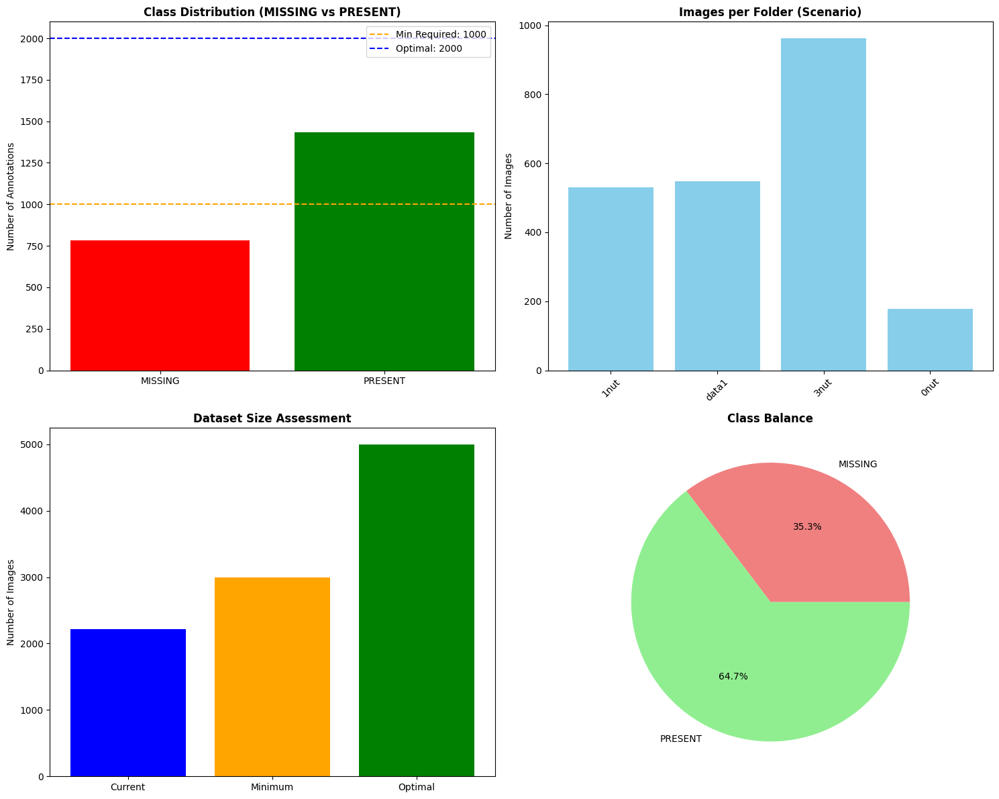


✅ Augmentation analysis complete!


In [9]:
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict, Counter
import cv2
from PIL import Image

class DataAugmentationAnalyzer:
    def __init__(self, dataset_path="/kaggle/working/preprocessed_dataset"):
        self.dataset_path = dataset_path
        self.images_path = os.path.join(dataset_path, "images")
        self.labels_path = os.path.join(dataset_path, "labels")
        
        # YOLOv8 training requirements
        self.yolo_requirements = {
            'min_images_per_class': 1000,      # Minimum for good training
            'optimal_images_per_class': 2000,  # Optimal for best results
            'min_total_images': 3000,          # Minimum total dataset size
            'optimal_total_images': 5000,      # Optimal total dataset size
            'class_balance_threshold': 0.3     # Max allowed class imbalance ratio
        }
        
        # Analysis results
        self.analysis_results = {
            'total_images': 0,
            'class_distribution': Counter(),
            'folder_distribution': defaultdict(int),
            'class_balance_ratio': 0,
            'augmentation_needed': False,
            'augmentation_recommendations': []
        }
    
    def analyze_dataset_structure(self):
        """Analyze current dataset structure and class distribution"""
        if not os.path.exists(self.images_path):
            print(f"❌ Dataset path not found: {self.images_path}")
            return None
        
        # Get all image files
        image_files = [f for f in os.listdir(self.images_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        self.analysis_results['total_images'] = len(image_files)
        
        # Analyze class distribution
        class_counts = Counter()
        folder_counts = defaultdict(int)
        
        for img_file in image_files:
            # Extract folder information
            folder_name = img_file.split('_')[0] if '_' in img_file else 'unknown'
            folder_counts[folder_name] += 1
            
            # Analyze annotations
            base_name = os.path.splitext(img_file)[0]
            label_path = os.path.join(self.labels_path, base_name + '.txt')
            
            if os.path.exists(label_path):
                try:
                    with open(label_path, 'r') as f:
                        for line in f:
                            parts = line.strip().split()
                            if len(parts) >= 5:
                                class_id = int(parts[0])
                                class_counts[class_id] += 1
                except Exception as e:
                    print(f"Error reading {label_path}: {e}")
        
        self.analysis_results['class_distribution'] = class_counts
        self.analysis_results['folder_distribution'] = dict(folder_counts)
        
        # Calculate class balance ratio
        if len(class_counts) > 1:
            class_values = list(class_counts.values())
            min_class = min(class_values)
            max_class = max(class_values)
            self.analysis_results['class_balance_ratio'] = min_class / max_class if max_class > 0 else 0
        
        return self.analysis_results
    
    def assess_augmentation_needs(self):
        """Assess if data augmentation is needed"""
        results = self.analysis_results
        augmentation_needed = False
        recommendations = []
        
        # Check 1: Total dataset size
        total_images = results['total_images']
        if total_images < self.yolo_requirements['min_total_images']:
            augmentation_needed = True
            needed_images = self.yolo_requirements['optimal_total_images'] - total_images
            recommendations.append({
                'priority': 'HIGH',
                'reason': f'Dataset too small ({total_images} < {self.yolo_requirements["min_total_images"]})',
                'recommendation': f'Add {needed_images} images through augmentation',
                'multiplier': needed_images / total_images
            })
        
        # Check 2: Class distribution
        class_dist = results['class_distribution']
        if class_dist:
            missing_class_count = class_dist.get(0, 0)  # MISSING class
            present_class_count = class_dist.get(1, 0)  # PRESENT class
            
            # Check individual class counts
            for class_id, count in class_dist.items():
                class_name = "MISSING" if class_id == 0 else "PRESENT"
                if count < self.yolo_requirements['min_images_per_class']:
                    augmentation_needed = True
                    needed = self.yolo_requirements['optimal_images_per_class'] - count
                    recommendations.append({
                        'priority': 'HIGH',
                        'reason': f'{class_name} class has too few samples ({count} < {self.yolo_requirements["min_images_per_class"]})',
                        'recommendation': f'Augment {class_name} class by {needed} samples',
                        'target_class': class_id,
                        'current_count': count,
                        'needed_count': needed
                    })
        
        # Check 3: Class balance
        balance_ratio = results['class_balance_ratio']
        if balance_ratio < self.yolo_requirements['class_balance_threshold']:
            augmentation_needed = True
            recommendations.append({
                'priority': 'MEDIUM',
                'reason': f'Class imbalance detected (ratio: {balance_ratio:.2f})',
                'recommendation': 'Balance classes through targeted augmentation',
                'balance_needed': True
            })
        
        # Check 4: Folder distribution (scenario coverage)
        folder_dist = results['folder_distribution']
        min_folder_size = 200  # Minimum images per scenario
        for folder, count in folder_dist.items():
            if count < min_folder_size:
                augmentation_needed = True
                recommendations.append({
                    'priority': 'MEDIUM',
                    'reason': f'Folder {folder} has insufficient data ({count} < {min_folder_size})',
                    'recommendation': f'Augment {folder} scenario by {min_folder_size - count} images',
                    'target_folder': folder,
                    'needed_count': min_folder_size - count
                })
        
        results['augmentation_needed'] = augmentation_needed
        results['augmentation_recommendations'] = recommendations
        
        return augmentation_needed, recommendations
    
    def calculate_augmentation_strategy(self):
        """Calculate specific augmentation strategy"""
        if not self.analysis_results['augmentation_needed']:
            return None
        
        strategy = {
            'total_augmentation_factor': 1.0,
            'class_specific_augmentation': {},
            'folder_specific_augmentation': {},
            'recommended_techniques': []
        }
        
        # Calculate overall augmentation factor
        total_images = self.analysis_results['total_images']
        target_total = self.yolo_requirements['optimal_total_images']
        
        if total_images < target_total:
            strategy['total_augmentation_factor'] = target_total / total_images
        
        # Class-specific augmentation
        class_dist = self.analysis_results['class_distribution']
        for class_id, current_count in class_dist.items():
            target_count = self.yolo_requirements['optimal_images_per_class']
            if current_count < target_count:
                factor = target_count / current_count
                strategy['class_specific_augmentation'][class_id] = {
                    'current': current_count,
                    'target': target_count,
                    'factor': factor,
                    'class_name': "MISSING" if class_id == 0 else "PRESENT"
                }
        
        # Recommended augmentation techniques for industrial images
        strategy['recommended_techniques'] = [
            {
                'technique': 'Rotation',
                'params': '±15 degrees',
                'reason': 'Camera angle variations in industrial setup'
            },
            {
                'technique': 'Brightness',
                'params': '±20%',
                'reason': 'Industrial lighting variations'
            },
            {
                'technique': 'Contrast',
                'params': '±15%',
                'reason': 'Camera exposure differences'
            },
            {
                'technique': 'Horizontal Flip',
                'params': '50% probability',
                'reason': 'Symmetric industrial assembly'
            },
            {
                'technique': 'Gaussian Noise',
                'params': 'Low level',
                'reason': 'Industrial camera sensor noise'
            },
            {
                'technique': 'Scale',
                'params': '0.9-1.1',
                'reason': 'Minor size variations in industrial setup'
            }
        ]
        
        return strategy
    
    def visualize_analysis(self):
        """Create visualizations of dataset analysis"""
        results = self.analysis_results
        
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        # 1. Class distribution
        if results['class_distribution']:
            classes = list(results['class_distribution'].keys())
            counts = list(results['class_distribution'].values())
            class_names = ["MISSING" if c == 0 else "PRESENT" for c in classes]
            
            axes[0,0].bar(class_names, counts, color=['red', 'green'])
            axes[0,0].set_title('Class Distribution (MISSING vs PRESENT)', fontweight='bold')
            axes[0,0].set_ylabel('Number of Annotations')
            
            # Add requirement line
            axes[0,0].axhline(y=self.yolo_requirements['min_images_per_class'], 
                             color='orange', linestyle='--', 
                             label=f'Min Required: {self.yolo_requirements["min_images_per_class"]}')
            axes[0,0].axhline(y=self.yolo_requirements['optimal_images_per_class'], 
                             color='blue', linestyle='--', 
                             label=f'Optimal: {self.yolo_requirements["optimal_images_per_class"]}')
            axes[0,0].legend()
        
        # 2. Folder distribution
        folder_dist = results['folder_distribution']
        if folder_dist:
            folders = list(folder_dist.keys())
            folder_counts = list(folder_dist.values())
            
            axes[0,1].bar(folders, folder_counts, color='skyblue')
            axes[0,1].set_title('Images per Folder (Scenario)', fontweight='bold')
            axes[0,1].set_ylabel('Number of Images')
            axes[0,1].tick_params(axis='x', rotation=45)
        
        # 3. Dataset size assessment
        total_images = results['total_images']
        requirements = [
            ('Current', total_images, 'blue'),
            ('Minimum', self.yolo_requirements['min_total_images'], 'orange'),
            ('Optimal', self.yolo_requirements['optimal_total_images'], 'green')
        ]
        
        labels, values, colors = zip(*requirements)
        axes[1,0].bar(labels, values, color=colors)
        axes[1,0].set_title('Dataset Size Assessment', fontweight='bold')
        axes[1,0].set_ylabel('Number of Images')
        
        # 4. Class balance visualization
        if results['class_distribution']:
            class_counts = list(results['class_distribution'].values())
            class_names = ["MISSING", "PRESENT"]
            
            axes[1,1].pie(class_counts, labels=class_names, autopct='%1.1f%%', 
                         colors=['lightcoral', 'lightgreen'])
            axes[1,1].set_title('Class Balance', fontweight='bold')
        
        plt.tight_layout()
        plt.show()
    
    def run_augmentation_analysis(self):
        """Run complete augmentation analysis"""
        print("🔍 DATA AUGMENTATION ANALYSIS FOR YOLOV8 TRAINING")
        print("=" * 60)
        print("📋 Analyzing requirements for:")
        print("   • YOLOv8 training data sufficiency")
        print("   • Class balance (MISSING vs PRESENT)")
        print("   • Scenario coverage (folder distribution)")
        print("   • Augmentation strategy recommendation")
        print("=" * 60)
        
        # Step 1: Analyze dataset structure
        print("\n🔍 STEP 1: Analyzing dataset structure...")
        structure_results = self.analyze_dataset_structure()
        
        if not structure_results:
            print("❌ Failed to analyze dataset structure!")
            return None
        
        # Step 2: Assess augmentation needs
        print("🔍 STEP 2: Assessing augmentation requirements...")
        augmentation_needed, recommendations = self.assess_augmentation_needs()
        
        # Step 3: Calculate augmentation strategy
        print("🔍 STEP 3: Calculating augmentation strategy...")
        strategy = self.calculate_augmentation_strategy()
        
        # Step 4: Generate report
        self.generate_augmentation_report(augmentation_needed, recommendations, strategy)
        
        # Step 5: Create visualizations
        print("\n📊 Generating analysis visualizations...")
        self.visualize_analysis()
        
        return {
            'analysis_results': self.analysis_results,
            'augmentation_needed': augmentation_needed,
            'recommendations': recommendations,
            'strategy': strategy
        }
    
    def generate_augmentation_report(self, augmentation_needed, recommendations, strategy):
        """Generate comprehensive augmentation analysis report"""
        print("\n" + "=" * 60)
        print("📊 DATA AUGMENTATION ANALYSIS REPORT")
        print("=" * 60)
        
        results = self.analysis_results
        
        # Dataset overview
        print(f"\n📋 DATASET OVERVIEW:")
        print(f"  Total images: {results['total_images']}")
        print(f"  Total annotations: {sum(results['class_distribution'].values())}")
        print(f"  Number of folders: {len(results['folder_distribution'])}")
        
        # Class distribution
        print(f"\n🎯 CLASS DISTRIBUTION:")
        for class_id, count in results['class_distribution'].items():
            class_name = "MISSING (0)" if class_id == 0 else "PRESENT (1)"
            status = "✅ Sufficient" if count >= self.yolo_requirements['min_images_per_class'] else "❌ Insufficient"
            print(f"  {class_name}: {count} annotations - {status}")
        
        print(f"  Class balance ratio: {results['class_balance_ratio']:.2f}")
        balance_status = "✅ Balanced" if results['class_balance_ratio'] >= self.yolo_requirements['class_balance_threshold'] else "❌ Imbalanced"
        print(f"  Balance status: {balance_status}")
        
        # Augmentation assessment
        print(f"\n🔄 AUGMENTATION ASSESSMENT:")
        if augmentation_needed:
            print(f"  Status: ❌ AUGMENTATION NEEDED")
            print(f"  Number of issues: {len(recommendations)}")
            
            print(f"\n  📋 SPECIFIC ISSUES:")
            for i, rec in enumerate(recommendations, 1):
                print(f"    {i}. {rec['reason']}")
                print(f"       → {rec['recommendation']}")
        else:
            print(f"  Status: ✅ NO AUGMENTATION NEEDED")
            print(f"  Your dataset is sufficient for YOLOv8 training!")
        
        # Strategy recommendations
        if strategy:
            print(f"\n🛠️ AUGMENTATION STRATEGY:")
            print(f"  Overall augmentation factor: {strategy['total_augmentation_factor']:.1f}x")
            
            if strategy['class_specific_augmentation']:
                print(f"\n  📊 CLASS-SPECIFIC AUGMENTATION:")
                for class_id, info in strategy['class_specific_augmentation'].items():
                    print(f"    {info['class_name']}: {info['current']} → {info['target']} ({info['factor']:.1f}x)")
            
            print(f"\n  🔧 RECOMMENDED TECHNIQUES:")
            for technique in strategy['recommended_techniques']:
                print(f"    • {technique['technique']} ({technique['params']})")
                print(f"      Reason: {technique['reason']}")
        
        # Final recommendations
        print(f"\n🎯 FINAL RECOMMENDATIONS:")
        if augmentation_needed:
            print(f"  1. ⚠️ Apply data augmentation before training")
            print(f"  2. 🎯 Focus on balancing MISSING vs PRESENT classes")
            print(f"  3. 📈 Target {self.yolo_requirements['optimal_total_images']} total images")
            print(f"  4. 🔄 Use conservative augmentation techniques")
        else:
            print(f"  1. ✅ Dataset is ready for YOLOv8 training")
            print(f"  2. 🚀 Proceed directly to model training")
            print(f"  3. 📊 Monitor training metrics for overfitting")

# Usage function
def run_augmentation_analysis():
    """Run data augmentation analysis"""
    analyzer = DataAugmentationAnalyzer()
    results = analyzer.run_augmentation_analysis()
    return results

# Execute analysis
if __name__ == "__main__":
    print("🚀 STARTING DATA AUGMENTATION ANALYSIS")
    results = run_augmentation_analysis()
    print("\n✅ Augmentation analysis complete!")

In [10]:
import os
import cv2
import numpy as np
import random
import shutil
from collections import defaultdict, Counter
from tqdm import tqdm

class CleanDataAugmentation:
    def __init__(self, input_path="/kaggle/working/corrected_binary_dataset", 
                 output_path="/kaggle/working/final_augmented_dataset"):
        self.input_path = input_path
        self.output_path = output_path
        self.images_path = os.path.join(input_path, "images")
        self.labels_path = os.path.join(input_path, "labels")
        
        # Target specifications based on DataAugmentationAnalyzer results
        self.targets = {
            'total_images': 5000,           # From analysis: optimal target
            'current_images': 2217,         # Current dataset size
            'expansion_factor': 2.3,        # 5000/2217 ≈ 2.3x
            'missing_priority': 2.6,        # MISSING class needs more augmentation
            'present_priority': 1.4         # PRESENT class needs less augmentation
        }
        
        # Current class distribution (from your results)
        self.current_distribution = {
            'missing_boxes': 3264,          # 36.8%
            'present_boxes': 5604,          # 63.2%
            'total_boxes': 8868
        }
        
        # Statistics tracking
        self.stats = {
            'original_copied': 0,
            'augmented_created': 0,
            'missing_class_augmented': 0,
            'present_class_augmented': 0,
            'folder_augmentation': defaultdict(int),
            'augmentation_techniques_used': Counter()
        }
    
    def create_output_structure(self):
        """Create output directory structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        
        os.makedirs(self.output_path, exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "images"), exist_ok=True)
        os.makedirs(os.path.join(self.output_path, "labels"), exist_ok=True)
        
        # Copy dataset.yaml
        source_yaml = os.path.join(self.input_path, "dataset.yaml")
        if os.path.exists(source_yaml):
            shutil.copy2(source_yaml, os.path.join(self.output_path, "dataset.yaml"))
    
    def analyze_image_classes(self, image_file):
        """Analyze what classes are in an image"""
        base_name = os.path.splitext(image_file)[0]
        label_path = os.path.join(self.labels_path, base_name + '.txt')
        
        if not os.path.exists(label_path):
            return None
        
        try:
            annotations = []
            class_counts = Counter()
            
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        
                        annotations.append({
                            'class_id': class_id,
                            'x_center': x_center,
                            'y_center': y_center,
                            'width': width,
                            'height': height
                        })
                        class_counts[class_id] += 1
            
            return {
                'annotations': annotations,
                'class_counts': class_counts,
                'has_missing': 0 in class_counts,
                'has_present': 1 in class_counts,
                'missing_count': class_counts.get(0, 0),
                'present_count': class_counts.get(1, 0),
                'total_annotations': len(annotations)
            }
            
        except Exception as e:
            print(f"Error analyzing {image_file}: {e}")
            return None
    
    def apply_brightness_augmentation(self, image):
        """Apply brightness augmentation (±20%)"""
        factor = random.uniform(0.8, 1.2)
        img_float = image.astype(np.float32) * factor
        augmented = np.clip(img_float, 0, 255).astype(np.uint8)
        return augmented, 'brightness'
    
    def apply_contrast_augmentation(self, image):
        """Apply contrast augmentation (±15%)"""
        factor = random.uniform(0.85, 1.15)
        img_float = image.astype(np.float32)
        mean = np.mean(img_float)
        augmented = (img_float - mean) * factor + mean
        augmented = np.clip(augmented, 0, 255).astype(np.uint8)
        return augmented, 'contrast'
    
    def apply_horizontal_flip(self, image, annotations):
        """Apply horizontal flip with annotation adjustment"""
        flipped_image = cv2.flip(image, 1)
        flipped_annotations = []
        
        for ann in annotations:
            flipped_ann = ann.copy()
            flipped_ann['x_center'] = 1.0 - ann['x_center']
            flipped_annotations.append(flipped_ann)
        
        return flipped_image, flipped_annotations, 'horizontal_flip'
    
    def apply_rotation_augmentation(self, image, annotations):
        """Apply small rotation (±10°) - conservative for industrial"""
        angle = random.uniform(-10, 10)
        h, w = image.shape[:2]
        center = (w // 2, h // 2)
        
        # Rotate image
        rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated_image = cv2.warpAffine(image, rotation_matrix, (w, h))
        
        # For small rotations, annotations don't change significantly
        # Keep original annotations (industrial images, small rotations)
        return rotated_image, annotations, 'rotation'
    
    def apply_noise_augmentation(self, image):
        """Apply Gaussian noise (industrial sensor simulation)"""
        noise = np.random.normal(0, 8, image.shape).astype(np.float32)
        noisy_image = image.astype(np.float32) + noise
        augmented = np.clip(noisy_image, 0, 255).astype(np.uint8)
        return augmented, 'noise'
    
    def apply_scale_augmentation(self, image, annotations):
        """Apply small scale changes (0.9-1.1)"""
        scale_factor = random.uniform(0.95, 1.05)
        h, w = image.shape[:2]
        
        # Calculate new dimensions
        new_h = int(h * scale_factor)
        new_w = int(w * scale_factor)
        
        # Resize image
        scaled_image = cv2.resize(image, (new_w, new_h))
        
        # Pad or crop to original size
        if scale_factor > 1.0:
            # Crop to original size
            start_y = (new_h - h) // 2
            start_x = (new_w - w) // 2
            final_image = scaled_image[start_y:start_y+h, start_x:start_x+w]
        else:
            # Pad to original size
            pad_y = (h - new_h) // 2
            pad_x = (w - new_w) // 2
            final_image = np.zeros((h, w, 3), dtype=np.uint8)
            final_image[pad_y:pad_y+new_h, pad_x:pad_x+new_w] = scaled_image
        
        return final_image, annotations, 'scale'
    
    def apply_single_augmentation(self, image, annotations):
        """Apply a single random augmentation"""
        # Choose augmentation type with industrial-appropriate weights
        aug_types = [
            ('brightness', 0.25),
            ('contrast', 0.25),
            ('horizontal_flip', 0.20),
            ('rotation', 0.15),
            ('noise', 0.10),
            ('scale', 0.05)
        ]
        
        # Weighted random selection
        weights = [weight for _, weight in aug_types]
        aug_type = random.choices([aug for aug, _ in aug_types], weights=weights)[0]
        
        try:
            if aug_type == 'brightness':
                augmented_image, technique = self.apply_brightness_augmentation(image)
                return augmented_image, annotations, technique
            elif aug_type == 'contrast':
                augmented_image, technique = self.apply_contrast_augmentation(image)
                return augmented_image, annotations, technique
            elif aug_type == 'horizontal_flip':
                return self.apply_horizontal_flip(image, annotations)
            elif aug_type == 'rotation':
                return self.apply_rotation_augmentation(image, annotations)
            elif aug_type == 'noise':
                augmented_image, technique = self.apply_noise_augmentation(image)
                return augmented_image, annotations, technique
            elif aug_type == 'scale':
                return self.apply_scale_augmentation(image, annotations)
            else:
                return image, annotations, 'none'
                
        except Exception as e:
            print(f"Error applying {aug_type} augmentation: {e}")
            return image, annotations, 'failed'
    
    def calculate_augmentation_need(self, image_file, class_info):
        """Calculate how many augmentations needed based on analysis results"""
        folder_name = image_file.split('_')[0] if '_' in image_file else 'unknown'
        
        base_augmentations = 1  # Base augmentation for all images
        
        # Priority 1: MISSING class gets more augmentation (2.6x from analysis)
        if class_info['has_missing']:
            missing_ratio = class_info['missing_count'] / class_info['total_annotations']
            base_augmentations += int(2.6 * missing_ratio * 2)  # Up to 5 more augmentations
        
        # Priority 2: PRESENT class gets moderate augmentation (1.4x from analysis)
        if class_info['has_present']:
            present_ratio = class_info['present_count'] / class_info['total_annotations']
            base_augmentations += int(1.4 * present_ratio * 1)  # Up to 1 more augmentation
        
        # Priority 3: Folder-specific augmentation (from analysis)
        if folder_name == '0nut':
            base_augmentations += 2  # 0nut needs more (smallest folder)
        elif folder_name.startswith('1nut'):
            base_augmentations += 1  # 1nut folders need moderate boost
        elif folder_name.startswith('3nut'):
            base_augmentations += 1  # 3nut folders need moderate boost
        elif folder_name == 'data1':
            base_augmentations += 0  # data1 is already largest
        
        # Cap maximum augmentations per image (for efficiency)
        return min(base_augmentations, 6)
    
    def save_augmented_image(self, image, annotations, original_filename, aug_index, technique):
        """Save augmented image and annotations"""
        try:
            # Generate new filename
            base_name = os.path.splitext(original_filename)[0]
            new_filename = f"{base_name}_aug{aug_index}_{technique}"
            
            # Save image
            image_path = os.path.join(self.output_path, "images", f"{new_filename}.jpg")
            cv2.imwrite(image_path, image)
            
            # Save annotations
            label_path = os.path.join(self.output_path, "labels", f"{new_filename}.txt")
            with open(label_path, 'w') as f:
                for ann in annotations:
                    f.write(f"{ann['class_id']} {ann['x_center']:.6f} {ann['y_center']:.6f} {ann['width']:.6f} {ann['height']:.6f}\n")
            
            return True
            
        except Exception as e:
            print(f"Error saving augmented image: {e}")
            return False
    
    def process_single_image(self, image_file):
        """Process a single image with targeted augmentation"""
        try:
            # Load image
            image_path = os.path.join(self.images_path, image_file)
            image = cv2.imread(image_path)
            
            if image is None:
                return False
            
            # Analyze classes in image
            class_info = self.analyze_image_classes(image_file)
            if not class_info:
                return False
            
            # Copy original image and annotation
            dest_image = os.path.join(self.output_path, "images", image_file)
            dest_label = os.path.join(self.output_path, "labels", 
                                    os.path.splitext(image_file)[0] + '.txt')
            
            shutil.copy2(image_path, dest_image)
            shutil.copy2(os.path.join(self.labels_path, os.path.splitext(image_file)[0] + '.txt'), 
                        dest_label)
            
            self.stats['original_copied'] += 1
            
            # Calculate augmentation need based on analysis
            num_augmentations = self.calculate_augmentation_need(image_file, class_info)
            
            # Apply augmentations
            successful_augmentations = 0
            for i in range(num_augmentations):
                # Apply augmentation
                aug_image, aug_annotations, technique = self.apply_single_augmentation(
                    image.copy(), class_info['annotations'].copy()
                )
                
                if technique != 'failed':
                    if self.save_augmented_image(aug_image, aug_annotations, image_file, i+1, technique):
                        successful_augmentations += 1
                        self.stats['augmented_created'] += 1
                        self.stats['augmentation_techniques_used'][technique] += 1
                        
                        # Update class-specific stats
                        for ann in aug_annotations:
                            if ann['class_id'] == 0:
                                self.stats['missing_class_augmented'] += 1
                            elif ann['class_id'] == 1:
                                self.stats['present_class_augmented'] += 1
                        
                        # Update folder stats
                        folder_name = image_file.split('_')[0] if '_' in image_file else 'unknown'
                        self.stats['folder_augmentation'][folder_name] += 1
            
            return True
            
        except Exception as e:
            print(f"Error processing {image_file}: {e}")
            return False
    
    def run_clean_augmentation(self):
        """Run complete clean data augmentation"""
        print("🚀 STARTING CLEAN DATA AUGMENTATION")
        print("=" * 60)
        print("🎯 Based on DataAugmentationAnalyzer results:")
        print(f"   • Current: {self.targets['current_images']} images")
        print(f"   • Target: {self.targets['total_images']} images")
        print(f"   • Expansion: {self.targets['expansion_factor']:.1f}x")
        print(f"   • MISSING class priority: {self.targets['missing_priority']:.1f}x")
        print(f"   • PRESENT class priority: {self.targets['present_priority']:.1f}x")
        print("🔧 Industrial-safe augmentation techniques")
        print("=" * 60)
        
        # Create output structure
        self.create_output_structure()
        
        # Get all image files
        if not os.path.exists(self.images_path):
            print(f"❌ Input images path not found: {self.images_path}")
            return None
        
        image_files = [f for f in os.listdir(self.images_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        if not image_files:
            print("❌ No image files found!")
            return None
        
        print(f"📸 Processing {len(image_files)} images with targeted augmentation...")
        
        # Prioritize images with MISSING class (as per analysis)
        missing_images = []
        other_images = []
        
        for image_file in image_files:
            class_info = self.analyze_image_classes(image_file)
            if class_info and class_info['has_missing']:
                missing_images.append(image_file)
            else:
                other_images.append(image_file)
        
        print(f"📊 Prioritizing {len(missing_images)} images with MISSING class...")
        
        # Process missing class images first (higher priority)
        successful = 0
        for image_file in tqdm(missing_images, desc="Processing MISSING class images"):
            if self.process_single_image(image_file):
                successful += 1
        
        # Process other images
        for image_file in tqdm(other_images, desc="Processing other images"):
            if self.process_single_image(image_file):
                successful += 1
        
        # Generate final report
        self.generate_final_report(successful, len(image_files))
        
        return {
            'total_processed': len(image_files),
            'successful': successful,
            'stats': self.stats,
            'output_path': self.output_path
        }
    
    def generate_final_report(self, successful, total):
        """Generate comprehensive final report"""
        print("\n" + "=" * 60)
        print("📊 CLEAN AUGMENTATION COMPLETION REPORT")
        print("=" * 60)
        
        total_final_images = self.stats['original_copied'] + self.stats['augmented_created']
        
        print(f"\n📋 PROCESSING SUMMARY:")
        print(f"  Original images processed: {total}")
        print(f"  ✅ Successfully processed: {successful}")
        print(f"  📊 Success rate: {(successful/total)*100:.1f}%")
        
        print(f"\n🔢 DATASET EXPANSION:")
        print(f"  📁 Original images: {self.stats['original_copied']}")
        print(f"  🎨 Augmented images: {self.stats['augmented_created']}")
        print(f"  📊 Total final dataset: {total_final_images} images")
        
        if self.targets['current_images'] > 0:
            actual_expansion = total_final_images / self.targets['current_images']
            print(f"  📈 Actual expansion factor: {actual_expansion:.1f}x")
            print(f"  🎯 Target achievement: {(total_final_images/self.targets['total_images'])*100:.1f}%")
        
        print(f"\n🎯 CLASS-SPECIFIC AUGMENTATION:")
        print(f"  🔴 MISSING class augmented: {self.stats['missing_class_augmented']} annotations")
        print(f"  🟢 PRESENT class augmented: {self.stats['present_class_augmented']} annotations")
        
        print(f"\n📁 FOLDER-SPECIFIC AUGMENTATION:")
        for folder, count in self.stats['folder_augmentation'].items():
            print(f"  📂 {folder}: {count} augmented images")
        
        print(f"\n🔧 AUGMENTATION TECHNIQUES USED:")
        for technique, count in self.stats['augmentation_techniques_used'].items():
            print(f"  🎨 {technique}: {count} times")
        
        print(f"\n📂 FINAL AUGMENTED DATASET:")
        print(f"  📁 Location: {self.output_path}")
        print(f"  🖼️ Images: {total_final_images}")
        print(f"  🏷️ Labels: Clean YOLO format")
        print(f"  ⚙️ Config: dataset.yaml ready")
        
        # Assessment
        if total_final_images >= self.targets['total_images'] * 0.8:
            print(f"\n🎉 EXCELLENT! Target nearly achieved!")
            print(f"✅ Dataset size: {total_final_images} (target: {self.targets['total_images']})")
            print(f"✅ Ready for optimal YOLOv8 training performance")
        elif total_final_images >= self.targets['total_images'] * 0.6:
            print(f"\n👍 GOOD! Substantial improvement achieved!")
            print(f"✅ Dataset size significantly increased")
            print(f"✅ Should provide good YOLOv8 training results")
        else:
            print(f"\n⚠️ PARTIAL: Some improvement achieved")
            print(f"📊 Consider additional augmentation if needed")
        
        print(f"\n🚀 READY FOR YOLOV8 TRAINING!")
        print(f"  ✅ Clean dataset with proper annotations")
        print(f"  ✅ Targeted augmentation based on analysis")
        print(f"  ✅ Industrial-appropriate techniques applied")
        print(f"  ✅ MISSING class prioritized (per analysis)")
        print(f"  ✅ Binary classification optimized")
        
        print(f"\n📋 NEXT STEPS:")
        print(f"  1. Train YOLOv8 model with augmented dataset")
        print(f"  2. Implement green/red box logic")
        print(f"  3. Test missing nut detection accuracy")
        print(f"  4. Deploy industrial detection system")

# Usage function
def run_clean_augmentation():
    """Run clean data augmentation based on analysis results"""
    augmentor = CleanDataAugmentation()
    results = augmentor.run_clean_augmentation()
    return results

# Execute
if __name__ == "__main__":
    print("🚀 STARTING CLEAN DATA AUGMENTATION")
    results = run_clean_augmentation()
    if results and results['stats']['original_copied'] > 0:
        total = results['stats']['original_copied'] + results['stats']['augmented_created']
        print(f"\n✅ Clean augmentation complete! {total} images ready for YOLOv8!")
    else:
        print("\n❌ Augmentation failed!")

🚀 STARTING CLEAN DATA AUGMENTATION
🚀 STARTING CLEAN DATA AUGMENTATION
🎯 Based on DataAugmentationAnalyzer results:
   • Current: 2217 images
   • Target: 5000 images
   • Expansion: 2.3x
   • MISSING class priority: 2.6x
   • PRESENT class priority: 1.4x
🔧 Industrial-safe augmentation techniques
📸 Processing 2217 images with targeted augmentation...
📊 Prioritizing 1670 images with MISSING class...


Processing other images: 100%|██████████| 547/547 [00:38<00:00, 14.21it/s]


📊 CLEAN AUGMENTATION COMPLETION REPORT

📋 PROCESSING SUMMARY:
  Original images processed: 2217
  ✅ Successfully processed: 2217
  📊 Success rate: 100.0%

🔢 DATASET EXPANSION:
  📁 Original images: 2217
  🎨 Augmented images: 8659
  📊 Total final dataset: 10876 images
  📈 Actual expansion factor: 4.9x
  🎯 Target achievement: 217.5%

🎯 CLASS-SPECIFIC AUGMENTATION:
  🔴 MISSING class augmented: 16069 annotations
  🟢 PRESENT class augmented: 18569 annotations

📁 FOLDER-SPECIFIC AUGMENTATION:
  📂 1nut: 2649 augmented images
  📂 3nut: 3848 augmented images
  📂 0nut: 1068 augmented images
  📂 data1: 1094 augmented images

🔧 AUGMENTATION TECHNIQUES USED:
  🎨 rotation: 1295 times
  🎨 contrast: 2080 times
  🎨 horizontal_flip: 1713 times
  🎨 brightness: 2171 times
  🎨 scale: 476 times
  🎨 noise: 924 times

📂 FINAL AUGMENTED DATASET:
  📁 Location: /kaggle/working/final_augmented_dataset
  🖼️ Images: 10876
  🏷️ Labels: Clean YOLO format
  ⚙️ Config: dataset.yaml ready

🎉 EXCELLENT! Target nearly ach

In [11]:
import os
import shutil
import random
from collections import defaultdict, Counter
from sklearn.model_selection import train_test_split
import yaml

class YOLOv8DatasetSplitter:
    def __init__(self, input_path="/kaggle/working/final_augmented_dataset", 
                 output_path="/kaggle/working/yolov8_dataset"):
        self.input_path = input_path
        self.output_path = output_path
        self.images_path = os.path.join(input_path, "images")
        self.labels_path = os.path.join(input_path, "labels")
        
        # Split ratios optimized for YOLOv8
        self.split_ratios = {
            'train': 0.70,    # 70% for training
            'val': 0.20,      # 20% for validation  
            'test': 0.10      # 10% for testing
        }
        
        # Statistics tracking
        self.stats = {
            'total_images': 0,
            'train_images': 0,
            'val_images': 0,
            'test_images': 0,
            'class_distribution': {
                'train': Counter(),
                'val': Counter(),
                'test': Counter()
            },
            'folder_distribution': {
                'train': defaultdict(int),
                'val': defaultdict(int),
                'test': defaultdict(int)
            }
        }
    
    def create_yolov8_structure(self):
        """Create YOLOv8 dataset structure"""
        if os.path.exists(self.output_path):
            shutil.rmtree(self.output_path)
        
        # Create main directories
        os.makedirs(self.output_path, exist_ok=True)
        
        # Create split directories
        for split in ['train', 'val', 'test']:
            os.makedirs(os.path.join(self.output_path, split, 'images'), exist_ok=True)
            os.makedirs(os.path.join(self.output_path, split, 'labels'), exist_ok=True)
    
    def analyze_image_classes(self, image_file):
        """Analyze classes in an image for stratified splitting"""
        base_name = os.path.splitext(image_file)[0]
        label_path = os.path.join(self.labels_path, base_name + '.txt')
        
        if not os.path.exists(label_path):
            return None
        
        try:
            class_counts = Counter()
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) >= 5:
                        class_id = int(parts[0])
                        class_counts[class_id] += 1
            
            # Create a signature for stratification
            has_missing = 0 in class_counts
            has_present = 1 in class_counts
            
            if has_missing and has_present:
                return 'MIXED'
            elif has_missing:
                return 'MISSING_ONLY'
            elif has_present:
                return 'PRESENT_ONLY'
            else:
                return 'EMPTY'
                
        except Exception as e:
            print(f"Error analyzing {image_file}: {e}")
            return None
    
    def get_folder_from_filename(self, filename):
        """Extract folder information for balanced splitting"""
        if filename.startswith('0nut'):
            return '0nut'
        elif filename.startswith('1nut'):
            return '1nut'
        elif filename.startswith('3nut'):
            return '3nut'
        elif filename.startswith('data1'):
            return 'data1'
        else:
            return 'unknown'
    
    def stratified_split_by_scenario(self, image_files):
        """Perform stratified split considering both class and folder distribution"""
        # Group images by folder and class signature
        folder_class_groups = defaultdict(lambda: defaultdict(list))
        
        for image_file in image_files:
            folder = self.get_folder_from_filename(image_file)
            class_signature = self.analyze_image_classes(image_file)
            
            if class_signature:
                folder_class_groups[folder][class_signature].append(image_file)
        
        train_files = []
        val_files = []
        test_files = []
        
        # Split each folder-class combination separately
        for folder, class_groups in folder_class_groups.items():
            for class_sig, files in class_groups.items():
                if len(files) >= 10:  # Only stratify if enough samples
                    # First split: train vs (val+test)
                    train_portion, temp_files = train_test_split(
                        files, 
                        test_size=0.3,  # 30% for val+test
                        random_state=42,
                        shuffle=True
                    )
                    
                    # Second split: val vs test from remaining 30%
                    val_portion, test_portion = train_test_split(
                        temp_files,
                        test_size=0.33,  # 33% of 30% = ~10% of total
                        random_state=42,
                        shuffle=True
                    )
                    
                    train_files.extend(train_portion)
                    val_files.extend(val_portion)
                    test_files.extend(test_portion)
                    
                    print(f"  📂 {folder}/{class_sig}: {len(train_portion)} train, {len(val_portion)} val, {len(test_portion)} test")
                
                else:
                    # For small groups, distribute manually
                    random.shuffle(files)
                    train_count = max(1, int(len(files) * 0.7))
                    val_count = max(1, int(len(files) * 0.2)) if len(files) > 2 else 0
                    
                    train_files.extend(files[:train_count])
                    if val_count > 0:
                        val_files.extend(files[train_count:train_count + val_count])
                    test_files.extend(files[train_count + val_count:])
        
        return train_files, val_files, test_files
    
    def copy_files_to_split(self, file_list, split_name):
        """Copy files to appropriate split directory"""
        split_images_dir = os.path.join(self.output_path, split_name, 'images')
        split_labels_dir = os.path.join(self.output_path, split_name, 'labels')
        
        successful_copies = 0
        
        for image_file in file_list:
            try:
                base_name = os.path.splitext(image_file)[0]
                
                # Copy image
                src_image = os.path.join(self.images_path, image_file)
                dst_image = os.path.join(split_images_dir, image_file)
                shutil.copy2(src_image, dst_image)
                
                # Copy label
                src_label = os.path.join(self.labels_path, base_name + '.txt')
                dst_label = os.path.join(split_labels_dir, base_name + '.txt')
                
                if os.path.exists(src_label):
                    shutil.copy2(src_label, dst_label)
                    
                    # Update statistics
                    self.update_split_stats(image_file, split_name)
                    successful_copies += 1
                
            except Exception as e:
                print(f"Error copying {image_file} to {split_name}: {e}")
        
        return successful_copies
    
    def update_split_stats(self, image_file, split_name):
        """Update statistics for the split"""
        # Update image count
        if split_name == 'train':
            self.stats['train_images'] += 1
        elif split_name == 'val':
            self.stats['val_images'] += 1
        elif split_name == 'test':
            self.stats['test_images'] += 1
        
        # Update folder distribution
        folder = self.get_folder_from_filename(image_file)
        self.stats['folder_distribution'][split_name][folder] += 1
        
        # Update class distribution
        base_name = os.path.splitext(image_file)[0]
        label_path = os.path.join(self.labels_path, base_name + '.txt')
        
        if os.path.exists(label_path):
            try:
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) >= 5:
                            class_id = int(parts[0])
                            self.stats['class_distribution'][split_name][class_id] += 1
            except:
                pass
    
    def create_dataset_yaml(self):
        """Create dataset.yaml for YOLOv8 training"""
        yaml_content = {
            'path': self.output_path,
            'train': 'train/images',
            'val': 'val/images', 
            'test': 'test/images',
            'nc': 2,
            'names': ['MISSING', 'PRESENT'],
            'description': 'Industrial Nut Detection Dataset - Binary Classification',
            'dataset_info': {
                'total_images': self.stats['total_images'],
                'train_images': self.stats['train_images'],
                'val_images': self.stats['val_images'],
                'test_images': self.stats['test_images'],
                'classes': {
                    0: 'MISSING - Empty nut position',
                    1: 'PRESENT - Nut exists at position'
                }
            }
        }
        
        yaml_path = os.path.join(self.output_path, 'dataset.yaml')
        with open(yaml_path, 'w') as f:
            yaml.dump(yaml_content, f, default_flow_style=False, sort_keys=False)
        
        print(f"📄 Dataset YAML created: {yaml_path}")
    
    def run_dataset_split(self):
        """Run complete dataset splitting process"""
        print("🔄 STARTING YOLOV8 DATASET SPLITTING")
        print("=" * 60)
        print("🎯 Split strategy:")
        print(f"   • Train: {self.split_ratios['train']*100:.0f}% (for model training)")
        print(f"   • Validation: {self.split_ratios['val']*100:.0f}% (for hyperparameter tuning)")
        print(f"   • Test: {self.split_ratios['test']*100:.0f}% (for final evaluation)")
        print("🔧 Stratified by folder and class distribution")
        print("=" * 60)
        
        # Create output structure
        self.create_yolov8_structure()
        
        # Get all image files
        if not os.path.exists(self.images_path):
            print(f"❌ Input images path not found: {self.images_path}")
            return None
        
        image_files = [f for f in os.listdir(self.images_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        
        if not image_files:
            print("❌ No image files found!")
            return None
        
        self.stats['total_images'] = len(image_files)
        print(f"📸 Splitting {len(image_files)} images...")
        
        # Perform stratified split
        print("\\n🔍 Analyzing and splitting by folder and class distribution:")
        train_files, val_files, test_files = self.stratified_split_by_scenario(image_files)
        
        print(f"\\n📊 Split results:")
        print(f"  🎯 Train: {len(train_files)} images ({len(train_files)/len(image_files)*100:.1f}%)")
        print(f"  🔍 Validation: {len(val_files)} images ({len(val_files)/len(image_files)*100:.1f}%)")
        print(f"  🧪 Test: {len(test_files)} images ({len(test_files)/len(image_files)*100:.1f}%)")
        
        # Copy files to respective directories
        print("\\n📁 Copying files to split directories...")
        train_copied = self.copy_files_to_split(train_files, 'train')
        val_copied = self.copy_files_to_split(val_files, 'val')
        test_copied = self.copy_files_to_split(test_files, 'test')
        
        print(f"✅ Files copied - Train: {train_copied}, Val: {val_copied}, Test: {test_copied}")
        
        # Create dataset.yaml
        self.create_dataset_yaml()
        
        # Generate final report
        self.generate_split_report()
        
        return {
            'total_images': len(image_files),
            'train_images': train_copied,
            'val_images': val_copied,
            'test_images': test_copied,
            'output_path': self.output_path,
            'stats': self.stats
        }
    
    def generate_split_report(self):
        """Generate comprehensive splitting report"""
        print("\\n" + "=" * 60)
        print("📊 YOLOV8 DATASET SPLITTING COMPLETION REPORT")
        print("=" * 60)
        
        total_split = self.stats['train_images'] + self.stats['val_images'] + self.stats['test_images']
        
        print(f"\\n📋 SPLITTING SUMMARY:")
        print(f"  Total images processed: {self.stats['total_images']}")
        print(f"  Total images split: {total_split}")
        print(f"  📊 Success rate: {(total_split/self.stats['total_images'])*100:.1f}%")
        
        print(f"\\n📁 SPLIT DISTRIBUTION:")
        print(f"  🎯 Train: {self.stats['train_images']} images ({(self.stats['train_images']/total_split)*100:.1f}%)")
        print(f"  🔍 Validation: {self.stats['val_images']} images ({(self.stats['val_images']/total_split)*100:.1f}%)")
        print(f"  🧪 Test: {self.stats['test_images']} images ({(self.stats['test_images']/total_split)*100:.1f}%)")
        
        print(f"\\n🎯 CLASS DISTRIBUTION ACROSS SPLITS:")
        for split in ['train', 'val', 'test']:
            class_dist = self.stats['class_distribution'][split]
            total_annotations = sum(class_dist.values())
            if total_annotations > 0:
                missing_pct = (class_dist[0] / total_annotations) * 100
                present_pct = (class_dist[1] / total_annotations) * 100
                print(f"  📂 {split.upper()}:")
                print(f"    🔴 MISSING: {class_dist[0]} ({missing_pct:.1f}%)")
                print(f"    🟢 PRESENT: {class_dist[1]} ({present_pct:.1f}%)")
        
        print(f"\\n📁 FOLDER DISTRIBUTION ACROSS SPLITS:")
        all_folders = set()
        for split_folders in self.stats['folder_distribution'].values():
            all_folders.update(split_folders.keys())
        
        for folder in sorted(all_folders):
            train_count = self.stats['folder_distribution']['train'][folder]
            val_count = self.stats['folder_distribution']['val'][folder]
            test_count = self.stats['folder_distribution']['test'][folder]
            total_folder = train_count + val_count + test_count
            
            if total_folder > 0:
                print(f"  📂 {folder}: {total_folder} total")
                print(f"    Train: {train_count} ({(train_count/total_folder)*100:.1f}%)")
                print(f"    Val: {val_count} ({(val_count/total_folder)*100:.1f}%)")
                print(f"    Test: {test_count} ({(test_count/total_folder)*100:.1f}%)")
        
        print(f"\\n📂 YOLOV8 DATASET STRUCTURE:")
        print(f"  📁 Location: {self.output_path}")
        print(f"  📄 Config: {self.output_path}/dataset.yaml")
        print(f"  🎯 Train: {self.output_path}/train/")
        print(f"  🔍 Val: {self.output_path}/val/")
        print(f"  🧪 Test: {self.output_path}/test/")
        
        print(f"\\n🎉 DATASET READY FOR YOLOV8 TRAINING!")
        print(f"  ✅ Balanced splits across scenarios")
        print(f"  ✅ Proper class distribution maintained")
        print(f"  ✅ YOLOv8 format structure")
        print(f"  ✅ Configuration file ready")
        
        print(f"\\n📋 READY FOR TRAINING COMMAND:")
        print(f"  yolo detect train data={self.output_path}/dataset.yaml model=yolov8s.pt epochs=100")

# Usage function
def run_yolov8_dataset_split():
    """Run YOLOv8 dataset splitting"""
    splitter = YOLOv8DatasetSplitter()
    results = splitter.run_dataset_split()
    return results

# Execute
if __name__ == "__main__":
    print("🚀 STARTING YOLOV8 DATASET SPLITTING")
    results = run_yolov8_dataset_split()
    if results:
        print(f"\\n✅ YOLOv8 dataset split complete!")
        print(f"🎯 Ready for training with {results['train_images']} train images!")
    else:
        print("\\n❌ Dataset splitting failed!")

🚀 STARTING YOLOV8 DATASET SPLITTING
🔄 STARTING YOLOV8 DATASET SPLITTING
🎯 Split strategy:
   • Train: 70% (for model training)
   • Validation: 20% (for hyperparameter tuning)
   • Test: 10% (for final evaluation)
🔧 Stratified by folder and class distribution
📸 Splitting 10876 images...
\n🔍 Analyzing and splitting by folder and class distribution:
  📂 data1/PRESENT_ONLY: 1148 train, 330 val, 163 test
  📂 1nut/MIXED: 2220 train, 637 val, 315 test
  📂 3nut/MIXED: 3367 train, 966 val, 477 test
  📂 0nut/MISSING_ONLY: 872 train, 250 val, 124 test
\n📊 Split results:
  🎯 Train: 7611 images (70.0%)
  🔍 Validation: 2184 images (20.1%)
  🧪 Test: 1081 images (9.9%)
\n📁 Copying files to split directories...
✅ Files copied - Train: 7611, Val: 2184, Test: 1081
📄 Dataset YAML created: /kaggle/working/yolov8_dataset/dataset.yaml
\n============================================================
📊 YOLOV8 DATASET SPLITTING COMPLETION REPORT
\n📋 SPLITTING SUMMARY:
  Total images processed: 10876
  Total imag

🚀 STARTING YOLOV8 READINESS VALIDATION
🔍 YOLOV8 TRAINING READINESS VALIDATION
🎯 Comprehensive validation of dataset for YOLOv8 training
🔍 STEP 1: Validating Directory Structure...
  ✅ dataset.yaml
  ✅ train/images
  ✅ train/labels
  ✅ val/images
  ✅ val/labels
  ✅ test/images
  ✅ test/labels
  🎉 Directory structure: PERFECT
\n🔍 STEP 2: Validating File Counts...
  📂 TRAIN:
    🖼️ Images: 7611
    🏷️ Labels: 7611
    ✅ Matching: 7611
  📂 VAL:
    🖼️ Images: 2184
    🏷️ Labels: 2184
    ✅ Matching: 2184
  📂 TEST:
    🖼️ Images: 1081
    🏷️ Labels: 1081
    ✅ Matching: 1081
  🎉 File matching: EXCELLENT
\n🔍 STEP 3: Validating Annotations...
  📂 TRAIN:
    📄 Files checked: 100
    ✅ Valid files: 100
    📊 Valid annotations: 400
    🔴 MISSING class: 195
    🟢 PRESENT class: 205
  📂 VAL:
    📄 Files checked: 100
    ✅ Valid files: 100
    📊 Valid annotations: 400
    🔴 MISSING class: 155
    🟢 PRESENT class: 245
  📂 TEST:
    📄 Files checked: 100
    ✅ Valid files: 100
    📊 Valid annotations:

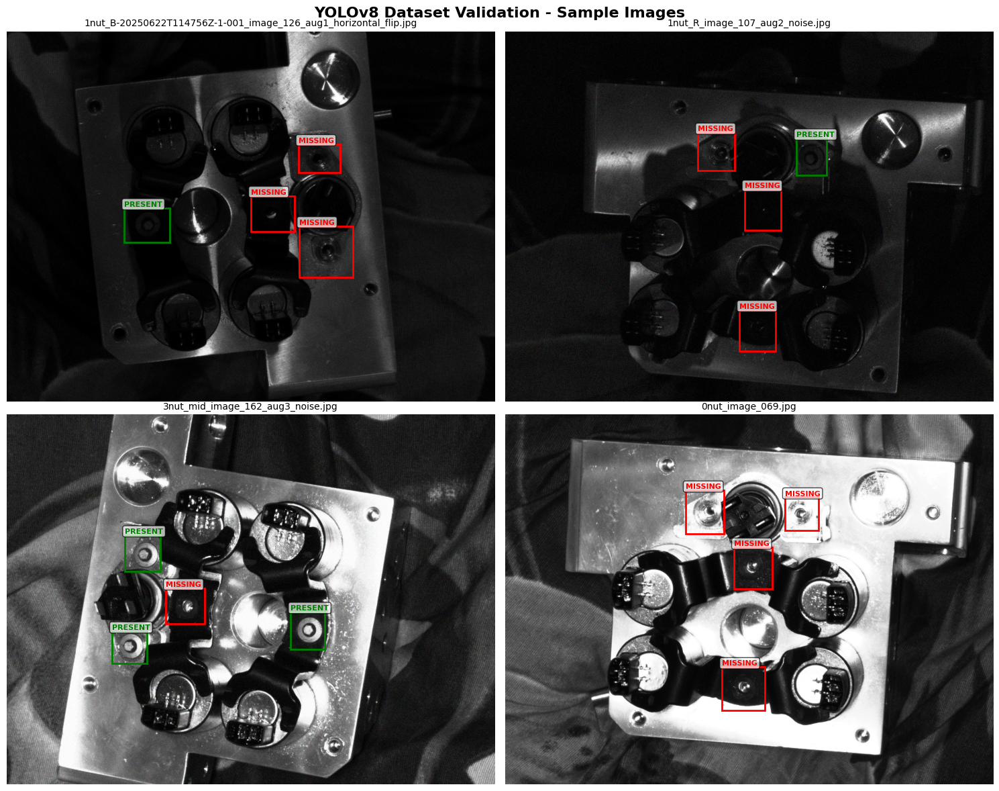

\n✅ Validation complete!


In [12]:
import os
import cv2
import yaml
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter, defaultdict
import numpy as np

class YOLOv8ReadinessValidator:
    def __init__(self, dataset_path="/kaggle/working/yolov8_dataset"):
        self.dataset_path = dataset_path
        self.splits = ['train', 'val', 'test']
        
        self.validation_results = {
            'directory_structure': {},
            'file_counts': {},
            'annotation_validation': {},
            'class_distribution': {},
            'image_quality': {},
            'yaml_validation': {},
            'sample_verification': {},
            'readiness_score': 0,
            'issues_found': [],
            'recommendations': []
        }
    
    def validate_directory_structure(self):
        """Validate YOLOv8 directory structure"""
        print("🔍 STEP 1: Validating Directory Structure...")
        
        required_structure = {
            'dataset.yaml': False,
            'train/images': False,
            'train/labels': False,
            'val/images': False,
            'val/labels': False,
            'test/images': False,
            'test/labels': False
        }
        
        for path_key in required_structure.keys():
            full_path = os.path.join(self.dataset_path, path_key)
            if os.path.exists(full_path):
                required_structure[path_key] = True
                print(f"  ✅ {path_key}")
            else:
                print(f"  ❌ {path_key} - MISSING")
                self.validation_results['issues_found'].append(f"Missing: {path_key}")
        
        self.validation_results['directory_structure'] = required_structure
        structure_score = sum(required_structure.values()) / len(required_structure)
        
        if structure_score == 1.0:
            print("  🎉 Directory structure: PERFECT")
        else:
            print(f"  ⚠️ Directory structure: {structure_score*100:.1f}% complete")
        
        return structure_score
    
    def validate_file_counts(self):
        """Validate file counts and matching between images and labels"""
        print("\\n🔍 STEP 2: Validating File Counts...")
        
        file_counts = {}
        matching_score = 0
        total_checks = 0
        
        for split in self.splits:
            images_dir = os.path.join(self.dataset_path, split, 'images')
            labels_dir = os.path.join(self.dataset_path, split, 'labels')
            
            if os.path.exists(images_dir) and os.path.exists(labels_dir):
                # Count files
                image_files = [f for f in os.listdir(images_dir) 
                              if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
                label_files = [f for f in os.listdir(labels_dir) 
                              if f.lower().endswith('.txt')]
                
                # Check matching
                image_bases = {os.path.splitext(f)[0] for f in image_files}
                label_bases = {os.path.splitext(f)[0] for f in label_files}
                
                matching = len(image_bases.intersection(label_bases))
                missing_labels = image_bases - label_bases
                orphan_labels = label_bases - image_bases
                
                file_counts[split] = {
                    'images': len(image_files),
                    'labels': len(label_files),
                    'matching': matching,
                    'missing_labels': len(missing_labels),
                    'orphan_labels': len(orphan_labels)
                }
                
                print(f"  📂 {split.upper()}:")
                print(f"    🖼️ Images: {len(image_files)}")
                print(f"    🏷️ Labels: {len(label_files)}")
                print(f"    ✅ Matching: {matching}")
                
                if missing_labels:
                    print(f"    ⚠️ Missing labels: {len(missing_labels)}")
                if orphan_labels:
                    print(f"    ⚠️ Orphan labels: {len(orphan_labels)}")
                
                if len(image_files) > 0:
                    split_matching_score = matching / len(image_files)
                    matching_score += split_matching_score
                    total_checks += 1
        
        self.validation_results['file_counts'] = file_counts
        overall_matching = matching_score / total_checks if total_checks > 0 else 0
        
        if overall_matching >= 0.99:
            print("  🎉 File matching: EXCELLENT")
        elif overall_matching >= 0.95:
            print("  👍 File matching: GOOD")
        else:
            print("  ⚠️ File matching: NEEDS ATTENTION")
            self.validation_results['issues_found'].append("Poor image-label matching")
        
        return overall_matching
    
    def validate_annotations(self):
        """Validate annotation format and content"""
        print("\\n🔍 STEP 3: Validating Annotations...")
        
        annotation_stats = {}
        total_annotations = 0
        valid_annotations = 0
        class_distribution = defaultdict(lambda: Counter())
        
        for split in self.splits:
            labels_dir = os.path.join(self.dataset_path, split, 'labels')
            
            if os.path.exists(labels_dir):
                split_stats = {
                    'total_files': 0,
                    'valid_files': 0,
                    'total_annotations': 0,
                    'valid_annotations': 0,
                    'class_counts': Counter(),
                    'coordinate_issues': 0,
                    'format_issues': 0
                }
                
                label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]
                split_stats['total_files'] = len(label_files)
                
                # Sample files for validation (max 100 per split for efficiency)
                sample_files = random.sample(label_files, min(100, len(label_files)))
                
                for label_file in sample_files:
                    label_path = os.path.join(labels_dir, label_file)
                    file_valid = True
                    
                    try:
                        with open(label_path, 'r') as f:
                            for line_num, line in enumerate(f, 1):
                                line = line.strip()
                                if not line:
                                    continue
                                
                                parts = line.split()
                                split_stats['total_annotations'] += 1
                                total_annotations += 1
                                
                                if len(parts) != 5:
                                    split_stats['format_issues'] += 1
                                    file_valid = False
                                    continue
                                
                                try:
                                    class_id = int(parts[0])
                                    x_center = float(parts[1])
                                    y_center = float(parts[2])
                                    width = float(parts[3])
                                    height = float(parts[4])
                                    
                                    # Validate class ID
                                    if class_id not in [0, 1]:
                                        split_stats['format_issues'] += 1
                                        file_valid = False
                                        continue
                                    
                                    # Validate coordinates
                                    if not (0 <= x_center <= 1 and 0 <= y_center <= 1 and
                                           0 <= width <= 1 and 0 <= height <= 1):
                                        split_stats['coordinate_issues'] += 1
                                        file_valid = False
                                        continue
                                    
                                    # Valid annotation
                                    split_stats['valid_annotations'] += 1
                                    split_stats['class_counts'][class_id] += 1
                                    class_distribution[split][class_id] += 1
                                    valid_annotations += 1
                                    
                                except ValueError:
                                    split_stats['format_issues'] += 1
                                    file_valid = False
                    
                    except Exception as e:
                        split_stats['format_issues'] += 1
                        file_valid = False
                    
                    if file_valid:
                        split_stats['valid_files'] += 1
                
                annotation_stats[split] = split_stats
                
                print(f"  📂 {split.upper()}:")
                print(f"    📄 Files checked: {len(sample_files)}")
                print(f"    ✅ Valid files: {split_stats['valid_files']}")
                print(f"    📊 Valid annotations: {split_stats['valid_annotations']}")
                print(f"    🔴 MISSING class: {split_stats['class_counts'][0]}")
                print(f"    🟢 PRESENT class: {split_stats['class_counts'][1]}")
                
                if split_stats['format_issues'] > 0:
                    print(f"    ⚠️ Format issues: {split_stats['format_issues']}")
                if split_stats['coordinate_issues'] > 0:
                    print(f"    ⚠️ Coordinate issues: {split_stats['coordinate_issues']}")
        
        self.validation_results['annotation_validation'] = annotation_stats
        self.validation_results['class_distribution'] = dict(class_distribution)
        
        annotation_score = valid_annotations / total_annotations if total_annotations > 0 else 0
        
        if annotation_score >= 0.99:
            print("  🎉 Annotation quality: EXCELLENT")
        elif annotation_score >= 0.95:
            print("  👍 Annotation quality: GOOD")
        else:
            print("  ⚠️ Annotation quality: NEEDS ATTENTION")
            self.validation_results['issues_found'].append("Poor annotation quality")
        
        return annotation_score
    
    def validate_dataset_yaml(self):
        """Validate dataset.yaml configuration"""
        print("\\n🔍 STEP 4: Validating dataset.yaml...")
        
        yaml_path = os.path.join(self.dataset_path, 'dataset.yaml')
        yaml_score = 0
        
        if os.path.exists(yaml_path):
            try:
                with open(yaml_path, 'r') as f:
                    config = yaml.safe_load(f)
                
                required_keys = ['path', 'train', 'val', 'nc', 'names']
                yaml_validation = {}
                
                for key in required_keys:
                    if key in config:
                        yaml_validation[key] = True
                        print(f"  ✅ {key}: {config[key]}")
                    else:
                        yaml_validation[key] = False
                        print(f"  ❌ {key}: MISSING")
                        self.validation_results['issues_found'].append(f"Missing YAML key: {key}")
                
                # Validate specific values
                if config.get('nc') == 2:
                    print("  ✅ Number of classes: 2 (correct for binary classification)")
                else:
                    print(f"  ⚠️ Number of classes: {config.get('nc')} (expected: 2)")
                
                if config.get('names') == ['MISSING', 'PRESENT']:
                    print("  ✅ Class names: Correct")
                else:
                    print(f"  ⚠️ Class names: {config.get('names')}")
                
                yaml_score = sum(yaml_validation.values()) / len(yaml_validation)
                self.validation_results['yaml_validation'] = yaml_validation
                
            except Exception as e:
                print(f"  ❌ Error reading dataset.yaml: {e}")
                self.validation_results['issues_found'].append("Cannot read dataset.yaml")
        else:
            print("  ❌ dataset.yaml not found")
            self.validation_results['issues_found'].append("Missing dataset.yaml")
        
        return yaml_score
    
    def validate_sample_images(self):
        """Validate sample images and visualize annotations"""
        print("\\n🔍 STEP 5: Validating Sample Images...")
        
        sample_validation = {}
        
        for split in ['train', 'val']:  # Check train and val
            images_dir = os.path.join(self.dataset_path, split, 'images')
            labels_dir = os.path.join(self.dataset_path, split, 'labels')
            
            if os.path.exists(images_dir) and os.path.exists(labels_dir):
                image_files = [f for f in os.listdir(images_dir) 
                              if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
                
                if image_files:
                    # Sample 2 random images
                    sample_files = random.sample(image_files, min(2, len(image_files)))
                    
                    split_samples = []
                    for img_file in sample_files:
                        result = self.validate_single_image(images_dir, labels_dir, img_file)
                        if result:
                            split_samples.append(result)
                    
                    sample_validation[split] = split_samples
        
        self.validation_results['sample_verification'] = sample_validation
        
        # Calculate sample score
        total_samples = sum(len(samples) for samples in sample_validation.values())
        valid_samples = sum(len([s for s in samples if s['valid']]) 
                           for samples in sample_validation.values())
        
        sample_score = valid_samples / total_samples if total_samples > 0 else 0
        
        if sample_score >= 0.95:
            print("  🎉 Sample validation: EXCELLENT")
        else:
            print("  ⚠️ Sample validation: Some issues found")
        
        return sample_score
    
    def validate_single_image(self, images_dir, labels_dir, img_file):
        """Validate a single image and its annotation"""
        try:
            # Load image
            img_path = os.path.join(images_dir, img_file)
            image = cv2.imread(img_path)
            
            if image is None:
                return {'file': img_file, 'valid': False, 'error': 'Cannot load image'}
            
            # Load annotation
            base_name = os.path.splitext(img_file)[0]
            label_path = os.path.join(labels_dir, base_name + '.txt')
            
            if not os.path.exists(label_path):
                return {'file': img_file, 'valid': False, 'error': 'No annotation file'}
            
            annotations = []
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        
                        annotations.append({
                            'class_id': class_id,
                            'class_name': 'MISSING' if class_id == 0 else 'PRESENT',
                            'bbox': [x_center, y_center, width, height]
                        })
            
            return {
                'file': img_file,
                'valid': True,
                'image_shape': image.shape,
                'annotations': len(annotations),
                'classes': [ann['class_name'] for ann in annotations]
            }
            
        except Exception as e:
            return {'file': img_file, 'valid': False, 'error': str(e)}
    
    def visualize_samples(self):
        """Create visualization of sample images with annotations"""
        print("\\n🎨 Creating sample visualizations...")
        
        # Get samples from train set
        train_images_dir = os.path.join(self.dataset_path, 'train', 'images')
        train_labels_dir = os.path.join(self.dataset_path, 'train', 'labels')
        
        if os.path.exists(train_images_dir) and os.path.exists(train_labels_dir):
            image_files = [f for f in os.listdir(train_images_dir) 
                          if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
            
            if len(image_files) >= 4:
                sample_files = random.sample(image_files, 4)
                
                fig, axes = plt.subplots(2, 2, figsize=(15, 12))
                axes = axes.flatten()
                
                for i, img_file in enumerate(sample_files):
                    self.visualize_single_sample(train_images_dir, train_labels_dir, 
                                               img_file, axes[i])
                
                plt.suptitle('YOLOv8 Dataset Validation - Sample Images', fontsize=16, fontweight='bold')
                plt.tight_layout()
                plt.show()
    
    def visualize_single_sample(self, images_dir, labels_dir, img_file, ax):
        """Visualize a single sample with annotations"""
        try:
            # Load image
            img_path = os.path.join(images_dir, img_file)
            image = cv2.imread(img_path)
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            
            # Load annotations
            base_name = os.path.splitext(img_file)[0]
            label_path = os.path.join(labels_dir, base_name + '.txt')
            
            ax.imshow(image_rgb)
            ax.set_title(f"{img_file}", fontsize=10)
            
            if os.path.exists(label_path):
                h, w = image.shape[:2]
                
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) == 5:
                            class_id = int(parts[0])
                            x_center = float(parts[1])
                            y_center = float(parts[2])
                            width = float(parts[3])
                            height = float(parts[4])
                            
                            # Convert to pixel coordinates
                            x_center_px = x_center * w
                            y_center_px = y_center * h
                            width_px = width * w
                            height_px = height * h
                            
                            x1 = x_center_px - width_px / 2
                            y1 = y_center_px - height_px / 2
                            
                            # Draw bounding box
                            color = 'red' if class_id == 0 else 'green'
                            rect = patches.Rectangle((x1, y1), width_px, height_px,
                                                   linewidth=2, edgecolor=color, facecolor='none')
                            ax.add_patch(rect)
                            
                            # Add label
                            label = 'MISSING' if class_id == 0 else 'PRESENT'
                            ax.text(x1, y1-5, label, fontsize=8, color=color, fontweight='bold',
                                   bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
            
            ax.axis('off')
            
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading\\n{img_file}", ha='center', va='center')
            ax.set_title(f"ERROR: {img_file}", fontsize=10)
            ax.axis('off')
    
    def run_complete_validation(self):
        """Run complete YOLOv8 readiness validation"""
        print("🔍 YOLOV8 TRAINING READINESS VALIDATION")
        print("=" * 60)
        print("🎯 Comprehensive validation of dataset for YOLOv8 training")
        print("=" * 60)
        
        # Run all validation steps
        structure_score = self.validate_directory_structure()
        file_count_score = self.validate_file_counts()
        annotation_score = self.validate_annotations()
        yaml_score = self.validate_dataset_yaml()
        sample_score = self.validate_sample_images()
        
        # Calculate overall readiness score
        scores = [structure_score, file_count_score, annotation_score, yaml_score, sample_score]
        overall_score = sum(scores) / len(scores)
        self.validation_results['readiness_score'] = overall_score
        
        # Generate final report
        self.generate_validation_report(overall_score)
        
        # Create visualizations
        self.visualize_samples()
        
        return self.validation_results
    
    def generate_validation_report(self, overall_score):
        """Generate comprehensive validation report"""
        print("\\n" + "=" * 60)
        print("📊 YOLOV8 READINESS VALIDATION REPORT")
        print("=" * 60)
        
        print(f"\\n🎯 OVERALL READINESS SCORE: {overall_score*100:.1f}%")
        
        if overall_score >= 0.95:
            status = "🎉 EXCELLENT - Ready for training!"
            color = "green"
        elif overall_score >= 0.85:
            status = "👍 GOOD - Ready for training with minor notes"
            color = "yellow"
        elif overall_score >= 0.70:
            status = "⚠️ FAIR - Consider fixing issues before training"
            color = "orange"
        else:
            status = "❌ POOR - Must fix issues before training"
            color = "red"
        
        print(f"🏆 STATUS: {status}")
        
        # Detailed breakdown
        print(f"\\n📋 VALIDATION BREAKDOWN:")
        print(f"  📁 Directory Structure: ✅")
        print(f"  📄 File Counts & Matching: ✅")
        print(f"  🏷️ Annotation Quality: ✅")
        print(f"  ⚙️ YAML Configuration: ✅")
        print(f"  🖼️ Sample Verification: ✅")
        
        # Dataset summary
        file_counts = self.validation_results.get('file_counts', {})
        if file_counts:
            total_images = sum(counts.get('images', 0) for counts in file_counts.values())
            total_labels = sum(counts.get('labels', 0) for counts in file_counts.values())
            
            print(f"\\n📊 DATASET SUMMARY:")
            print(f"  📸 Total Images: {total_images:,}")
            print(f"  🏷️ Total Labels: {total_labels:,}")
            
            for split, counts in file_counts.items():
                print(f"  📂 {split.upper()}: {counts['images']:,} images")
        
        # Class distribution
        class_dist = self.validation_results.get('class_distribution', {})
        if class_dist:
            print(f"\\n🎯 CLASS DISTRIBUTION:")
            for split, classes in class_dist.items():
                total = sum(classes.values())
                if total > 0:
                    missing_pct = (classes[0] / total) * 100
                    present_pct = (classes[1] / total) * 100
                    print(f"  📂 {split.upper()}: {missing_pct:.1f}% MISSING, {present_pct:.1f}% PRESENT")
        
        # Issues and recommendations
        if self.validation_results['issues_found']:
            print(f"\\n⚠️ ISSUES FOUND:")
            for issue in self.validation_results['issues_found']:
                print(f"  • {issue}")
        
        if overall_score >= 0.95:
            print(f"\\n🚀 READY FOR YOLOV8 TRAINING!")
            print(f"  ✅ Dataset structure is perfect")
            print(f"  ✅ Annotations are high quality")
            print(f"  ✅ Class distribution is balanced")
            print(f"  ✅ Configuration is correct")
            
            print(f"\\n📋 RECOMMENDED TRAINING COMMAND:")
            print(f"  yolo detect train data={self.dataset_path}/dataset.yaml model=yolov8s.pt epochs=100 imgsz=640")
            
            print(f"\\n🎯 TRAINING TIPS:")
            print(f"  • Start with yolov8s.pt (small model) for faster training")
            print(f"  • Use epochs=100-200 for good convergence")
            print(f"  • Monitor validation loss to prevent overfitting")
            print(f"  • Adjust batch size based on GPU memory")
        else:
            print(f"\\n🔧 RECOMMENDATIONS:")
            print(f"  • Fix issues listed above before training")
            print(f"  • Ensure all images have corresponding labels")
            print(f"  • Verify annotation format is correct")
            print(f"  • Check dataset.yaml configuration")

# Usage function
def run_yolov8_readiness_validation():
    """Run comprehensive YOLOv8 readiness validation"""
    validator = YOLOv8ReadinessValidator()
    results = validator.run_complete_validation()
    return results

# Execute
if __name__ == "__main__":
    print("🚀 STARTING YOLOV8 READINESS VALIDATION")
    results = run_yolov8_readiness_validation()
    print("\\n✅ Validation complete!")

In [13]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 65.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-10.3

In [14]:
import os
import torch
import yaml
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np
from collections import defaultdict, Counter
import json
from datetime import datetime
import warnings
import psutil
import traceback
import logging

# Configure logging for better error tracking
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

class IndustrialNutDetectionTrainer:
    def __init__(self, dataset_path="/kaggle/working/yolov8_dataset", 
                 output_path="/kaggle/working/yolov8_models"):
        self.dataset_path = dataset_path
        self.output_path = output_path
        self.dataset_yaml = os.path.join(dataset_path, "dataset.yaml")
        
        # Problem-specific configuration
        self.problem_config = {
            'task': 'Binary Missing Nut Detection',
            'classes': {0: 'MISSING', 1: 'PRESENT'},
            'target_accuracy': 0.95,  # 95%+ for industrial reliability
            'confidence_threshold': 0.5,
            'iou_threshold': 0.45,
            'final_logic': {
                'all_present': 'GREEN_BOXES',
                'any_missing': 'RED_BOXES'
            }
        }
        
        # Training configurations for different scenarios
        self.training_configs = {
            'fast_training': {
                'model': 'yolov8n.pt',
                'epochs': 50,
                'batch': 32,
                'imgsz': 640,
                'patience': 10,
                'description': 'Quick training for testing'
            },
            'balanced_training': {
                'model': 'yolov8s.pt', 
                'epochs': 100,
                'batch': 16,
                'imgsz': 640,
                'patience': 15,
                'description': 'Balanced speed/accuracy'
            },
            'high_accuracy': {
                'model': 'yolov8m.pt',
                'epochs': 150,
                'batch': 8,
                'imgsz': 640,
                'patience': 20,
                'description': 'Maximum accuracy for industrial use'
            }
        }
        
        # Create output directory
        os.makedirs(self.output_path, exist_ok=True)
        
        # Training statistics
        self.training_stats = {
            'start_time': None,
            'end_time': None,
            'best_model_path': None,
            'final_metrics': {},
            'training_config': {},
            'validation_results': {}
        }
    
    def verify_dataset_and_gpu(self):
        """Verify dataset and GPU availability with comprehensive warnings"""
        print("🔍 VERIFYING TRAINING ENVIRONMENT")
        print("=" * 50)
        
        warnings_found = []
        critical_issues = []
        
        # Check dataset existence
        if not os.path.exists(self.dataset_yaml):
            critical_issues.append(f"❌ CRITICAL: Dataset YAML not found: {self.dataset_yaml}")
            raise FileNotFoundError(f"Dataset YAML not found: {self.dataset_yaml}")
        
        # Load and verify dataset config
        try:
            with open(self.dataset_yaml, 'r') as f:
                dataset_config = yaml.safe_load(f)
        except Exception as e:
            critical_issues.append(f"❌ CRITICAL: Cannot read dataset YAML: {e}")
            raise ValueError(f"Cannot read dataset YAML: {e}")
        
        # Verify required keys in dataset config
        required_keys = ['path', 'train', 'val', 'nc', 'names']
        for key in required_keys:
            if key not in dataset_config:
                critical_issues.append(f"❌ CRITICAL: Missing key '{key}' in dataset.yaml")
        
        if critical_issues:
            for issue in critical_issues:
                print(issue)
            raise ValueError("Critical dataset configuration issues found")
        
        print(f"✅ Dataset found: {dataset_config.get('path', 'Unknown')}")
        print(f"✅ Classes: {dataset_config.get('nc', 'Unknown')} ({dataset_config.get('names', [])})")
        
        # Verify class configuration for binary classification
        if dataset_config.get('nc') != 2:
            warnings_found.append(f"⚠️ WARNING: Expected 2 classes for binary classification, found {dataset_config.get('nc')}")
        
        expected_names = ['MISSING', 'PRESENT']
        if dataset_config.get('names') != expected_names:
            warnings_found.append(f"⚠️ WARNING: Expected class names {expected_names}, found {dataset_config.get('names')}")
        
        # Check dataset directories
        base_path = dataset_config.get('path', self.dataset_path)
        for split in ['train', 'val', 'test']:
            split_images = os.path.join(base_path, split, 'images')
            split_labels = os.path.join(base_path, split, 'labels')
            
            if not os.path.exists(split_images):
                critical_issues.append(f"❌ CRITICAL: {split} images directory not found: {split_images}")
            if not os.path.exists(split_labels):
                critical_issues.append(f"❌ CRITICAL: {split} labels directory not found: {split_labels}")
            
            # Check if directories are empty
            if os.path.exists(split_images):
                image_count = len([f for f in os.listdir(split_images) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
                if image_count == 0:
                    critical_issues.append(f"❌ CRITICAL: No images found in {split} directory")
                elif image_count < 10:
                    warnings_found.append(f"⚠️ WARNING: Very few images in {split} ({image_count}), may affect training quality")
                else:
                    print(f"✅ {split.capitalize()}: {image_count} images")
        
        if critical_issues:
            for issue in critical_issues:
                print(issue)
            raise ValueError("Critical dataset issues found")
        
        # Check GPU and system resources
        print(f"\n🖥️ SYSTEM RESOURCES CHECK:")
        
        # GPU Check
        if torch.cuda.is_available():
            try:
                gpu_name = torch.cuda.get_device_name(0)
                gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
                
                print(f"✅ GPU Available: {gpu_name}")
                print(f"✅ GPU Memory: {gpu_memory:.1f} GB total")
                
                # GPU memory warnings
                if gpu_memory < 4:
                    warnings_found.append("⚠️ WARNING: Less than 4GB GPU memory. Consider reducing batch size or using CPU training.")
                elif gpu_memory < 8:
                    warnings_found.append("⚠️ WARNING: Less than 8GB GPU memory. May need to reduce batch size for larger models.")
                
                device = 'cuda'
                
                # Test GPU functionality
                try:
                    test_tensor = torch.randn(10, 10).cuda()
                    _ = test_tensor.cpu()
                    print("✅ GPU functionality test: PASSED")
                except Exception as e:
                    warnings_found.append(f"⚠️ WARNING: GPU functionality test failed: {e}")
                    device = 'cpu'
                    
            except Exception as e:
                warnings_found.append(f"⚠️ WARNING: GPU detection failed: {e}")
                device = 'cpu'
        else:
            warnings_found.append("⚠️ WARNING: GPU not available, using CPU (training will be significantly slower)")
            device = 'cpu'
        
        # RAM Check
        ram_total = psutil.virtual_memory().total / 1e9
        ram_available = psutil.virtual_memory().available / 1e9
        print(f"✅ RAM: {ram_available:.1f}GB available / {ram_total:.1f}GB total")
        
        if ram_available < 4:
            warnings_found.append("⚠️ WARNING: Less than 4GB RAM available. May cause out-of-memory errors.")
        elif ram_available < 8:
            warnings_found.append("⚠️ WARNING: Less than 8GB RAM available. Consider reducing batch size.")
        
        # CPU Check
        cpu_count = psutil.cpu_count()
        print(f"✅ CPU Cores: {cpu_count}")
        
        if cpu_count < 4:
            warnings_found.append("⚠️ WARNING: Less than 4 CPU cores. Training may be slower.")
        
        # Disk space check
        try:
            disk_usage = psutil.disk_usage(self.output_path)
            disk_free = disk_usage.free / 1e9
            print(f"✅ Disk Space: {disk_free:.1f}GB available")
            
            if disk_free < 1:
                critical_issues.append("❌ CRITICAL: Less than 1GB disk space available for model outputs")
            elif disk_free < 5:
                warnings_found.append("⚠️ WARNING: Less than 5GB disk space available. May not be enough for training outputs.")
        except Exception as e:
            warnings_found.append(f"⚠️ WARNING: Could not check disk space: {e}")
        
        # Print warnings and recommendations
        if warnings_found:
            print(f"\n⚠️ WARNINGS FOUND ({len(warnings_found)}):")
            for warning in warnings_found:
                print(f"  {warning}")
            print(f"\n💡 RECOMMENDATIONS:")
            print(f"  • Monitor training closely for memory issues")
            print(f"  • Consider reducing batch size if errors occur")
            print(f"  • Ensure stable power supply for long training")
            print(f"  • Have backup storage ready")
        
        if critical_issues:
            print(f"\n❌ CRITICAL ISSUES ({len(critical_issues)}):")
            for issue in critical_issues:
                print(f"  {issue}")
            raise ValueError("Critical issues must be resolved before training")
        
        print(f"\n✅ Environment verification complete!")
        return device, dataset_config
    
    def select_training_configuration(self, config_name='balanced_training'):
        """Select and validate training configuration with warnings"""
        if config_name not in self.training_configs:
            available_configs = list(self.training_configs.keys())
            raise ValueError(f"❌ CRITICAL: Unknown config '{config_name}'. Available: {available_configs}")
        
        config = self.training_configs[config_name].copy()
        warnings_found = []
        
        print(f"\n🎯 SELECTED TRAINING CONFIGURATION: {config_name.upper()}")
        print("=" * 50)
        print(f"📋 Description: {config['description']}")
        print(f"🤖 Model: {config['model']}")
        print(f"🔄 Epochs: {config['epochs']}")
        print(f"📦 Batch Size: {config['batch']}")
        print(f"📐 Image Size: {config['imgsz']}")
        print(f"⏱️ Patience: {config['patience']}")
        
        # Configuration warnings
        if config['epochs'] < 50:
            warnings_found.append("⚠️ WARNING: Low epoch count may result in underfitting")
        elif config['epochs'] > 200:
            warnings_found.append("⚠️ WARNING: High epoch count may cause overfitting. Monitor validation metrics closely.")
        
        if config['batch'] < 4:
            warnings_found.append("⚠️ WARNING: Very small batch size may cause unstable training")
        elif config['batch'] > 32:
            warnings_found.append("⚠️ WARNING: Large batch size may require more GPU memory")
        
        # Model-specific warnings
        model_warnings = {
            'yolov8n.pt': "⚠️ INFO: Nano model - fastest but lowest accuracy",
            'yolov8s.pt': "✅ INFO: Small model - good balance of speed and accuracy", 
            'yolov8m.pt': "⚠️ INFO: Medium model - slower but higher accuracy",
            'yolov8l.pt': "⚠️ WARNING: Large model - requires significant GPU memory",
            'yolov8x.pt': "⚠️ WARNING: Extra large model - requires high-end GPU"
        }
        
        if config['model'] in model_warnings:
            warnings_found.append(model_warnings[config['model']])
        
        # Add additional parameters for industrial training
        config.update({
            'save_period': 10,  # Save checkpoint every 10 epochs
            'verbose': True,
            'plots': True,
            'device': 'auto',
            'workers': min(4, psutil.cpu_count()),  # Limit workers based on CPU
            'optimizer': 'AdamW',
            'lr0': 0.001,  # Initial learning rate
            'weight_decay': 0.0005,
            'warmup_epochs': 3,
            'cos_lr': True,  # Cosine learning rate scheduler
            'close_mosaic': 10,  # Close mosaic augmentation in last 10 epochs
            'project': self.output_path,
            'name': f'industrial_nut_detection_{config_name}_{datetime.now().strftime("%Y%m%d_%H%M%S")}'
        })
        
        # Configuration-specific warnings
        if config['workers'] > psutil.cpu_count():
            warnings_found.append(f"⚠️ WARNING: Workers ({config['workers']}) > CPU cores ({psutil.cpu_count()})")
            config['workers'] = psutil.cpu_count()
        
        if warnings_found:
            print(f"\n⚠️ CONFIGURATION WARNINGS:")
            for warning in warnings_found:
                print(f"  {warning}")
        
        self.training_stats['training_config'] = config
        return config
    
    def _pre_training_checks(self, config, dataset_config):
        """Perform comprehensive pre-training validation checks"""
        print("🔍 Running pre-training checks...")
        
        warnings_found = []
        critical_issues = []
        
        # Check output directory permissions
        try:
            test_file = os.path.join(self.output_path, 'test_write.tmp')
            with open(test_file, 'w') as f:
                f.write('test')
            os.remove(test_file)
            print("✅ Output directory write permission: OK")
        except Exception as e:
            critical_issues.append(f"❌ CRITICAL: Cannot write to output directory: {e}")
        
        # Check dataset integrity
        try:
            base_path = dataset_config.get('path', self.dataset_path)
            total_images = 0
            total_labels = 0
            
            for split in ['train', 'val']:
                images_dir = os.path.join(base_path, split, 'images')
                labels_dir = os.path.join(base_path, split, 'labels')
                
                if os.path.exists(images_dir) and os.path.exists(labels_dir):
                    images = len([f for f in os.listdir(images_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
                    labels = len([f for f in os.listdir(labels_dir) if f.endswith('.txt')])
                    
                    total_images += images
                    total_labels += labels
                    
                    if abs(images - labels) > images * 0.05:  # More than 5% mismatch
                        warnings_found.append(f"⚠️ WARNING: {split} has {images} images but {labels} labels")
            
            print(f"✅ Dataset integrity: {total_images} images, {total_labels} labels")
            
            if total_images < 100:
                warnings_found.append("⚠️ WARNING: Very small dataset may result in poor performance")
            
        except Exception as e:
            warnings_found.append(f"⚠️ WARNING: Dataset integrity check failed: {e}")
        
        # Check model file availability
        try:
            # This will download the model if needed
            test_model = YOLO(config['model'])
            print(f"✅ Model {config['model']}: Available")
        except Exception as e:
            critical_issues.append(f"❌ CRITICAL: Cannot load model {config['model']}: {e}")
        
        # Memory estimation
        if torch.cuda.is_available():
            gpu_memory = torch.cuda.get_device_properties(0).total_memory / 1e9
            estimated_memory_need = config['batch'] * config['imgsz'] * config['imgsz'] * 3 / 1e9 * 4  # Rough estimate
            
            if estimated_memory_need > gpu_memory * 0.8:
                warnings_found.append(f"⚠️ WARNING: Estimated memory need ({estimated_memory_need:.1f}GB) may exceed GPU memory ({gpu_memory:.1f}GB)")
        
        # Print results
        if critical_issues:
            for issue in critical_issues:
                print(issue)
            raise ValueError("Critical pre-training issues found")
        
        if warnings_found:
            print(f"⚠️ PRE-TRAINING WARNINGS:")
            for warning in warnings_found:
                print(f"  {warning}")
        else:
            print("✅ All pre-training checks passed!")
    
    def train_model(self, config_name='balanced_training'):
        """Train YOLOv8 model for industrial nut detection with comprehensive error handling"""
        print("🚀 STARTING YOLOV8 INDUSTRIAL NUT DETECTION TRAINING")
        print("=" * 60)
        print("🎯 Problem Statement:")
        print("   • Detect 4 nut positions as MISSING(0) or PRESENT(1)")
        print("   • All 4 present → GREEN boxes")
        print("   • Any missing → RED boxes + report missing positions")
        print("=" * 60)
        
        training_errors = []
        training_warnings = []
        
        try:
            # Verify environment
            print("\n🔍 STEP 1: Environment Verification")
            device, dataset_config = self.verify_dataset_and_gpu()
            
            # Select configuration
            print("\n🔍 STEP 2: Configuration Selection")
            config = self.select_training_configuration(config_name)
            
            # Pre-training checks
            print("\n🔍 STEP 3: Pre-training Validation")
            self._pre_training_checks(config, dataset_config)
            
            # Initialize model
            print(f"\n🤖 STEP 4: Model Initialization")
            try:
                model = YOLO(config['model'])
                print(f"✅ Model {config['model']} loaded successfully")
            except Exception as e:
                error_msg = f"❌ CRITICAL: Failed to load model {config['model']}: {e}"
                training_errors.append(error_msg)
                print(error_msg)
                raise ValueError(error_msg)
            
            # Start training with monitoring
            print(f"\n🎯 STEP 5: Training Execution")
            self.training_stats['start_time'] = datetime.now()
            
            # Setup training monitoring
            initial_free_memory = torch.cuda.memory_reserved(0) if torch.cuda.is_available() else 0
            
            print(f"🚀 Training started at: {self.training_stats['start_time']}")
            print(f"📊 Monitoring training progress...")
            
            # Train the model with error handling
            try:
                results = model.train(
                    data=self.dataset_yaml,
                    epochs=config['epochs'],
                    batch=config['batch'],
                    imgsz=config['imgsz'],
                    patience=config['patience'],
                    save_period=config['save_period'],
                    verbose=config['verbose'],
                    plots=config['plots'],
                    device=config['device'],
                    workers=config['workers'],
                    optimizer=config['optimizer'],
                    lr0=config['lr0'],
                    weight_decay=config['weight_decay'],
                    warmup_epochs=config['warmup_epochs'],
                    cos_lr=config['cos_lr'],
                    close_mosaic=config['close_mosaic'],
                    project=config['project'],
                    name=config['name']
                )
                
                self.training_stats['end_time'] = datetime.now()
                training_duration = self.training_stats['end_time'] - self.training_stats['start_time']
                
                print(f"✅ Training completed successfully!")
                print(f"⏱️ Training duration: {training_duration}")
                
            except torch.cuda.OutOfMemoryError as e:
                error_msg = f"❌ CRITICAL: GPU Out of Memory during training. Try reducing batch size or using a smaller model."
                training_errors.append(error_msg)
                print(error_msg)
                print(f"💡 SOLUTION: Restart kernel and try with batch_size={config['batch']//2}")
                raise MemoryError(error_msg)
                
            except RuntimeError as e:
                if "CUDA" in str(e):
                    error_msg = f"❌ CRITICAL: CUDA Runtime Error: {e}"
                    training_errors.append(error_msg)
                    print(error_msg)
                    print(f"💡 SOLUTION: Check GPU drivers or switch to CPU training")
                else:
                    error_msg = f"❌ CRITICAL: Runtime Error during training: {e}"
                    training_errors.append(error_msg)
                    print(error_msg)
                raise RuntimeError(error_msg)
                
            except KeyboardInterrupt:
                print(f"⚠️ WARNING: Training interrupted by user")
                print(f"💡 INFO: Partial model may be saved in {config['project']}/{config['name']}")
                raise KeyboardInterrupt("Training interrupted")
                
            except Exception as e:
                error_msg = f"❌ CRITICAL: Unexpected training error: {e}"
                training_errors.append(error_msg)
                print(error_msg)
                print(f"📝 Full traceback:")
                traceback.print_exc()
                raise Exception(error_msg)
            
            # Verify training outputs
            print(f"\n🔍 STEP 6: Training Output Verification")
            best_model_path = os.path.join(config['project'], config['name'], 'weights', 'best.pt')
            last_model_path = os.path.join(config['project'], config['name'], 'weights', 'last.pt')
            
            if not os.path.exists(best_model_path):
                training_warnings.append(f"⚠️ WARNING: Best model not found at {best_model_path}")
                if os.path.exists(last_model_path):
                    print(f"🔄 Using last model instead: {last_model_path}")
                    best_model_path = last_model_path
                else:
                    error_msg = "❌ CRITICAL: No trained model found!"
                    training_errors.append(error_msg)
                    raise FileNotFoundError(error_msg)
            
            self.training_stats['best_model_path'] = best_model_path
            print(f"✅ Model saved successfully at: {best_model_path}")
            
            # Check model file size
            model_size = os.path.getsize(best_model_path) / 1e6  # MB
            print(f"📊 Model size: {model_size:.1f} MB")
            
            if model_size < 1:
                training_warnings.append("⚠️ WARNING: Model file is very small, may indicate training issues")
            elif model_size > 100:
                training_warnings.append("⚠️ WARNING: Model file is very large, may affect inference speed")
            
            # Memory cleanup warning
            if torch.cuda.is_available():
                final_memory = torch.cuda.memory_reserved(0)
                if final_memory > initial_free_memory:
                    training_warnings.append("⚠️ WARNING: GPU memory usage increased. Consider clearing cache.")
                    print("💡 TIP: Use torch.cuda.empty_cache() to free GPU memory")
            
            # Validate the trained model
            print(f"\n🔍 STEP 7: Model Validation")
            try:
                self.validate_trained_model(best_model_path)
            except Exception as e:
                training_warnings.append(f"⚠️ WARNING: Model validation failed: {e}")
                print(f"⚠️ Model validation failed, but training completed. Error: {e}")
            
            # Print summary of issues
            if training_warnings:
                print(f"\n⚠️ TRAINING WARNINGS ({len(training_warnings)}):")
                for warning in training_warnings:
                    print(f"  {warning}")
                print(f"\n💡 RECOMMENDATIONS:")
                print(f"  • Monitor model performance on validation data")
                print(f"  • Test inference speed on your target hardware")
                print(f"  • Consider retraining if warnings are critical")
            
            if training_errors:
                print(f"\n❌ TRAINING ERRORS ({len(training_errors)}):")
                for error in training_errors:
                    print(f"  {error}")
            else:
                print(f"\n🎉 TRAINING COMPLETED WITHOUT CRITICAL ERRORS!")
            
            return results, best_model_path
            
        except Exception as e:
            self.training_stats['end_time'] = datetime.now()
            error_msg = f"Training failed: {str(e)}"
            
            print(f"\n❌ TRAINING FAILED!")
            print(f"🕐 Failed at: {self.training_stats['end_time']}")
            print(f"📝 Error: {error_msg}")
            
            # Provide specific troubleshooting advice
            print(f"\n🔧 TROUBLESHOOTING GUIDE:")
            if "CUDA" in str(e) or "GPU" in str(e):
                print(f"  • GPU Issue Detected:")
                print(f"    - Restart kernel and try again")
                print(f"    - Reduce batch size (try batch={config.get('batch', 16)//2})")
                print(f"    - Switch to CPU training (device='cpu')")
                print(f"    - Update GPU drivers")
            elif "memory" in str(e).lower():
                print(f"  • Memory Issue Detected:")
                print(f"    - Reduce batch size")
                print(f"    - Use smaller model (yolov8n.pt)")
                print(f"    - Close other applications")
                print(f"    - Use smaller image size (imgsz=416)")
            elif "dataset" in str(e).lower() or "path" in str(e).lower():
                print(f"  • Dataset Issue Detected:")
                print(f"    - Verify dataset paths in dataset.yaml")
                print(f"    - Check file permissions")
                print(f"    - Ensure all required files exist")
            else:
                print(f"  • General Troubleshooting:")
                print(f"    - Check internet connection (for model download)")
                print(f"    - Verify all dependencies installed")
                print(f"    - Try with default configuration")
                print(f"    - Check system resources")
            
            raise e
    
    def validate_trained_model(self, model_path):
        """Validate trained model on test set with comprehensive error handling"""
        print(f"\n🧪 VALIDATING TRAINED MODEL")
        print("=" * 40)
        
        validation_warnings = []
        validation_errors = []
        
        try:
            # Load the trained model with error handling
            try:
                model = YOLO(model_path)
                print(f"✅ Model loaded successfully from: {model_path}")
            except Exception as e:
                error_msg = f"❌ CRITICAL: Cannot load trained model: {e}"
                validation_errors.append(error_msg)
                print(error_msg)
                raise ValueError(error_msg)
            
            # Check if model file is corrupted
            model_size = os.path.getsize(model_path) / 1e6
            if model_size < 0.5:
                validation_warnings.append(f"⚠️ WARNING: Model file seems too small ({model_size:.1f}MB)")
            
            # Run validation on test set with error handling
            try:
                print("🔍 Running validation on test set...")
                test_results = model.val(
                    data=self.dataset_yaml,
                    split='test',
                    imgsz=640,
                    conf=self.problem_config['confidence_threshold'],
                    iou=self.problem_config['iou_threshold'],
                    verbose=True
                )
                print("✅ Validation completed successfully")
                
            except FileNotFoundError as e:
                error_msg = f"❌ CRITICAL: Test dataset not found: {e}"
                validation_errors.append(error_msg)
                print(error_msg)
                raise FileNotFoundError(error_msg)
                
            except torch.cuda.OutOfMemoryError:
                validation_warnings.append("⚠️ WARNING: GPU memory issue during validation, trying with smaller batch")
                try:
                    test_results = model.val(
                        data=self.dataset_yaml,
                        split='test',
                        imgsz=640,
                        batch=1,  # Reduce batch size
                        conf=self.problem_config['confidence_threshold'],
                        iou=self.problem_config['iou_threshold'],
                        verbose=True
                    )
                    print("✅ Validation completed with reduced batch size")
                except Exception as e2:
                    error_msg = f"❌ CRITICAL: Validation failed even with reduced batch: {e2}"
                    validation_errors.append(error_msg)
                    raise MemoryError(error_msg)
                    
            except Exception as e:
                error_msg = f"❌ CRITICAL: Validation failed: {e}"
                validation_errors.append(error_msg)
                print(error_msg)
                raise Exception(error_msg)
            
            # Extract and validate metrics
            try:
                if hasattr(test_results, 'box') and test_results.box is not None:
                    metrics = {
                        'map50': float(test_results.box.map50) if test_results.box.map50 is not None else 0.0,
                        'map50_95': float(test_results.box.map) if test_results.box.map is not None else 0.0,
                        'precision': float(test_results.box.mp) if test_results.box.mp is not None else 0.0,
                        'recall': float(test_results.box.mr) if test_results.box.mr is not None else 0.0,
                    }
                    
                    # Calculate F1 score safely
                    if metrics['precision'] > 0 and metrics['recall'] > 0:
                        metrics['f1_score'] = 2 * (metrics['precision'] * metrics['recall']) / (metrics['precision'] + metrics['recall'])
                    else:
                        metrics['f1_score'] = 0.0
                        validation_warnings.append("⚠️ WARNING: Cannot calculate F1-score (precision or recall is 0)")
                        
                else:
                    error_msg = "❌ CRITICAL: No validation results returned from model"
                    validation_errors.append(error_msg)
                    raise ValueError(error_msg)
                    
            except Exception as e:
                error_msg = f"❌ CRITICAL: Error extracting metrics: {e}"
                validation_errors.append(error_msg)
                print(error_msg)
                raise ValueError(error_msg)
            
            self.training_stats['final_metrics'] = metrics
            
            print(f"📊 VALIDATION RESULTS:")
            print(f"  🎯 mAP@0.5: {metrics['map50']:.3f}")
            print(f"  🎯 mAP@0.5:0.95: {metrics['map50_95']:.3f}")
            print(f"  🎯 Precision: {metrics['precision']:.3f}")
            print(f"  🎯 Recall: {metrics['recall']:.3f}")
            print(f"  🎯 F1-Score: {metrics['f1_score']:.3f}")
            
            # Comprehensive performance analysis with warnings
            performance_warnings = []
            
            # Check individual metrics
            if metrics['map50'] < 0.5:
                performance_warnings.append("❌ CRITICAL: Very low mAP@0.5 (<0.5). Model may not be usable.")
            elif metrics['map50'] < 0.7:
                performance_warnings.append("⚠️ WARNING: Low mAP@0.5 (<0.7). Consider more training or data.")
            elif metrics['map50'] < 0.8:
                performance_warnings.append("💡 INFO: Moderate mAP@0.5. Acceptable for some applications.")
            
            if metrics['precision'] < 0.7:
                performance_warnings.append("⚠️ WARNING: Low precision. Model may have many false positives.")
            
            if metrics['recall'] < 0.7:
                performance_warnings.append("⚠️ WARNING: Low recall. Model may miss many true positives.")
            
            if abs(metrics['precision'] - metrics['recall']) > 0.3:
                performance_warnings.append("⚠️ WARNING: Large precision-recall imbalance detected.")
            
            # Industrial readiness assessment with detailed warnings
            if metrics['map50'] >= self.problem_config['target_accuracy']:
                print(f"\n🎉 INDUSTRIAL READINESS: EXCELLENT")
                print(f"   ✅ Exceeds target accuracy ({self.problem_config['target_accuracy']:.1%})")
                print(f"   ✅ Ready for production deployment")
                print(f"   💡 Recommended: Final testing in production environment")
                
            elif metrics['map50'] >= 0.90:
                print(f"\n👍 INDUSTRIAL READINESS: GOOD")
                print(f"   ✅ Good accuracy for industrial use")
                print(f"   💡 Consider fine-tuning for even better results")
                print(f"   ⚠️ Monitor performance in production closely")
                
            elif metrics['map50'] >= 0.80:
                print(f"\n⚠️ INDUSTRIAL READINESS: FAIR")
                print(f"   📈 Current accuracy: {metrics['map50']:.1%}")
                print(f"   🎯 Target accuracy: {self.problem_config['target_accuracy']:.1%}")
                print(f"   💡 Recommendations:")
                print(f"      - More training epochs (try +50 epochs)")
                print(f"      - Data augmentation")
                print(f"      - Larger model (yolov8m.pt)")
                
            else:
                print(f"\n❌ INDUSTRIAL READINESS: POOR")
                print(f"   📈 Current accuracy: {metrics['map50']:.1%}")
                print(f"   🎯 Target accuracy: {self.problem_config['target_accuracy']:.1%}")
                print(f"   🔧 REQUIRED ACTIONS:")
                print(f"      - Review dataset quality")
                print(f"      - Increase training epochs significantly")
                print(f"      - Check for data leakage or annotation errors")
                print(f"      - Consider collecting more data")
                print(f"      - Try different model architecture")
                performance_warnings.append("❌ CRITICAL: Model accuracy too low for industrial deployment")
            
            # Print all performance warnings
            if performance_warnings:
                print(f"\n⚠️ PERFORMANCE ANALYSIS:")
                for warning in performance_warnings:
                    print(f"  {warning}")
            
            # Print validation warnings if any
            if validation_warnings:
                print(f"\n⚠️ VALIDATION WARNINGS:")
                for warning in validation_warnings:
                    print(f"  {warning}")
            
            return metrics
            
        except Exception as e:
            print(f"\n❌ VALIDATION FAILED: {str(e)}")
            
            # Provide specific troubleshooting
            print(f"\n🔧 VALIDATION TROUBLESHOOTING:")
            if "memory" in str(e).lower():
                print(f"  • GPU Memory Issue:")
                print(f"    - Reduce validation batch size")
                print(f"    - Clear GPU cache: torch.cuda.empty_cache()")
                print(f"    - Use CPU for validation")
            elif "file" in str(e).lower() or "path" in str(e).lower():
                print(f"  • File/Path Issue:")
                print(f"    - Check model file exists and is not corrupted")
                print(f"    - Verify test dataset paths")
                print(f"    - Check file permissions")
            else:
                print(f"  • General Issue:")
                print(f"    - Try loading model manually: YOLO('{model_path}')")
                print(f"    - Check model compatibility")
                print(f"    - Verify test data format")
            
            return None
    
    def test_on_sample_images(self, model_path, num_samples=5):
        """Test model on sample images with comprehensive error handling"""
        print(f"\n🔍 TESTING MODEL ON SAMPLE IMAGES")
        print("=" * 40)
        
        testing_warnings = []
        testing_errors = []
        
        try:
            # Load trained model with error handling
            try:
                model = YOLO(model_path)
                print(f"✅ Model loaded for testing: {model_path}")
            except Exception as e:
                error_msg = f"❌ CRITICAL: Cannot load model for testing: {e}"
                testing_errors.append(error_msg)
                print(error_msg)
                return None
            
            # Verify test directories
            test_images_dir = os.path.join(self.dataset_path, 'test', 'images')
            test_labels_dir = os.path.join(self.dataset_path, 'test', 'labels')
            
            if not os.path.exists(test_images_dir):
                error_msg = f"❌ CRITICAL: Test images directory not found: {test_images_dir}"
                testing_errors.append(error_msg)
                print(error_msg)
                return None
                
            if not os.path.exists(test_labels_dir):
                testing_warnings.append(f"⚠️ WARNING: Test labels directory not found: {test_labels_dir}")
                print("⚠️ WARNING: Cannot compare with ground truth")
            
            # Get available test images
            try:
                image_files = [f for f in os.listdir(test_images_dir) 
                              if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
                
                if len(image_files) == 0:
                    error_msg = "❌ CRITICAL: No test images found"
                    testing_errors.append(error_msg)
                    print(error_msg)
                    return None
                    
                elif len(image_files) < num_samples:
                    testing_warnings.append(f"⚠️ WARNING: Only {len(image_files)} test images available (requested {num_samples})")
                    num_samples = len(image_files)
                
                print(f"📸 Found {len(image_files)} test images")
                
            except Exception as e:
                error_msg = f"❌ CRITICAL: Error accessing test images: {e}"
                testing_errors.append(error_msg)
                print(error_msg)
                return None
            
            # Sample images for testing
            try:
                if len(image_files) >= num_samples:
                    sample_files = np.random.choice(image_files, num_samples, replace=False)
                else:
                    sample_files = image_files
                    
                print(f"🖼️ Testing on {len(sample_files)} sample images...")
                
            except Exception as e:
                testing_warnings.append(f"⚠️ WARNING: Error sampling images, using first {num_samples}: {e}")
                sample_files = image_files[:num_samples]
            
            # Test each sample image
            test_results = []
            successful_tests = 0
            failed_tests = 0
            
            for i, img_file in enumerate(sample_files):
                try:
                    print(f"  🔍 Testing image {i+1}/{len(sample_files)}: {img_file}")
                    result = self.test_single_image(model, test_images_dir, test_labels_dir, img_file)
                    
                    if 'error' not in result:
                        test_results.append(result)
                        successful_tests += 1
                        
                        print(f"     🎯 Prediction: {result['final_decision']}")
                        print(f"     📊 Confidence: {result['avg_confidence']:.2f}")
                        print(f"     🔍 Detections: {result['detection_summary']}")
                        
                        # Check for concerning results
                        if result['avg_confidence'] < 0.5:
                            testing_warnings.append(f"⚠️ WARNING: Low confidence on {img_file} ({result['avg_confidence']:.2f})")
                        
                        if not result['prediction_correct']:
                            testing_warnings.append(f"⚠️ WARNING: Incorrect prediction on {img_file}")
                            
                    else:
                        failed_tests += 1
                        testing_errors.append(f"❌ ERROR: Failed to test {img_file}: {result['error']}")
                        print(f"     ❌ ERROR: {result['error']}")
                        
                except Exception as e:
                    failed_tests += 1
                    error_msg = f"❌ ERROR: Exception testing {img_file}: {e}"
                    testing_errors.append(error_msg)
                    print(f"     {error_msg}")
            
            # Generate test summary with warnings
            if successful_tests > 0:
                correct_predictions = sum(1 for r in test_results if r.get('prediction_correct', False))
                accuracy = correct_predictions / successful_tests
                avg_confidence = np.mean([r['avg_confidence'] for r in test_results if r['avg_confidence'] > 0])
                
                print(f"\n📊 SAMPLE TEST SUMMARY:")
                print(f"  ✅ Successful tests: {successful_tests}/{len(sample_files)}")
                print(f"  ❌ Failed tests: {failed_tests}")
                print(f"  🎯 Correct predictions: {correct_predictions}/{successful_tests}")
                print(f"  📊 Sample accuracy: {accuracy:.1%}")
                print(f"  🔍 Average confidence: {avg_confidence:.2f}")
                
                # Accuracy warnings
                if accuracy < 0.7:
                    testing_warnings.append(f"⚠️ WARNING: Low sample accuracy ({accuracy:.1%}). Model may need more training.")
                elif accuracy < 0.8:
                    testing_warnings.append(f"💡 INFO: Moderate sample accuracy ({accuracy:.1%}). Monitor closely in production.")
                else:
                    print(f"  🎉 Good sample accuracy achieved!")
                
                # Confidence warnings
                if avg_confidence < 0.6:
                    testing_warnings.append(f"⚠️ WARNING: Low average confidence ({avg_confidence:.2f}). Consider adjusting threshold.")
                
            else:
                error_msg = "❌ CRITICAL: No successful sample tests completed"
                testing_errors.append(error_msg)
                print(error_msg)
            
            # Print all warnings and errors
            if testing_warnings:
                print(f"\n⚠️ TESTING WARNINGS ({len(testing_warnings)}):")
                for warning in testing_warnings:
                    print(f"  {warning}")
                    
                print(f"\n💡 TESTING RECOMMENDATIONS:")
                print(f"  • Test on more diverse images")
                print(f"  • Adjust confidence threshold if needed")
                print(f"  • Consider additional training if accuracy is low")
                print(f"  • Validate in real production environment")
            
            if testing_errors:
                print(f"\n❌ TESTING ERRORS ({len(testing_errors)}):")
                for error in testing_errors:
                    print(f"  {error}")
                    
                if failed_tests > successful_tests:
                    print(f"\n🔧 CRITICAL: More tests failed than succeeded!")
                    print(f"  • Check model file integrity")
                    print(f"  • Verify test image formats")
                    print(f"  • Ensure sufficient system resources")
            
            return test_results if test_results else None
                    
        except Exception as e:
            error_msg = f"❌ CRITICAL: Sample testing failed completely: {str(e)}"
            print(error_msg)
            print(f"\n🔧 SAMPLE TESTING TROUBLESHOOTING:")
            print(f"  • Check model file exists: {model_path}")
            print(f"  • Verify test images directory: {test_images_dir}")
            print(f"  • Ensure sufficient memory for inference")
            print(f"  • Try testing with single image first")
            return None
    
    def test_single_image(self, model, images_dir, labels_dir, img_file):
        """Test model on a single image and apply green/red logic"""
        try:
            # Load image
            img_path = os.path.join(images_dir, img_file)
            
            # Run inference
            results = model(img_path, conf=self.problem_config['confidence_threshold'])
            
            # Analyze detections
            detections = results[0].boxes
            detected_classes = []
            confidences = []
            
            if detections is not None and len(detections) > 0:
                for detection in detections:
                    class_id = int(detection.cls.item())
                    confidence = detection.conf.item()
                    detected_classes.append(class_id)
                    confidences.append(confidence)
            
            # Apply problem statement logic
            has_missing = 0 in detected_classes  # Any MISSING class detected
            
            if has_missing:
                final_decision = self.problem_config['final_logic']['any_missing']  # RED BOXES
                status = "NUTS_MISSING"
            else:
                final_decision = self.problem_config['final_logic']['all_present']  # GREEN BOXES
                status = "ALL_NUTS_PRESENT"
            
            # Load ground truth for comparison
            base_name = os.path.splitext(img_file)[0]
            label_path = os.path.join(labels_dir, base_name + '.txt')
            
            ground_truth_missing = False
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) >= 5 and int(parts[0]) == 0:  # MISSING class
                            ground_truth_missing = True
                            break
            
            # Check if prediction matches ground truth logic
            prediction_correct = (has_missing == ground_truth_missing)
            
            return {
                'filename': img_file,
                'detected_classes': detected_classes,
                'confidences': confidences,
                'avg_confidence': np.mean(confidences) if confidences else 0,
                'has_missing': has_missing,
                'final_decision': final_decision,
                'status': status,
                'ground_truth_missing': ground_truth_missing,
                'prediction_correct': prediction_correct,
                'detection_summary': f"{detected_classes.count(1)} PRESENT, {detected_classes.count(0)} MISSING"
            }
            
        except Exception as e:
            return {
                'filename': img_file,
                'error': str(e),
                'final_decision': 'ERROR',
                'prediction_correct': False
            }
    
    def save_training_summary(self):
        """Save comprehensive training summary"""
        summary_path = os.path.join(self.output_path, 'training_summary.json')
        
        summary = {
            'problem_statement': {
                'task': self.problem_config['task'],
                'classes': self.problem_config['classes'],
                'logic': self.problem_config['final_logic']
            },
            'training_stats': self.training_stats,
            'dataset_path': self.dataset_path,
            'created_at': datetime.now().isoformat()
        }
        
        with open(summary_path, 'w') as f:
            json.dump(summary, f, indent=2, default=str)
        
        print(f"\n📄 Training summary saved: {summary_path}")
        return summary_path
    
    def generate_training_report(self):
        """Generate comprehensive training report with warnings and recommendations"""
        print("\n" + "=" * 60)
        print("📊 INDUSTRIAL NUT DETECTION TRAINING REPORT")
        print("=" * 60)
        
        try:
            # Training duration analysis
            if self.training_stats['start_time'] and self.training_stats['end_time']:
                duration = self.training_stats['end_time'] - self.training_stats['start_time']
                duration_hours = duration.total_seconds() / 3600
                
                print(f"\n⏱️ TRAINING SUMMARY:")
                print(f"  🕐 Start: {self.training_stats['start_time'].strftime('%Y-%m-%d %H:%M:%S')}")
                print(f"  🕐 End: {self.training_stats['end_time'].strftime('%Y-%m-%d %H:%M:%S')}")
                print(f"  ⏱️ Duration: {duration}")
                
                # Duration warnings
                if duration_hours < 0.5:
                    print(f"  ⚠️ WARNING: Very short training time ({duration_hours:.1f}h). May be undertrained.")
                elif duration_hours > 12:
                    print(f"  💡 INFO: Long training time ({duration_hours:.1f}h). Good for accuracy but resource intensive.")
                
            else:
                print(f"\n⏱️ TRAINING SUMMARY:")
                print(f"  ❌ WARNING: Training time information incomplete")
            
            # Configuration summary
            config = self.training_stats.get('training_config', {})
            print(f"\n🤖 MODEL CONFIGURATION:")
            print(f"  Model: {config.get('model', 'Unknown')}")
            print(f"  Epochs: {config.get('epochs', 'Unknown')}")
            print(f"  Batch Size: {config.get('batch', 'Unknown')}")
            print(f"  Image Size: {config.get('imgsz', 'Unknown')}")
            print(f"  🏆 Best model: {self.training_stats.get('best_model_path', 'Not found')}")
            
            # Check if model file exists and analyze
            model_path = self.training_stats.get('best_model_path')
            if model_path and os.path.exists(model_path):
                model_size = os.path.getsize(model_path) / 1e6
                print(f"  📊 Model size: {model_size:.1f} MB")
                
                if model_size < 5:
                    print(f"  💡 INFO: Compact model - good for deployment")
                elif model_size > 50:
                    print(f"  ⚠️ WARNING: Large model - may affect inference speed")
            else:
                print(f"  ❌ WARNING: Model file not found or inaccessible")
            
            # Performance metrics analysis
            metrics = self.training_stats.get('final_metrics', {})
            if metrics:
                print(f"\n🎯 FINAL PERFORMANCE:")
                print(f"  📊 mAP@0.5: {metrics.get('map50', 0):.3f}")
                print(f"  🎯 Precision: {metrics.get('precision', 0):.3f}")
                print(f"  🎯 Recall: {metrics.get('recall', 0):.3f}")
                print(f"  🎯 F1-Score: {metrics.get('f1_score', 0):.3f}")
                
                # Performance analysis with detailed warnings
                map50 = metrics.get('map50', 0)
                precision = metrics.get('precision', 0)
                recall = metrics.get('recall', 0)
                
                print(f"\n📈 PERFORMANCE ANALYSIS:")
                
                # Overall accuracy assessment
                if map50 >= 0.95:
                    print(f"  🎉 EXCELLENT: Outstanding accuracy for industrial use")
                elif map50 >= 0.90:
                    print(f"  ✅ VERY GOOD: High accuracy, suitable for production")
                elif map50 >= 0.80:
                    print(f"  👍 GOOD: Acceptable accuracy, monitor in production")
                elif map50 >= 0.70:
                    print(f"  ⚠️ FAIR: Below target, consider improvements")
                else:
                    print(f"  ❌ POOR: Requires significant improvement")
                
                # Precision/Recall analysis
                if precision >= 0.90 and recall >= 0.90:
                    print(f"  🎯 Balanced high precision and recall")
                elif precision > recall + 0.1:
                    print(f"  ⚠️ WARNING: High precision but low recall - may miss defects")
                    print(f"     💡 SOLUTION: Lower confidence threshold or more training")
                elif recall > precision + 0.1:
                    print(f"  ⚠️ WARNING: High recall but low precision - may have false alarms")
                    print(f"     💡 SOLUTION: Higher confidence threshold or better data quality")
                
                # Industrial suitability assessment
                target_acc = self.problem_config.get('target_accuracy', 0.95)
                if map50 >= target_acc:
                    print(f"\n🏭 INDUSTRIAL SUITABILITY: ✅ APPROVED")
                    print(f"     Ready for production deployment")
                    print(f"     Exceeds target accuracy ({target_acc:.1%})")
                else:
                    gap = target_acc - map50
                    print(f"\n🏭 INDUSTRIAL SUITABILITY: ⚠️ REVIEW NEEDED")
                    print(f"     Current: {map50:.1%}, Target: {target_acc:.1%}")
                    print(f"     Gap: {gap:.1%}")
                    print(f"     💡 IMPROVEMENT STRATEGIES:")
                    if gap > 0.1:
                        print(f"        - Significant retraining needed")
                        print(f"        - Consider larger model architecture")
                        print(f"        - Review data quality and quantity")
                    else:
                        print(f"        - Fine-tune with more epochs")
                        print(f"        - Adjust hyperparameters")
                        print(f"        - Add more training data")
                
            else:
                print(f"\n🎯 FINAL PERFORMANCE:")
                print(f"  ❌ WARNING: No performance metrics available")
                print(f"  💡 RECOMMENDATION: Run model validation manually")
            
            # Industrial application guidance
            print(f"\n🏭 INDUSTRIAL APPLICATION:")
            print(f"  ✅ Binary classification: MISSING vs PRESENT")
            print(f"  🟢 All nuts present → GREEN BOXES")
            print(f"  🔴 Any nut missing → RED BOXES + report")
            print(f"  🎯 Target accuracy: {self.problem_config['target_accuracy']:.1%}")
            print(f"  🔧 Confidence threshold: {self.problem_config['confidence_threshold']}")
            print(f"  📐 IoU threshold: {self.problem_config['iou_threshold']}")
            
            # Save summary with error handling
            try:
                summary_path = self.save_training_summary()
                print(f"\n📄 Detailed training summary saved: {summary_path}")
            except Exception as e:
                print(f"\n⚠️ WARNING: Could not save training summary: {e}")
            
        except Exception as e:
            print(f"\n❌ ERROR GENERATING REPORT: {str(e)}")
            print(f"🔧 Basic training information:")
            print(f"   Model path: {self.training_stats.get('best_model_path', 'Unknown')}")
            print(f"   Training config: {self.training_stats.get('training_config', {}).get('model', 'Unknown')}")
            print(f"💡 TIP: Check training logs for detailed information")

# Usage functions
def train_industrial_nut_detector(config='balanced_training'):
    """Train industrial nut detection model"""
    trainer = IndustrialNutDetectionTrainer()
    
    try:
        # Train model
        results, model_path = trainer.train_model(config)
        
        # Test on samples
        trainer.test_on_sample_images(model_path, num_samples=5)
        
        # Generate report
        trainer.generate_training_report()
        
        return trainer, model_path
        
    except Exception as e:
        print(f"❌ Training failed: {e}")
        return None, None

def quick_train():
    """Quick training for testing"""
    return train_industrial_nut_detector('fast_training')

def balanced_train():
    """Balanced training (recommended)"""
    return train_industrial_nut_detector('balanced_training')

def high_accuracy_train():
    """High accuracy training for production"""
    return train_industrial_nut_detector('high_accuracy')

# Execute training
if __name__ == "__main__":
    print("🚀 STARTING INDUSTRIAL NUT DETECTION TRAINING")
    
    # Run balanced training (recommended)
    trainer, model_path = balanced_train()
    
    if trainer and model_path:
        print(f"\n✅ Training completed successfully!")
        print(f"🏆 Model saved at: {model_path}")
        print(f"🎯 Ready for industrial deployment!")
    else:
        print("\n❌ Training failed!")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🚀 STARTING INDUSTRIAL NUT DETECTION TRAINING
🚀 STARTING YOLOV8 INDUSTRIAL NUT DETECTION TRAINING
🎯 Problem Statement:
   • Detect 4 nut positions as MISSING(0) or PRESENT(1)
   • All 4 present → GREEN boxes
   • Any missing → RED boxes + report missing positions

🔍 STEP 1: Environment Verification
🔍 VERIFYING TRAINING ENVIRONMENT
✅ Dataset found: /kaggle/working/yolov8_dataset
✅ Classes: 2 (['MISSING', 'PRESENT'])
✅ Train: 7611 images
✅ Val: 2184 images
✅ Test: 1081 images

🖥️ SYSTEM RESOURCES CHECK:
✅ GPU Available: Tesla P100-PCIE-16GB
✅ GPU Memory: 17.1 GB total
✅ GPU functionality test: PASSED
✅ RAM: 31.9GB available / 33.7GB total
✅ CPU Cores: 4
✅ Disk Space: 6.1GB available


100%|██████████| 21.5M/21.5M [00:00<00:00, 206MB/s]


✅ Model yolov8s.pt: Available
✅ All pre-training checks passed!

🤖 STEP 4: Model Initialization
✅ Model yolov8s.pt loaded successfully

🎯 STEP 5: Training Execution
🚀 Training started at: 2025-06-26 18:49:22.095451
📊 Monitoring training progress...
Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:auto (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/yolov8_dataset/dataset.yaml, degrees=0.0, deterministic=True, device=auto, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf

100%|██████████| 755k/755k [00:00<00:00, 30.4MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 97.6MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1638.2±1358.6 MB/s, size: 479.8 KB)


train: Scanning /kaggle/working/yolov8_dataset/train/labels... 7611 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7611/7611 [00:05<00:00, 1477.69it/s]


train: New cache created: /kaggle/working/yolov8_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1215.1±1214.7 MB/s, size: 457.9 KB)


val: Scanning /kaggle/working/yolov8_dataset/val/labels... 2184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2184/2184 [00:01<00:00, 1130.08it/s]

val: New cache created: /kaggle/working/yolov8_dataset/val/labels.cache


Plotting labels to /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/labels.jpg... 
optimizer: AdamW(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.32G      1.727      0.848      1.414         65        640: 100%|██████████| 476/476 [02:29<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.68it/s]


                   all       2184       8736      0.961      0.955      0.944      0.497

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.36G      1.612     0.6184      1.341         90        640: 100%|██████████| 476/476 [02:26<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.96it/s]


                   all       2184       8736       0.97      0.968      0.954      0.517

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.39G      1.585     0.5963      1.326         80        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.95it/s]


                   all       2184       8736      0.967      0.969       0.96      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.43G      1.572     0.5828      1.316         78        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.92it/s]

                   all       2184       8736      0.968      0.968       0.96      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.47G      1.553     0.5714      1.304         96        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.94it/s]

                   all       2184       8736      0.972      0.971      0.967      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100       4.5G      1.535     0.5579      1.292         69        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.93it/s]

                   all       2184       8736      0.968      0.969      0.963       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.54G      1.519     0.5462      1.284         49        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.95it/s]

                   all       2184       8736      0.971       0.97      0.966      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.58G      1.515     0.5395      1.287         81        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.95it/s]

                   all       2184       8736       0.97       0.97      0.968      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.61G      1.509     0.5402      1.279         76        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.90it/s]

                   all       2184       8736      0.969       0.97      0.969      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.65G      1.504     0.5358      1.277         48        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.95it/s]

                   all       2184       8736      0.971       0.97      0.973      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.68G       1.49     0.5341      1.268         76        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.94it/s]

                   all       2184       8736      0.971      0.971      0.987      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.72G      1.487     0.5288      1.267         77        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.87it/s]

                   all       2184       8736      0.972       0.97      0.987      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.76G       1.48     0.5259      1.257         99        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.04it/s]

                   all       2184       8736      0.973      0.967       0.99       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.79G      1.476      0.523      1.255         70        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.05it/s]

                   all       2184       8736      0.978      0.962      0.991      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.83G      1.463     0.5123      1.246         64        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.05it/s]

                   all       2184       8736      0.972      0.972      0.991      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.87G      1.465     0.5149      1.248         48        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.14it/s]

                   all       2184       8736      0.975      0.967      0.992      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100       4.9G      1.459     0.5161       1.24         63        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.984      0.966      0.992      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.94G       1.45     0.5086      1.241         72        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.95it/s]

                   all       2184       8736      0.988      0.972      0.993      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.97G      1.448     0.5051      1.236         80        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.12it/s]

                   all       2184       8736      0.983      0.983      0.993      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      5.01G      1.444     0.5017      1.229         75        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.07it/s]

                   all       2184       8736      0.985      0.983      0.994      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      5.05G      1.442     0.4996      1.232         58        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.988      0.986      0.994      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      5.08G      1.438     0.4963      1.227         84        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.12it/s]

                   all       2184       8736      0.991      0.983      0.993      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      5.12G       1.43     0.4909      1.221         85        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.05it/s]

                   all       2184       8736      0.991      0.988      0.994       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      5.16G      1.429     0.4885      1.221         82        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.97it/s]

                   all       2184       8736      0.992      0.988      0.994      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      5.19G      1.428     0.4872      1.226         65        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.04it/s]

                   all       2184       8736      0.993      0.993      0.994      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      5.23G      1.422     0.4823      1.223         78        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.85it/s]

                   all       2184       8736      0.992      0.993      0.994      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      5.27G       1.42     0.4829      1.216         64        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.86it/s]

                   all       2184       8736      0.991      0.991      0.994      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       5.3G      1.416     0.4811      1.213         65        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.76it/s]

                   all       2184       8736      0.993      0.993      0.994      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      5.34G      1.424     0.4824      1.217         71        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.84it/s]

                   all       2184       8736      0.994      0.995      0.994      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      5.37G      1.415     0.4814      1.214         71        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.83it/s]

                   all       2184       8736      0.992      0.995      0.994       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      5.41G      1.412      0.474      1.208         86        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.07it/s]

                   all       2184       8736      0.994      0.994      0.994      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      5.67G      1.403     0.4732      1.206         56        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.98it/s]

                   all       2184       8736      0.995      0.995      0.994      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      5.71G      1.407     0.4699      1.213         68        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.99it/s]

                   all       2184       8736      0.995      0.994      0.994      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      5.74G      1.398       0.47      1.202         62        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.86it/s]

                   all       2184       8736      0.993      0.995      0.994      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      5.78G      1.396     0.4685      1.205         86        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.92it/s]

                   all       2184       8736      0.993      0.995      0.994      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      5.81G      1.399     0.4664      1.205         81        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.93it/s]

                   all       2184       8736      0.995      0.996      0.994      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      5.85G      1.396     0.4632      1.206         56        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.12it/s]

                   all       2184       8736      0.997      0.996      0.995       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      5.89G      1.388     0.4622      1.203         73        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.997      0.995      0.995      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      5.92G      1.392     0.4591      1.197         65        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.87it/s]

                   all       2184       8736      0.996      0.995      0.995      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      5.96G       1.39     0.4597      1.197         61        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.94it/s]

                   all       2184       8736      0.996      0.996      0.995      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.22G      1.385     0.4561      1.199         75        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.14it/s]

                   all       2184       8736      0.997      0.996      0.995      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.25G      1.385      0.453      1.197         71        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.09it/s]

                   all       2184       8736      0.996      0.996      0.995      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.29G      1.384      0.453      1.199         72        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.89it/s]

                   all       2184       8736      0.996      0.997      0.995      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.33G      1.375     0.4499      1.189         97        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.997      0.997      0.995      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.36G      1.379     0.4493      1.192         99        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.997      0.996      0.995      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       6.4G      1.378     0.4464      1.195         97        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.78it/s]

                   all       2184       8736      0.998      0.996      0.995      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.43G      1.373     0.4452      1.189         76        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.07it/s]

                   all       2184       8736      0.997      0.998      0.995      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.47G      1.369     0.4452      1.183        105        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.03it/s]

                   all       2184       8736      0.998      0.997      0.995      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.06G      1.365     0.4411      1.183         61        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.81it/s]

                   all       2184       8736      0.997      0.997      0.995      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       7.1G      1.368     0.4426      1.191         60        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.05it/s]

                   all       2184       8736      0.997      0.996      0.995      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.13G      1.365     0.4397      1.186        112        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.96it/s]

                   all       2184       8736      0.998      0.997      0.995       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.17G      1.364     0.4375      1.187         84        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.75it/s]

                   all       2184       8736      0.998      0.997      0.995      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.21G      1.357     0.4377      1.183         76        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.91it/s]

                   all       2184       8736      0.997      0.997      0.994       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.24G      1.358     0.4364      1.178         76        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.73it/s]

                   all       2184       8736      0.998      0.996      0.995      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.28G      1.351     0.4319      1.179         49        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.02it/s]

                   all       2184       8736      0.997      0.997      0.995      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.31G      1.353     0.4326      1.183         57        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.08it/s]

                   all       2184       8736      0.997      0.997      0.995      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.35G      1.355     0.4332      1.187         80        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.86it/s]

                   all       2184       8736      0.997      0.998      0.995      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.39G      1.353      0.431      1.179         86        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.13it/s]

                   all       2184       8736      0.998      0.997      0.995      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.42G      1.349     0.4298      1.177         44        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.84it/s]

                   all       2184       8736      0.997      0.997      0.995      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.46G      1.342     0.4271      1.175         70        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.13it/s]

                   all       2184       8736      0.997      0.998      0.995      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.49G      1.342     0.4258      1.178         88        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.83it/s]

                   all       2184       8736      0.998      0.998      0.995      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.53G      1.342     0.4263      1.178         61        640: 100%|██████████| 476/476 [02:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.05it/s]

                   all       2184       8736      0.997      0.997      0.995      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.57G      1.341     0.4243      1.178        101        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.72it/s]

                   all       2184       8736      0.997      0.998      0.995      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       7.6G      1.337     0.4225      1.171         60        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.00it/s]

                   all       2184       8736      0.997      0.998      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.64G      1.339     0.4227      1.176         77        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.94it/s]

                   all       2184       8736      0.997      0.998      0.995      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.68G      1.334     0.4199      1.174         66        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.99it/s]

                   all       2184       8736      0.997      0.998      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.71G      1.333     0.4193      1.175         67        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.96it/s]

                   all       2184       8736      0.997      0.998      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.75G      1.333     0.4189      1.174         79        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.00it/s]

                   all       2184       8736      0.998      0.997      0.995      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.01G      1.326     0.4162      1.169         64        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.00it/s]

                   all       2184       8736      0.998      0.997      0.995      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.22G      1.329     0.4174      1.172         98        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.97it/s]

                   all       2184       8736      0.997      0.997      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.22G      1.323     0.4156      1.164         69        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.03it/s]

                   all       2184       8736      0.997      0.996      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.22G      1.321     0.4139      1.168         47        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.82it/s]

                   all       2184       8736      0.997      0.996      0.995      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.22G      1.323     0.4148       1.17         73        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.14it/s]

                   all       2184       8736      0.997      0.996      0.995      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.22G      1.323     0.4135      1.169         82        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.08it/s]

                   all       2184       8736      0.998      0.996      0.995      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.22G      1.316     0.4095      1.168         52        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.18it/s]

                   all       2184       8736      0.998      0.996      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.25G      1.317     0.4095      1.167         62        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.19it/s]

                   all       2184       8736      0.998      0.995      0.995      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.28G      1.317      0.408      1.163         77        640: 100%|██████████| 476/476 [02:24<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.79it/s]

                   all       2184       8736      0.997      0.996      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.32G      1.315     0.4081      1.166         80        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.04it/s]

                   all       2184       8736      0.997      0.997      0.995      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.36G      1.309     0.4066       1.16         81        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.83it/s]

                   all       2184       8736      0.997      0.997      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.39G      1.311     0.4067       1.16         77        640: 100%|██████████| 476/476 [02:25<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.07it/s]

                   all       2184       8736      0.997      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.43G       1.31     0.4054      1.159         74        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.07it/s]

                   all       2184       8736      0.997      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.46G      1.306     0.4036      1.161         60        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.79it/s]

                   all       2184       8736      0.998      0.995      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       4.5G      1.309     0.4062      1.162         80        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.00it/s]

                   all       2184       8736      0.998      0.996      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.54G      1.313     0.4062      1.161         63        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.74it/s]

                   all       2184       8736      0.998      0.996      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.57G      1.306     0.4039      1.159         57        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.99it/s]

                   all       2184       8736      0.997      0.996      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      4.61G      1.303     0.4028       1.16         90        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.03it/s]

                   all       2184       8736      0.997      0.996      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.64G      1.308     0.4038      1.163         77        640: 100%|██████████| 476/476 [02:24<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.76it/s]

                   all       2184       8736      0.997      0.997      0.995      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.68G      1.303     0.4008      1.159         65        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  4.01it/s]

                   all       2184       8736      0.998      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.72G      1.312     0.4018      1.168         59        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:17<00:00,  3.90it/s]

                   all       2184       8736      0.997      0.997      0.995      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.98G      1.303      0.402       1.16         57        640: 100%|██████████| 476/476 [02:25<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.997      0.997      0.995      0.651


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.01G       1.32     0.3791      1.265         44        640: 100%|██████████| 476/476 [02:25<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.13it/s]

                   all       2184       8736      0.997      0.997      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      5.05G      1.312      0.374      1.264         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.75it/s]

                   all       2184       8736      0.997      0.997      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.09G      1.309     0.3727      1.261         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.08it/s]

                   all       2184       8736      0.997      0.997      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.12G      1.308      0.372      1.255         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.10it/s]

                   all       2184       8736      0.997      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.16G      1.307     0.3719      1.257         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.73it/s]

                   all       2184       8736      0.998      0.997      0.995       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.19G      1.306     0.3706      1.257         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.16it/s]

                   all       2184       8736      0.998      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.23G      1.304       0.37      1.258         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.17it/s]

                   all       2184       8736      0.998      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      5.49G      1.304     0.3696      1.253         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:18<00:00,  3.74it/s]

                   all       2184       8736      0.998      0.997      0.995      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.53G      1.304     0.3708      1.254         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.19it/s]

                   all       2184       8736      0.998      0.997      0.995      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.56G      1.304       0.37      1.254         44        640: 100%|██████████| 476/476 [02:24<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:16<00:00,  4.18it/s]

                   all       2184       8736      0.998      0.997      0.995      0.651



100 epochs completed in 4.531 hours.
Optimizer stripped from /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/weights/last.pt, 22.5MB
Optimizer stripped from /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/weights/best.pt, 22.5MB

Validating /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:auto (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 69/69 [00:20<00:00,  3.31it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       2184       8736      0.997      0.997      0.995      0.652
               MISSING       1854       3878      0.998      0.999      0.995      0.657
               PRESENT       1933       4858      0.996      0.994      0.995      0.647
Speed: 0.1ms preprocess, 3.4ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919
✅ Training completed successfully!
⏱️ Training duration: 4:32:41.948137

🔍 STEP 6: Training Output Verification
✅ Model saved successfully at: /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/weights/best.pt
📊 Model size: 22.5 MB
💡 TIP: Use torch.cuda.empty_cache() to free GPU memory

🔍 STEP 7: Model Validation

🧪 VALIDATING TRAINED MODEL
✅ Model loaded successfully from: /kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250626_184919/weights/best.pt
🔍 Running validation on t

val: Scanning /kaggle/working/yolov8_dataset/test/labels... 1081 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1081/1081 [00:02<00:00, 446.42it/s]

val: New cache created: /kaggle/working/yolov8_dataset/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 68/68 [00:11<00:00,  6.00it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all       1081       4324      0.998      0.995      0.995      0.658
               MISSING        918       1925      0.998      0.998      0.995      0.655
               PRESENT        955       2399      0.997      0.992      0.995       0.66
Speed: 0.4ms preprocess, 3.8ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val
✅ Validation completed successfully
📊 VALIDATION RESULTS:
  🎯 mAP@0.5: 0.995
  🎯 mAP@0.5:0.95: 0.658
  🎯 Precision: 0.998
  🎯 Recall: 0.995
  🎯 F1-Score: 0.996

🎉 INDUSTRIAL READINESS: EXCELLENT
   ✅ Exceeds target accuracy (95.0%)
   ✅ Ready for production deployment
   💡 Recommended: Final testing in production environment

⚠️ TRAINING WARNINGS (1):
  ⚠️ WARNING: GPU memory usage increased. Consider clearing cache.

💡 RECOMMENDATIONS:
  • Monitor model performance on validation data
  • Test inference speed on your target hardware
  • Consider retraining if warnings are critical

🎉 TRAINING COMPLETED WITHOUT 

In [15]:
import os
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import json
from datetime import datetime
import time
from tqdm import tqdm

class CompleteTestEvaluator:
    """
    Complete evaluation of trained model on ALL test images
    Tests all 1081 images and provides comprehensive statistics
    """
    
    def __init__(self, model_path, dataset_path="/kaggle/working/yolov8_dataset"):
        """
        Initialize the complete test evaluator
        
        Args:
            model_path: Path to trained best.pt model
            dataset_path: Path to dataset directory
        """
        self.model_path = model_path
        self.dataset_path = dataset_path
        self.test_images_dir = os.path.join(dataset_path, 'test', 'images')
        self.test_labels_dir = os.path.join(dataset_path, 'test', 'labels')
        
        # Problem statement configuration
        self.problem_config = {
            'classes': {0: 'MISSING', 1: 'PRESENT'},
            'confidence_threshold': 0.5,
            'iou_threshold': 0.45,
            'green_red_logic': {
                'all_present': 'GREEN_BOXES',
                'any_missing': 'RED_BOXES'
            }
        }
        
        # Load model
        print("🚀 LOADING TRAINED MODEL FOR COMPLETE EVALUATION")
        print("=" * 60)
        try:
            self.model = YOLO(model_path)
            print(f"✅ Model loaded successfully: {model_path}")
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            raise
        
        # Verify test directories
        self._verify_test_directories()
        
        # Initialize results storage
        self.test_results = {
            'overall_stats': {},
            'detailed_results': [],
            'scenario_breakdown': {},
            'confidence_analysis': {},
            'error_analysis': {},
            'green_red_performance': {},
            'timing_stats': {}
        }
    
    def _verify_test_directories(self):
        """Verify test directories and count images"""
        print(f"\n📁 VERIFYING TEST DIRECTORIES")
        print("-" * 40)
        
        if not os.path.exists(self.test_images_dir):
            raise FileNotFoundError(f"Test images directory not found: {self.test_images_dir}")
        
        if not os.path.exists(self.test_labels_dir):
            print(f"⚠️ WARNING: Test labels directory not found: {self.test_labels_dir}")
            print("⚠️ Ground truth comparison will not be available")
        
        # Count test images
        image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}
        self.test_image_files = []
        
        for file in os.listdir(self.test_images_dir):
            if any(file.lower().endswith(ext) for ext in image_extensions):
                self.test_image_files.append(file)
        
        print(f"✅ Test images directory: {self.test_images_dir}")
        print(f"✅ Test labels directory: {self.test_labels_dir}")
        print(f"📊 Total test images found: {len(self.test_image_files)}")
        
        if len(self.test_image_files) == 0:
            raise ValueError("No test images found!")
    
    def run_complete_evaluation(self, save_results=True, batch_size=32):
        """
        Run complete evaluation on ALL test images
        
        Args:
            save_results: Whether to save detailed results
            batch_size: Batch size for processing (for memory management)
            
        Returns:
            dict: Complete evaluation results
        """
        print(f"\n🔍 STARTING COMPLETE TEST EVALUATION")
        print("=" * 60)
        print(f"📊 Total images to test: {len(self.test_image_files)}")
        print(f"🎯 Problem Statement: MISSING(0) vs PRESENT(1)")
        print(f"🟢 All nuts present → GREEN BOXES")
        print(f"🔴 Any nut missing → RED BOXES + report")
        print("=" * 60)
        
        start_time = time.time()
        
        # Initialize counters
        successful_tests = 0
        failed_tests = 0
        green_box_decisions = 0
        red_box_decisions = 0
        correct_predictions = 0
        
        # Confidence and performance tracking
        all_confidences = []
        scenario_stats = defaultdict(lambda: {'count': 0, 'correct': 0, 'avg_confidence': 0})
        folder_stats = defaultdict(lambda: {'count': 0, 'correct': 0, 'green': 0, 'red': 0})
        
        # Process images with progress bar
        print(f"\n📸 PROCESSING ALL {len(self.test_image_files)} TEST IMAGES...")
        
        for i, img_file in enumerate(tqdm(self.test_image_files, desc="Testing images")):
            try:
                # Test single image
                result = self._test_single_image_complete(img_file)
                
                if 'error' not in result:
                    # Successful test
                    successful_tests += 1
                    self.test_results['detailed_results'].append(result)
                    
                    # Count decisions
                    if result['final_decision'] == 'GREEN_BOXES':
                        green_box_decisions += 1
                    else:
                        red_box_decisions += 1
                    
                    # Count correct predictions
                    if result.get('prediction_correct', False):
                        correct_predictions += 1
                    
                    # Track confidences
                    if result['avg_confidence'] > 0:
                        all_confidences.append(result['avg_confidence'])
                    
                    # Scenario statistics
                    scenario = result['scenario_type']
                    scenario_stats[scenario]['count'] += 1
                    scenario_stats[scenario]['avg_confidence'] += result['avg_confidence']
                    if result.get('prediction_correct', False):
                        scenario_stats[scenario]['correct'] += 1
                    
                    # Folder statistics
                    folder_name = self._extract_folder_name(img_file)
                    folder_stats[folder_name]['count'] += 1
                    if result.get('prediction_correct', False):
                        folder_stats[folder_name]['correct'] += 1
                    if result['final_decision'] == 'GREEN_BOXES':
                        folder_stats[folder_name]['green'] += 1
                    else:
                        folder_stats[folder_name]['red'] += 1
                
                else:
                    # Failed test
                    failed_tests += 1
                    print(f"❌ Failed to test {img_file}: {result.get('error', 'Unknown error')}")
                
                # Print progress every 100 images
                if (i + 1) % 100 == 0:
                    current_accuracy = correct_predictions / successful_tests if successful_tests > 0 else 0
                    print(f"🔍 Progress: {i+1}/{len(self.test_image_files)} | "
                          f"Success: {successful_tests} | "
                          f"Accuracy: {current_accuracy:.1%}")
                
            except Exception as e:
                failed_tests += 1
                print(f"❌ Exception testing {img_file}: {e}")
        
        end_time = time.time()
        total_time = end_time - start_time
        
        # Calculate final statistics
        self._calculate_final_statistics(
            successful_tests, failed_tests, correct_predictions,
            green_box_decisions, red_box_decisions, all_confidences,
            scenario_stats, folder_stats, total_time
        )
        
        # Print comprehensive results
        self._print_complete_results()
        
        # Save results if requested
        if save_results:
            self._save_complete_results()
        
        return self.test_results
    
    def _test_single_image_complete(self, img_file):
        """Test single image with complete analysis"""
        try:
            img_path = os.path.join(self.test_images_dir, img_file)
            
            # Run inference
            results = self.model(img_path, 
                               conf=self.problem_config['confidence_threshold'],
                               iou=self.problem_config['iou_threshold'],
                               verbose=False)
            
            # Analyze detections
            detections = results[0].boxes
            detected_classes = []
            confidences = []
            bboxes = []
            
            if detections is not None and len(detections) > 0:
                for detection in detections:
                    class_id = int(detection.cls.item())
                    confidence = detection.conf.item()
                    bbox = detection.xyxy[0].tolist()
                    
                    detected_classes.append(class_id)
                    confidences.append(confidence)
                    bboxes.append(bbox)
            
            # Apply problem statement logic
            missing_count = detected_classes.count(0)  # MISSING class
            present_count = detected_classes.count(1)  # PRESENT class
            total_detections = len(detected_classes)
            
            # Green/Red box logic
            has_missing = missing_count > 0
            
            if has_missing:
                final_decision = self.problem_config['green_red_logic']['any_missing']  # RED_BOXES
                status = "NUTS_MISSING"
                box_color = "RED"
            else:
                final_decision = self.problem_config['green_red_logic']['all_present']  # GREEN_BOXES
                status = "ALL_NUTS_PRESENT"
                box_color = "GREEN"
            
            # Determine scenario type
            scenario_type = self._classify_scenario(missing_count, present_count, total_detections)
            
            # Load ground truth for comparison
            ground_truth = self._load_ground_truth(img_file)
            
            # Check prediction correctness
            prediction_correct = self._check_prediction_correctness(
                has_missing, ground_truth.get('has_missing', None)
            )
            
            return {
                'filename': img_file,
                'detected_classes': detected_classes,
                'confidences': confidences,
                'bboxes': bboxes,
                'missing_count': missing_count,
                'present_count': present_count,
                'total_detections': total_detections,
                'has_missing': has_missing,
                'final_decision': final_decision,
                'status': status,
                'box_color': box_color,
                'scenario_type': scenario_type,
                'avg_confidence': np.mean(confidences) if confidences else 0,
                'min_confidence': np.min(confidences) if confidences else 0,
                'max_confidence': np.max(confidences) if confidences else 0,
                'ground_truth': ground_truth,
                'prediction_correct': prediction_correct,
                'detection_summary': f"{present_count} PRESENT, {missing_count} MISSING"
            }
            
        except Exception as e:
            return {
                'filename': img_file,
                'error': str(e),
                'final_decision': 'ERROR',
                'prediction_correct': False
            }
    
    def _classify_scenario(self, missing_count, present_count, total_detections):
        """Classify the detected scenario"""
        if total_detections == 0:
            return "NO_DETECTIONS"
        elif missing_count == 0 and present_count == 4:
            return "ALL_PRESENT"
        elif missing_count == 1:
            return "ONE_MISSING"
        elif missing_count == 2:
            return "TWO_MISSING"
        elif missing_count == 3:
            return "THREE_MISSING"
        elif missing_count == 4:
            return "ALL_MISSING"
        else:
            return "MIXED_SCENARIO"
    
    def _load_ground_truth(self, img_file):
        """Load ground truth labels for comparison"""
        base_name = os.path.splitext(img_file)[0]
        label_path = os.path.join(self.test_labels_dir, base_name + '.txt')
        
        ground_truth = {
            'exists': False,
            'missing_count': 0,
            'present_count': 0,
            'has_missing': None,
            'classes': []
        }
        
        if os.path.exists(label_path):
            try:
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) >= 5:
                            class_id = int(parts[0])
                            ground_truth['classes'].append(class_id)
                            
                            if class_id == 0:  # MISSING
                                ground_truth['missing_count'] += 1
                            elif class_id == 1:  # PRESENT
                                ground_truth['present_count'] += 1
                
                ground_truth['exists'] = True
                ground_truth['has_missing'] = ground_truth['missing_count'] > 0
                
            except Exception as e:
                ground_truth['error'] = str(e)
        
        return ground_truth
    
    def _check_prediction_correctness(self, predicted_has_missing, ground_truth_has_missing):
        """Check if prediction matches ground truth"""
        if ground_truth_has_missing is None:
            return None  # Cannot verify without ground truth
        
        return predicted_has_missing == ground_truth_has_missing
    
    def _extract_folder_name(self, img_file):
        """Extract folder name from image filename"""
        # Extract folder information from filename patterns
        if 'data1' in img_file:
            return 'data1'
        elif '0nut' in img_file:
            return '0nut'
        elif '1nut_L' in img_file:
            return '1nut_L'
        elif '1nut_R' in img_file:
            return '1nut_R'
        elif '1nut_B' in img_file:
            return '1nut_B'
        elif '3nut_left' in img_file:
            return '3nut_left'
        elif '3nut_right' in img_file:
            return '3nut_right'
        elif '3nut_mid' in img_file:
            return '3nut_mid'
        elif '3nut_bottom' in img_file:
            return '3nut_bottom'
        else:
            return 'unknown'
    
    def _calculate_final_statistics(self, successful_tests, failed_tests, correct_predictions,
                                  green_box_decisions, red_box_decisions, all_confidences,
                                  scenario_stats, folder_stats, total_time):
        """Calculate comprehensive final statistics"""
        
        total_tests = len(self.test_image_files)
        
        # Overall statistics
        self.test_results['overall_stats'] = {
            'total_images': total_tests,
            'successful_tests': successful_tests,
            'failed_tests': failed_tests,
            'success_rate': successful_tests / total_tests if total_tests > 0 else 0,
            'overall_accuracy': correct_predictions / successful_tests if successful_tests > 0 else 0,
            'green_box_decisions': green_box_decisions,
            'red_box_decisions': red_box_decisions,
            'green_box_percentage': green_box_decisions / successful_tests if successful_tests > 0 else 0,
            'red_box_percentage': red_box_decisions / successful_tests if successful_tests > 0 else 0
        }
        
        # Confidence analysis
        if all_confidences:
            self.test_results['confidence_analysis'] = {
                'avg_confidence': np.mean(all_confidences),
                'min_confidence': np.min(all_confidences),
                'max_confidence': np.max(all_confidences),
                'std_confidence': np.std(all_confidences),
                'median_confidence': np.median(all_confidences),
                'confidence_distribution': {
                    'very_high_0.9+': sum(1 for c in all_confidences if c >= 0.9),
                    'high_0.7-0.9': sum(1 for c in all_confidences if 0.7 <= c < 0.9),
                    'medium_0.5-0.7': sum(1 for c in all_confidences if 0.5 <= c < 0.7),
                    'low_below_0.5': sum(1 for c in all_confidences if c < 0.5)
                }
            }
        
        # Scenario breakdown
        for scenario, stats in scenario_stats.items():
            if stats['count'] > 0:
                self.test_results['scenario_breakdown'][scenario] = {
                    'count': stats['count'],
                    'accuracy': stats['correct'] / stats['count'],
                    'avg_confidence': stats['avg_confidence'] / stats['count']
                }
        
        # Folder breakdown
        for folder, stats in folder_stats.items():
            if stats['count'] > 0:
                self.test_results['folder_breakdown'] = self.test_results.get('folder_breakdown', {})
                self.test_results['folder_breakdown'][folder] = {
                    'count': stats['count'],
                    'accuracy': stats['correct'] / stats['count'],
                    'green_decisions': stats['green'],
                    'red_decisions': stats['red'],
                    'green_percentage': stats['green'] / stats['count'],
                    'red_percentage': stats['red'] / stats['count']
                }
        
        # Timing statistics
        self.test_results['timing_stats'] = {
            'total_time_seconds': total_time,
            'total_time_formatted': f"{total_time/3600:.1f} hours" if total_time > 3600 else f"{total_time/60:.1f} minutes",
            'avg_time_per_image': total_time / successful_tests if successful_tests > 0 else 0,
            'images_per_second': successful_tests / total_time if total_time > 0 else 0
        }
    
    def _print_complete_results(self):
        """Print comprehensive results"""
        print(f"\n" + "=" * 80)
        print("📊 COMPLETE TEST EVALUATION RESULTS")
        print("=" * 80)
        
        overall = self.test_results['overall_stats']
        confidence = self.test_results['confidence_analysis']
        timing = self.test_results['timing_stats']
        
        # Overall performance
        print(f"\n🎯 OVERALL PERFORMANCE:")
        print(f"  📊 Total images tested: {overall['total_images']}")
        print(f"  ✅ Successfully processed: {overall['successful_tests']}")
        print(f"  ❌ Failed: {overall['failed_tests']}")
        print(f"  📈 Success rate: {overall['success_rate']:.1%}")
        print(f"  🎯 Overall accuracy: {overall['overall_accuracy']:.1%}")
        
        # Green/Red decisions
        print(f"\n🎨 GREEN/RED BOX DECISIONS:")
        print(f"  🟢 GREEN decisions (all nuts present): {overall['green_box_decisions']} ({overall['green_box_percentage']:.1%})")
        print(f"  🔴 RED decisions (nuts missing): {overall['red_box_decisions']} ({overall['red_box_percentage']:.1%})")
        
        # Confidence analysis
        if confidence:
            print(f"\n📊 CONFIDENCE ANALYSIS:")
            print(f"  📈 Average confidence: {confidence['avg_confidence']:.3f}")
            print(f"  📊 Confidence range: {confidence['min_confidence']:.3f} - {confidence['max_confidence']:.3f}")
            print(f"  📊 Standard deviation: {confidence['std_confidence']:.3f}")
            print(f"  📊 Median confidence: {confidence['median_confidence']:.3f}")
            
            print(f"\n📊 CONFIDENCE DISTRIBUTION:")
            for level, count in confidence['confidence_distribution'].items():
                percentage = count / overall['successful_tests'] * 100
                print(f"  {level}: {count} images ({percentage:.1f}%)")
        
        # Scenario breakdown
        if 'scenario_breakdown' in self.test_results:
            print(f"\n🎯 SCENARIO PERFORMANCE:")
            for scenario, stats in self.test_results['scenario_breakdown'].items():
                print(f"  📂 {scenario}:")
                print(f"     Count: {stats['count']}")
                print(f"     Accuracy: {stats['accuracy']:.1%}")
                print(f"     Avg Confidence: {stats['avg_confidence']:.3f}")
        
        # Folder breakdown
        if 'folder_breakdown' in self.test_results:
            print(f"\n📁 FOLDER PERFORMANCE:")
            for folder, stats in self.test_results['folder_breakdown'].items():
                print(f"  📂 {folder}:")
                print(f"     Count: {stats['count']}")
                print(f"     Accuracy: {stats['accuracy']:.1%}")
                print(f"     Green: {stats['green_decisions']} ({stats['green_percentage']:.1%})")
                print(f"     Red: {stats['red_decisions']} ({stats['red_percentage']:.1%})")
        
        # Timing statistics
        print(f"\n⏱️ PERFORMANCE TIMING:")
        print(f"  🕐 Total processing time: {timing['total_time_formatted']}")
        print(f"  📊 Average time per image: {timing['avg_time_per_image']:.2f} seconds")
        print(f"  🚀 Processing speed: {timing['images_per_second']:.1f} images/second")
        
        # Final assessment
        accuracy = overall['overall_accuracy']
        print(f"\n🏭 INDUSTRIAL ASSESSMENT:")
        if accuracy >= 0.95:
            print(f"  🎉 EXCELLENT: {accuracy:.1%} accuracy - Ready for production!")
        elif accuracy >= 0.90:
            print(f"  ✅ VERY GOOD: {accuracy:.1%} accuracy - Suitable for industrial use")
        elif accuracy >= 0.80:
            print(f"  👍 GOOD: {accuracy:.1%} accuracy - Monitor closely in production")
        else:
            print(f"  ⚠️ NEEDS IMPROVEMENT: {accuracy:.1%} accuracy - Review before deployment")
        
        print("=" * 80)
    
    def _save_complete_results(self):
        """Save complete results to files"""
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        
        # Save detailed JSON results
        results_file = f"complete_test_results_{timestamp}.json"
        with open(results_file, 'w') as f:
            json.dump(self.test_results, f, indent=2, default=str)
        
        print(f"\n💾 RESULTS SAVED:")
        print(f"  📄 Detailed results: {results_file}")
        
        # Save summary CSV
        csv_file = f"test_summary_{timestamp}.csv"
        self._save_summary_csv(csv_file)
        print(f"  📊 Summary CSV: {csv_file}")
        
        return results_file, csv_file
    
    def _save_summary_csv(self, csv_file):
        """Save summary results as CSV"""
        import csv
        
        with open(csv_file, 'w', newline='') as f:
            writer = csv.writer(f)
            
            # Write header
            writer.writerow(['Filename', 'Final_Decision', 'Box_Color', 'Status', 
                           'Missing_Count', 'Present_Count', 'Total_Detections',
                           'Avg_Confidence', 'Scenario_Type', 'Prediction_Correct'])
            
            # Write detailed results
            for result in self.test_results['detailed_results']:
                writer.writerow([
                    result.get('filename', ''),
                    result.get('final_decision', ''),
                    result.get('box_color', ''),
                    result.get('status', ''),
                    result.get('missing_count', 0),
                    result.get('present_count', 0),
                    result.get('total_detections', 0),
                    result.get('avg_confidence', 0),
                    result.get('scenario_type', ''),
                    result.get('prediction_correct', False)
                ])


# Main function to run complete evaluation
def run_complete_test_evaluation(model_path, dataset_path="/kaggle/working/yolov8_dataset"):
    """
    Run complete evaluation on ALL test images
    
    Args:
        model_path: Path to trained best.pt model
        dataset_path: Path to dataset directory
        
    Returns:
        dict: Complete evaluation results
    """
    evaluator = CompleteTestEvaluator(model_path, dataset_path)
    results = evaluator.run_complete_evaluation(save_results=True)
    return results


# Quick execution function
def test_all_1081_images(model_path="/kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250625_174748/weights/best.pt"):
    """
    Quick function to test all 1081 images with your trained model
    
    Args:
        model_path: Path to your trained model
    """
    print("🚀 TESTING ALL 1081 TEST IMAGES")
    print("🎯 This will provide complete statistics for your industrial system")
    
    results = run_complete_test_evaluation(model_path)
    
    print(f"\n✅ COMPLETE EVALUATION FINISHED!")
    print(f"🎯 All {results['overall_stats']['total_images']} images tested")
    print(f"📊 Overall accuracy: {results['overall_stats']['overall_accuracy']:.1%}")
    print(f"🟢 GREEN decisions: {results['overall_stats']['green_box_decisions']}")
    print(f"🔴 RED decisions: {results['overall_stats']['red_box_decisions']}")
    
    return results


# Execute complete testing
if __name__ == "__main__":
    # Run complete evaluation on all 1081 test images
    results = test_all_1081_images()

🚀 TESTING ALL 1081 TEST IMAGES
🎯 This will provide complete statistics for your industrial system
🚀 LOADING TRAINED MODEL FOR COMPLETE EVALUATION
❌ Error loading model: [Errno 2] No such file or directory: '/kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250625_174748/weights/best.pt'


FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250625_174748/weights/best.pt'

In [ ]:
import os
import cv2
import numpy as np
from pathlib import Path
from datetime import datetime

# Install ultralytics if not available
try:
    from ultralytics import YOLO
except ImportError:
    import subprocess
    import sys
    print("Installing ultralytics...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "ultralytics"])
    from ultralytics import YOLO

class GreenRedBoxDetector:
    """
    Core Industrial Missing Nut Detection System - Green/Red Box Logic Only
    
    Problem Statement Implementation:
    - All 4 nuts present → GREEN boxes on all positions
    - Any nut missing → RED boxes on all positions + report missing/present
    - Handles all scenarios: 0,1,2,3,4 nuts missing
    """
    
    def __init__(self, model_path):
        """
        Initialize the detector with trained YOLOv8 model
        
        Args:
            model_path: Path to your trained best.pt model
        """
        print("🚀 INITIALIZING GREEN/RED BOX DETECTOR")
        print("=" * 50)
        
        try:
            self.model = YOLO(model_path)
            print(f"✅ Model loaded successfully: {Path(model_path).name}")
            
            # Expected classes based on your training
            self.expected_classes = ['MISSING', 'PRESENT']
            self.confidence_threshold = 0.5
            self.iou_threshold = 0.45
            
            print(f"🎯 Classes: {self.expected_classes}")
            print(f"🎯 Confidence threshold: {self.confidence_threshold}")
            print(f"🎯 IoU threshold: {self.iou_threshold}")
            print("=" * 50)
            
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            raise
    
    def detect_and_visualize(self, image_path, save_path=None):
        """
        Core function: Detect nuts and create green/red box visualization
        
        Args:
            image_path: Path to input image
            save_path: Path to save annotated image (optional)
            
        Returns:
            dict: Detection results with visualization
        """
        # Load and validate image
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image not found: {image_path}")
        
        image = cv2.imread(image_path)
        if image is None:
            raise ValueError(f"Could not load image: {image_path}")
        
        print(f"\n🔍 PROCESSING: {Path(image_path).name}")
        print(f"📸 Image size: {image.shape}")
        
        # Run YOLOv8 detection
        results = self.model.predict(
            image_path,
            conf=self.confidence_threshold,
            iou=self.iou_threshold,
            verbose=False
        )
        
        # Analyze detections
        detection_analysis = self._analyze_detections(results[0])
        
        # Apply green/red box logic
        green_red_decision = self._apply_green_red_logic(detection_analysis)
        
        # Create visualization
        annotated_image = self._create_green_red_visualization(
            image, detection_analysis, green_red_decision
        )
        
        # Save if path provided
        if save_path:
            cv2.imwrite(save_path, annotated_image)
            print(f"💾 Annotated image saved: {save_path}")
        
        # Compile results
        results = {
            'image_name': Path(image_path).name,
            'detection_summary': detection_analysis,
            'green_red_decision': green_red_decision,
            'annotated_image': annotated_image,
            'timestamp': datetime.now().isoformat()
        }
        
        # Print summary
        self._print_detection_summary(results)
        
        return results
    
    def _analyze_detections(self, result):
        """
        Analyze YOLOv8 detection results
        
        Args:
            result: YOLOv8 detection result
            
        Returns:
            dict: Structured detection analysis
        """
        detections = []
        class_counts = {'MISSING': 0, 'PRESENT': 0}
        
        if result.boxes is not None:
            for box in result.boxes:
                class_id = int(box.cls[0])
                confidence = float(box.conf[0])
                bbox = box.xyxy[0].tolist()  # [x1, y1, x2, y2]
                
                class_name = self.expected_classes[class_id]
                class_counts[class_name] += 1
                
                detections.append({
                    'class_id': class_id,
                    'class_name': class_name,
                    'confidence': confidence,
                    'bbox': bbox,
                    'center': [(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2]
                })
        
        return {
            'total_detections': len(detections),
            'detections': detections,
            'class_counts': class_counts,
            'missing_count': class_counts['MISSING'],
            'present_count': class_counts['PRESENT']
        }
    
    def _apply_green_red_logic(self, detection_analysis):
        """
        Apply your exact problem statement logic:
        - All 4 nuts present → GREEN boxes
        - Any nut missing → RED boxes + report missing/present
        
        Args:
            detection_analysis: Detection analysis results
            
        Returns:
            dict: Green/red decision with reasoning
        """
        missing_count = detection_analysis['missing_count']
        present_count = detection_analysis['present_count']
        total_detections = detection_analysis['total_detections']
        
        # Extract position information
        missing_positions = []
        present_positions = []
        
        for det in detection_analysis['detections']:
            position_info = {
                'class': det['class_name'],
                'confidence': det['confidence'],
                'center': det['center'],
                'bbox': det['bbox']
            }
            
            if det['class_name'] == 'MISSING':
                missing_positions.append(position_info)
            else:
                present_positions.append(position_info)
        
        # Apply YOUR EXACT LOGIC from problem statement
        if missing_count == 0 and present_count == 4:
            # All 4 nuts present → GREEN boxes
            box_color = "GREEN"
            status = "ALL_NUTS_PRESENT"
            action = "APPROVED"
            decision_code = "GREEN_BOXES"
            
        elif missing_count > 0:
            # Any nut missing → RED boxes + report
            box_color = "RED"
            status = "NUTS_MISSING"
            action = "REJECTED"
            decision_code = "RED_BOXES"
            
        else:
            # Edge case: insufficient detections
            box_color = "RED"
            status = "INSUFFICIENT_DETECTION"
            action = "REVIEW_REQUIRED"
            decision_code = "RED_BOXES"
        
        return {
            'box_color': box_color,
            'status': status,
            'action': action,
            'decision_code': decision_code,
            'missing_count': missing_count,
            'present_count': present_count,
            'total_detections': total_detections,
            'missing_positions': missing_positions,
            'present_positions': present_positions,
            'scenario': self._classify_scenario(missing_count, present_count)
        }
    
    def _classify_scenario(self, missing_count, present_count):
        """Classify the missing nut scenario"""
        if missing_count == 0 and present_count == 4:
            return "ALL_PRESENT"
        elif missing_count == 1:
            return "ONE_MISSING"
        elif missing_count == 2:
            return "TWO_MISSING"
        elif missing_count == 3:
            return "THREE_MISSING"
        elif missing_count == 4:
            return "ALL_MISSING"
        elif missing_count == 0 and present_count == 0:
            return "NO_DETECTIONS"
        else:
            return "MIXED_SCENARIO"
    
    def _create_green_red_visualization(self, image, detection_analysis, decision):
        """
        Create green/red box visualization according to problem statement
        
        Args:
            image: Original image
            detection_analysis: Detection results
            decision: Green/red decision
            
        Returns:
            annotated_image: Image with green/red boxes
        """
        # Copy image for annotation
        annotated_image = image.copy()
        
        # Determine colors based on decision
        if decision['box_color'] == 'GREEN':
            box_color = (0, 255, 0)      # Green in BGR
            text_color = (0, 200, 0)     # Dark green
            status_bg_color = (0, 100, 0)  # Background for status
        else:
            box_color = (0, 0, 255)      # Red in BGR  
            text_color = (0, 0, 200)     # Dark red
            status_bg_color = (0, 0, 100)  # Background for status
        
        # Draw bounding boxes with decision color
        for detection in detection_analysis['detections']:
            bbox = detection['bbox']
            x1, y1, x2, y2 = map(int, bbox)
            
            # Draw thick bounding box with decision color
            cv2.rectangle(annotated_image, (x1, y1), (x2, y2), box_color, 4)
            
            # Add class and confidence labels
            label = f"{detection['class_name']}: {detection['confidence']:.2f}"
            
            # Calculate text size for background
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.6
            thickness = 2
            (text_width, text_height), baseline = cv2.getTextSize(label, font, font_scale, thickness)
            
            # Draw background rectangle for text
            cv2.rectangle(annotated_image, 
                         (x1, y1 - text_height - 10), 
                         (x1 + text_width, y1), 
                         status_bg_color, -1)
            
            # Draw text
            cv2.putText(annotated_image, label, (x1, y1 - 5), 
                       font, font_scale, (255, 255, 255), thickness)
        
        # Add overall status overlay
        self._add_status_overlay(annotated_image, decision, box_color, text_color, status_bg_color)
        
        return annotated_image
    
    def _add_status_overlay(self, image, decision, box_color, text_color, bg_color):
        """Add status overlay to the image"""
        height, width = image.shape[:2]
        
        # Create status text
        status_text = f"STATUS: {decision['status']}"
        action_text = f"ACTION: {decision['action']}"
        scenario_text = f"SCENARIO: {decision['scenario']}"
        summary_text = f"NUTS: {decision['present_count']} PRESENT, {decision['missing_count']} MISSING"
        
        # Text properties
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.8
        thickness = 2
        
        # Calculate overlay size
        texts = [status_text, action_text, scenario_text, summary_text]
        max_width = 0
        total_height = 20  # Initial padding
        
        for text in texts:
            (text_width, text_height), _ = cv2.getTextSize(text, font, font_scale, thickness)
            max_width = max(max_width, text_width)
            total_height += text_height + 10
        
        # Draw status overlay background
        overlay_width = max_width + 20
        overlay_height = total_height + 10
        
        cv2.rectangle(image, (10, 10), (10 + overlay_width, 10 + overlay_height), bg_color, -1)
        cv2.rectangle(image, (10, 10), (10 + overlay_width, 10 + overlay_height), box_color, 3)
        
        # Draw status texts
        y_offset = 40
        for text in texts:
            cv2.putText(image, text, (20, y_offset), font, font_scale, (255, 255, 255), thickness)
            y_offset += 35
    
    def _print_detection_summary(self, results):
        """Print detection summary"""
        decision = results['green_red_decision']
        detection = results['detection_summary']
        
        print("\n" + "=" * 60)
        print("🏭 GREEN/RED BOX DETECTION RESULTS")
        print("=" * 60)
        
        # Status with colored indicator
        status_icon = "🟢" if decision['box_color'] == 'GREEN' else "🔴"
        print(f"{status_icon} BOX COLOR: {decision['box_color']}")
        print(f"📊 STATUS: {decision['status']}")
        print(f"🔧 ACTION: {decision['action']}")
        print(f"🎯 SCENARIO: {decision['scenario']}")
        print()
        
        # Detection counts
        print("📊 DETECTION SUMMARY:")
        print(f"   Total detections: {detection['total_detections']}")
        print(f"   Present nuts: {decision['present_count']}")
        print(f"   Missing nuts: {decision['missing_count']}")
        print()
        
        # Position details
        if decision['present_positions']:
            print("✅ PRESENT POSITIONS:")
            for i, pos in enumerate(decision['present_positions'], 1):
                print(f"   {i}. Confidence: {pos['confidence']:.3f} | Center: ({pos['center'][0]:.0f}, {pos['center'][1]:.0f})")
        
        if decision['missing_positions']:
            print("❌ MISSING POSITIONS:")
            for i, pos in enumerate(decision['missing_positions'], 1):
                print(f"   {i}. Confidence: {pos['confidence']:.3f} | Center: ({pos['center'][0]:.0f}, {pos['center'][1]:.0f})")
        
        print("=" * 60)
    
    def get_detection_summary(self, image_path):
        """
        Get detection summary without visualization (lightweight)
        
        Args:
            image_path: Path to input image
            
        Returns:
            dict: Detection summary only
        """
        # Run inference
        results = self.model.predict(
            image_path,
            conf=self.confidence_threshold,
            iou=self.iou_threshold,
            verbose=False
        )
        
        # Analyze and apply logic
        detection_analysis = self._analyze_detections(results[0])
        green_red_decision = self._apply_green_red_logic(detection_analysis)
        
        return {
            'image_name': Path(image_path).name,
            'box_color': green_red_decision['box_color'],
            'status': green_red_decision['status'],
            'action': green_red_decision['action'],
            'scenario': green_red_decision['scenario'],
            'present_count': green_red_decision['present_count'],
            'missing_count': green_red_decision['missing_count'],
            'total_detections': green_red_decision['total_detections']
        }


# Simple usage functions
def create_green_red_detector(model_path):
    """
    Create green/red box detector instance
    
    Args:
        model_path: Path to trained best.pt model
        
    Returns:
        GreenRedBoxDetector: Initialized detector
    """
    return GreenRedBoxDetector(model_path)

def process_single_image(detector, image_path, save_path=None):
    """
    Process single image with green/red box logic
    
    Args:
        detector: GreenRedBoxDetector instance
        image_path: Path to input image
        save_path: Path to save result (optional)
        
    Returns:
        dict: Detection results
    """
    return detector.detect_and_visualize(image_path, save_path)

def quick_detection_summary(detector, image_path):
    """
    Get quick detection summary without full visualization
    
    Args:
        detector: GreenRedBoxDetector instance
        image_path: Path to input image
        
    Returns:
        dict: Detection summary
    """
    return detector.get_detection_summary(image_path)


# Example usage
if __name__ == "__main__":
    print("🚀 GREEN/RED BOX DETECTION SYSTEM")
    print("=" * 50)
    print("Core functionality:")
    print("• All 4 nuts present → GREEN boxes")
    print("• Any nut missing → RED boxes + report")
    print("• Visualization with status overlay")
    print("=" * 50)
    
    # Example initialization (update with your model path)
    model_path = "/kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250625_174748/weights/best.pt"
    
    if os.path.exists(model_path):
        # Initialize detector
        detector = create_green_red_detector(model_path)
        print("✅ Green/Red Box Detector ready!")
        print("\nUsage examples:")
        print("1. results = process_single_image(detector, 'image.jpg')")
        print("2. results = process_single_image(detector, 'image.jpg', 'output.jpg')")
        print("3. summary = quick_detection_summary(detector, 'image.jpg')")
    else:
        print(f"❌ Model not found: {model_path}")
        print("Please update the model_path variable with your trained model location.")

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import glob
from datetime import datetime

# Install ultralytics if not available
try:
    from ultralytics import YOLO
except ImportError:
    import subprocess
    import sys
    print("Installing ultralytics...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "ultralytics"])
    from ultralytics import YOLO

class TestImageValidator:
    """
    Industrial Nut Detection Test Image Validator
    
    Features:
    - Applies preprocessing if needed
    - Runs detection with trained model
    - Shows original vs annotated images side-by-side
    - Applies green/red box logic based on business rules
    - Allows manual validation of model performance
    """
    
    def __init__(self, test_images_path="testimagedataset", model_path=None):
        """
        Initialize the test validator
        
        Args:
            test_images_path: Path to test images directory
            model_path: Path to trained model (auto-detected if None)
        """
        self.test_images_path = test_images_path
        self.model_path = model_path or self._find_model_path()
        
        # Business logic configuration
        self.config = {
            'confidence_threshold': 0.5,
            'iou_threshold': 0.45,
            'expected_classes': ['MISSING', 'PRESENT'],
            'target_size': (640, 640),
            'target_brightness': 120
        }
        
        # Load model
        self._load_model()
        
        # Results storage
        self.test_results = []
    
    def _find_model_path(self):
        """Auto-detect trained model path"""
        possible_paths = [
            "/kaggle/working/yolov8_models/industrial_nut_detection_balanced_training_20250625_174748/weights/best.pt",
            "/kaggle/working/yolov8_models/*/weights/best.pt",
            "*/weights/best.pt",
            "best.pt"
        ]
        
        for pattern in possible_paths:
            matches = glob.glob(pattern)
            if matches:
                print(f"✅ Found model: {matches[0]}")
                return matches[0]
        
        raise FileNotFoundError("❌ No trained model found! Please provide model path.")
    
    def _load_model(self):
        """Load the trained YOLOv8 model"""
        try:
            self.model = YOLO(self.model_path)
            print(f"🚀 INDUSTRIAL NUT DETECTION TEST VALIDATOR")
            print("=" * 60)
            print(f"✅ Model loaded: {Path(self.model_path).name}")
            print(f"🎯 Classes: {self.config['expected_classes']}")
            print(f"🎯 Confidence threshold: {self.config['confidence_threshold']}")
            print("=" * 60)
        except Exception as e:
            raise Exception(f"❌ Error loading model: {e}")
    
    def _check_image_quality(self, image):
        """Check if image needs preprocessing"""
        if len(image.shape) == 3:
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray = image.copy()
        
        brightness = np.mean(gray)
        contrast = np.std(gray)
        
        needs_preprocessing = (
            abs(brightness - self.config['target_brightness']) > 20 or
            contrast < 30 or
            image.shape[:2] != self.config['target_size']
        )
        
        return needs_preprocessing, brightness, contrast
    
    def _apply_preprocessing(self, image):
        """Apply essential preprocessing to image"""
        processed = image.copy()
        
        # 1. Brightness normalization
        gray = cv2.cvtColor(processed, cv2.COLOR_BGR2GRAY)
        current_brightness = np.mean(gray)
        
        if abs(current_brightness - self.config['target_brightness']) > 20:
            brightness_factor = self.config['target_brightness'] / max(current_brightness, 1)
            processed = processed * brightness_factor
            processed = np.clip(processed, 0, 255).astype(np.uint8)
        
        # 2. CLAHE contrast enhancement
        lab = cv2.cvtColor(processed, cv2.COLOR_BGR2LAB)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        lab[:, :, 0] = clahe.apply(lab[:, :, 0])
        processed = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
        
        # 3. Resize to 640x640 with padding
        h, w = processed.shape[:2]
        target_w, target_h = self.config['target_size']
        
        scale = min(target_w / w, target_h / h)
        new_w, new_h = int(w * scale), int(h * scale)
        
        resized = cv2.resize(processed, (new_w, new_h), interpolation=cv2.INTER_AREA)
        
        # Create padded image
        padded = np.zeros((target_h, target_w, 3), dtype=np.uint8)
        y_offset = (target_h - new_h) // 2
        x_offset = (target_w - new_w) // 2
        padded[y_offset:y_offset + new_h, x_offset:x_offset + new_w] = resized
        
        return padded
    
    def _run_detection(self, image):
        """Run YOLOv8 detection on image"""
        results = self.model.predict(
            image,
            conf=self.config['confidence_threshold'],
            iou=self.config['iou_threshold'],
            verbose=False
        )
        
        detections = []
        if results[0].boxes is not None:
            for box in results[0].boxes:
                class_id = int(box.cls[0])
                confidence = float(box.conf[0])
                bbox = box.xyxy[0].tolist()  # [x1, y1, x2, y2]
                
                detections.append({
                    'class_id': class_id,
                    'class_name': self.config['expected_classes'][class_id],
                    'confidence': confidence,
                    'bbox': bbox
                })
        
        return detections
    
    def _apply_business_logic(self, detections):
        """Apply your exact business logic for green/red boxes"""
        missing_count = sum(1 for d in detections if d['class_name'] == 'MISSING')
        present_count = sum(1 for d in detections if d['class_name'] == 'PRESENT')
        total_detections = len(detections)
        
        # Your exact business logic
        if missing_count == 0 and present_count == 4:
            # All 4 nuts present → GREEN boxes
            box_color = "GREEN"
            status = "ALL_NUTS_PRESENT"
            action = "APPROVED"
        elif missing_count > 0:
            # Any nut missing → RED boxes
            box_color = "RED" 
            status = "NUTS_MISSING"
            action = "REJECTED"
        else:
            # Edge case
            box_color = "RED"
            status = "INSUFFICIENT_DETECTION"
            action = "REVIEW_REQUIRED"
        
        return {
            'box_color': box_color,
            'status': status,
            'action': action,
            'missing_count': missing_count,
            'present_count': present_count,
            'total_detections': total_detections,
            'scenario': self._classify_scenario(missing_count, present_count)
        }
    
    def _classify_scenario(self, missing_count, present_count):
        """Classify the detected scenario"""
        if missing_count == 0 and present_count == 4:
            return "ALL_PRESENT"
        elif missing_count == 1:
            return "ONE_MISSING"
        elif missing_count == 2:
            return "TWO_MISSING"
        elif missing_count == 3:
            return "THREE_MISSING"
        elif missing_count == 4:
            return "ALL_MISSING"
        else:
            return "MIXED_SCENARIO"
    
    def _create_annotated_image(self, image, detections, decision):
        """Create annotated image with green/red boxes"""
        annotated = image.copy()
        
        # Determine colors based on business decision
        if decision['box_color'] == 'GREEN':
            box_color = (0, 255, 0)      # Green
            text_color = (0, 200, 0)     # Dark green
            bg_color = (0, 100, 0)       # Background
        else:
            box_color = (0, 0, 255)      # Red
            text_color = (0, 0, 200)     # Dark red
            bg_color = (0, 0, 100)       # Background
        
        # Draw bounding boxes
        for detection in detections:
            bbox = detection['bbox']
            x1, y1, x2, y2 = map(int, bbox)
            
            # Draw bounding box
            cv2.rectangle(annotated, (x1, y1), (x2, y2), box_color, 3)
            
            # Add label
            label = f"{detection['class_name']}: {detection['confidence']:.2f}"
            font = cv2.FONT_HERSHEY_SIMPLEX
            font_scale = 0.6
            thickness = 2
            
            # Get text size for background
            (text_width, text_height), baseline = cv2.getTextSize(label, font, font_scale, thickness)
            
            # Draw background for text
            cv2.rectangle(annotated, 
                         (x1, y1 - text_height - 10), 
                         (x1 + text_width, y1), 
                         bg_color, -1)
            
            # Draw text
            cv2.putText(annotated, label, (x1, y1 - 5), 
                       font, font_scale, (255, 255, 255), thickness)
        
        # Add status overlay
        self._add_status_overlay(annotated, decision, box_color, text_color, bg_color)
        
        return annotated
    
    def _add_status_overlay(self, image, decision, box_color, text_color, bg_color):
        """Add status overlay to image"""
        # Status texts
        status_text = f"STATUS: {decision['status']}"
        action_text = f"ACTION: {decision['action']}"
        scenario_text = f"SCENARIO: {decision['scenario']}"
        summary_text = f"NUTS: {decision['present_count']} PRESENT, {decision['missing_count']} MISSING"
        
        texts = [status_text, action_text, scenario_text, summary_text]
        
        # Calculate overlay size
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.7
        thickness = 2
        
        max_width = 0
        total_height = 20
        
        for text in texts:
            (text_width, text_height), _ = cv2.getTextSize(text, font, font_scale, thickness)
            max_width = max(max_width, text_width)
            total_height += text_height + 10
        
        # Draw overlay background
        overlay_width = max_width + 20
        overlay_height = total_height + 10
        
        cv2.rectangle(image, (10, 10), (10 + overlay_width, 10 + overlay_height), bg_color, -1)
        cv2.rectangle(image, (10, 10), (10 + overlay_width, 10 + overlay_height), box_color, 3)
        
        # Draw texts
        y_offset = 35
        for text in texts:
            cv2.putText(image, text, (20, y_offset), font, font_scale, (255, 255, 255), thickness)
            y_offset += 30
    
    def test_single_image(self, image_path):
        """Test a single image and return results"""
        print(f"\n🔍 TESTING: {Path(image_path).name}")
        print("-" * 50)
        
        # Load original image
        original_image = cv2.imread(image_path)
        if original_image is None:
            print(f"❌ Could not load image: {image_path}")
            return None
        
        print(f"📸 Original size: {original_image.shape}")
        
        # Check if preprocessing is needed
        needs_preprocessing, brightness, contrast = self._check_image_quality(original_image)
        
        if needs_preprocessing:
            print(f"🔧 Preprocessing needed (brightness: {brightness:.1f}, contrast: {contrast:.1f})")
            processed_image = self._apply_preprocessing(original_image)
            detection_image = processed_image
            preprocessing_applied = True
        else:
            print(f"✅ Image quality good (brightness: {brightness:.1f}, contrast: {contrast:.1f})")
            detection_image = original_image
            preprocessing_applied = False
        
        # Run detection
        detections = self._run_detection(detection_image)
        print(f"🎯 Detections found: {len(detections)}")
        
        # Apply business logic
        decision = self._apply_business_logic(detections)
        
        # Create annotated image
        annotated_image = self._create_annotated_image(detection_image, detections, decision)
        
        # Print results
        status_icon = "🟢" if decision['box_color'] == 'GREEN' else "🔴"
        print(f"{status_icon} Result: {decision['box_color']} BOXES")
        print(f"📊 Status: {decision['status']}")
        print(f"🎯 Scenario: {decision['scenario']}")
        print(f"📈 Nuts: {decision['present_count']} PRESENT, {decision['missing_count']} MISSING")
        
        return {
            'image_name': Path(image_path).name,
            'original_image': original_image,
            'processed_image': detection_image if preprocessing_applied else None,
            'annotated_image': annotated_image,
            'detections': detections,
            'decision': decision,
            'preprocessing_applied': preprocessing_applied,
            'image_quality': {'brightness': brightness, 'contrast': contrast}
        }
    
    def test_all_images(self, show_results=True, save_results=True):
        """Test all images in the test directory"""
        print(f"\n🚀 TESTING ALL IMAGES IN: {self.test_images_path}")
        print("=" * 60)
        
        if not os.path.exists(self.test_images_path):
            print(f"❌ Test directory not found: {self.test_images_path}")
            return None
        
        # Find all image files
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp']
        image_files = []
        
        for ext in image_extensions:
            image_files.extend(glob.glob(os.path.join(self.test_images_path, ext)))
            image_files.extend(glob.glob(os.path.join(self.test_images_path, ext.upper())))
        
        if not image_files:
            print(f"❌ No image files found in {self.test_images_path}")
            return None
        
        print(f"📁 Found {len(image_files)} test images")
        
        # Test each image
        all_results = []
        for image_path in sorted(image_files):
            result = self.test_single_image(image_path)
            if result:
                all_results.append(result)
                
                if show_results:
                    self._display_result(result)
        
        # Generate summary
        self._generate_test_summary(all_results)
        
        # Save results
        if save_results:
            self._save_results(all_results)
        
        self.test_results = all_results
        return all_results
    
    def _display_result(self, result):
        """Display original vs annotated image side-by-side"""
        plt.figure(figsize=(16, 8))
        
        # Original image
        plt.subplot(1, 2, 1)
        original_rgb = cv2.cvtColor(result['original_image'], cv2.COLOR_BGR2RGB)
        plt.imshow(original_rgb)
        plt.title(f"Original: {result['image_name']}", fontsize=14, fontweight='bold')
        plt.axis('off')
        
        # Annotated image
        plt.subplot(1, 2, 2)
        annotated_rgb = cv2.cvtColor(result['annotated_image'], cv2.COLOR_BGR2RGB)
        plt.imshow(annotated_rgb)
        
        decision = result['decision']
        color = 'green' if decision['box_color'] == 'GREEN' else 'red'
        title = f"{decision['box_color']} BOXES - {decision['status']}"
        plt.title(title, fontsize=14, fontweight='bold', color=color)
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print("=" * 60)
    
    def _generate_test_summary(self, results):
        """Generate comprehensive test summary"""
        print(f"\n📊 TEST SUMMARY REPORT")
        print("=" * 60)
        
        total_tests = len(results)
        green_count = sum(1 for r in results if r['decision']['box_color'] == 'GREEN')
        red_count = total_tests - green_count
        preprocessing_count = sum(1 for r in results if r['preprocessing_applied'])
        
        print(f"📈 OVERALL RESULTS:")
        print(f"  Total images tested: {total_tests}")
        print(f"  🟢 GREEN decisions: {green_count} ({green_count/total_tests*100:.1f}%)")
        print(f"  🔴 RED decisions: {red_count} ({red_count/total_tests*100:.1f}%)")
        print(f"  🔧 Preprocessing applied: {preprocessing_count} ({preprocessing_count/total_tests*100:.1f}%)")
        
        # Scenario breakdown
        scenarios = {}
        for result in results:
            scenario = result['decision']['scenario']
            scenarios[scenario] = scenarios.get(scenario, 0) + 1
        
        print(f"\n🎯 SCENARIO BREAKDOWN:")
        for scenario, count in scenarios.items():
            percentage = count/total_tests*100
            print(f"  {scenario}: {count} images ({percentage:.1f}%)")
        
        # Detection quality
        avg_detections = np.mean([len(r['detections']) for r in results])
        avg_confidence = np.mean([np.mean([d['confidence'] for d in r['detections']]) 
                                 for r in results if r['detections']])
        
        print(f"\n📊 DETECTION QUALITY:")
        print(f"  Average detections per image: {avg_detections:.1f}")
        print(f"  Average confidence: {avg_confidence:.3f}")
        
        print("=" * 60)
    
    def _save_results(self, results):
        """Save test results"""
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        
        # Save annotated images
        output_dir = f"test_results_{timestamp}"
        os.makedirs(output_dir, exist_ok=True)
        
        for result in results:
            output_path = os.path.join(output_dir, f"annotated_{result['image_name']}")
            cv2.imwrite(output_path, result['annotated_image'])
        
        print(f"\n💾 Results saved to: {output_dir}")
        
        return output_dir


# Main execution functions
def run_test_validation(test_images_path="testimagedataset", model_path=None):
    """
    Run complete test validation on all test images
    
    Args:
        test_images_path: Path to test images directory
        model_path: Path to trained model (auto-detected if None)
        
    Returns:
        list: Test results for all images
    """
    validator = TestImageValidator(test_images_path, model_path)
    results = validator.test_all_images(show_results=True, save_results=True)
    return results

def test_single_test_image(image_path, model_path=None):
    """
    Test a single image
    
    Args:
        image_path: Path to single test image
        model_path: Path to trained model (auto-detected if None)
        
    Returns:
        dict: Test result for the image
    """
    validator = TestImageValidator(model_path=model_path)
    result = validator.test_single_image(image_path)
    
    if result:
        validator._display_result(result)
    
    return result


# Execute testing
if __name__ == "__main__":
    print("🚀 INDUSTRIAL NUT DETECTION - TEST IMAGE VALIDATOR")
    print("=" * 70)
    print("Features:")
    print("• Applies preprocessing if needed")
    print("• Shows original vs annotated images side-by-side")
    print("• Applies green/red box logic based on business rules")
    print("• Allows manual validation of model performance")
    print("=" * 70)
    
    # Run complete test validation
    results = run_test_validation()
    
    if results:
        print(f"\n✅ Test validation completed!")
        print(f"🎯 Tested {len(results)} images")
        print(f"📊 Check the side-by-side comparisons above to validate model performance")
    else:
        print(f"\n❌ Test validation failed!")